# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
d = {i: ind for ind, i in enumerate(sorted(adata.obs["age"].astype(float).unique()))}
adata.obs["age_training"] = [d[float(i)] for i in adata.obs["age"]]
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Suo_age.h5ad


AnnData object with n_obs × n_vars = 73697 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical', 'age_training'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.5,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_6_encode"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: m3103auh
Name: pious-field-581
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/m3103auh
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240506_182846-m3103auh/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `training` set. Number of elements in each group: 6569,15195,18901,4843,7548,5902
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `validation` set. Number of elements in each group: 1775,3770,4711,1170,1896,1417
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [01:03<10:32:06, 63.32s/it]

Epoch 1/600:   0%|          | 1/600 [01:03<10:32:06, 63.32s/it, v_num=uh_1, total_loss_train=629, kl_local_train=39.3]

Epoch 2/600:   0%|          | 1/600 [01:03<10:32:06, 63.32s/it, v_num=uh_1, total_loss_train=629, kl_local_train=39.3]

Epoch 2/600:   0%|          | 2/600 [02:00<9:55:33, 59.75s/it, v_num=uh_1, total_loss_train=629, kl_local_train=39.3] 

Epoch 2/600:   0%|          | 2/600 [02:00<9:55:33, 59.75s/it, v_num=uh_1, total_loss_train=484, kl_local_train=65.8]

Epoch 3/600:   0%|          | 2/600 [02:00<9:55:33, 59.75s/it, v_num=uh_1, total_loss_train=484, kl_local_train=65.8]

Epoch 3/600:   0%|          | 3/600 [02:58<9:45:29, 58.84s/it, v_num=uh_1, total_loss_train=484, kl_local_train=65.8]

Epoch 3/600:   0%|          | 3/600 [02:58<9:45:29, 58.84s/it, v_num=uh_1, total_loss_train=455, kl_local_train=79.8]

Epoch 4/600:   0%|          | 3/600 [02:58<9:45:29, 58.84s/it, v_num=uh_1, total_loss_train=455, kl_local_train=79.8]

Epoch 4/600:   1%|          | 4/600 [03:56<9:40:39, 58.46s/it, v_num=uh_1, total_loss_train=455, kl_local_train=79.8]

Epoch 4/600:   1%|          | 4/600 [03:56<9:40:39, 58.46s/it, v_num=uh_1, total_loss_train=445, kl_local_train=86.7]

Epoch 5/600:   1%|          | 4/600 [03:56<9:40:39, 58.46s/it, v_num=uh_1, total_loss_train=445, kl_local_train=86.7]

Epoch 5/600:   1%|          | 5/600 [04:55<9:44:27, 58.94s/it, v_num=uh_1, total_loss_train=445, kl_local_train=86.7]

Epoch 5/600:   1%|          | 5/600 [04:55<9:44:27, 58.94s/it, v_num=uh_1, total_loss_train=439, kl_local_train=89.1]

Epoch 6/600:   1%|          | 5/600 [04:56<9:44:27, 58.94s/it, v_num=uh_1, total_loss_train=439, kl_local_train=89.1]

Epoch 6/600:   1%|          | 6/600 [05:49<9:26:41, 57.24s/it, v_num=uh_1, total_loss_train=439, kl_local_train=89.1]

Epoch 6/600:   1%|          | 6/600 [05:49<9:26:41, 57.24s/it, v_num=uh_1, total_loss_train=435, kl_local_train=89.3, metric_mi|age_categorical_train=0.0698]

Epoch 7/600:   1%|          | 6/600 [05:49<9:26:41, 57.24s/it, v_num=uh_1, total_loss_train=435, kl_local_train=89.3, metric_mi|age_categorical_train=0.0698]

Epoch 7/600:   1%|          | 7/600 [06:49<9:34:02, 58.08s/it, v_num=uh_1, total_loss_train=435, kl_local_train=89.3, metric_mi|age_categorical_train=0.0698]

Epoch 7/600:   1%|          | 7/600 [06:49<9:34:02, 58.08s/it, v_num=uh_1, total_loss_train=432, kl_local_train=88.1, metric_mi|age_categorical_train=0.0698]

Epoch 8/600:   1%|          | 7/600 [06:49<9:34:02, 58.08s/it, v_num=uh_1, total_loss_train=432, kl_local_train=88.1, metric_mi|age_categorical_train=0.0698]

Epoch 8/600:   1%|▏         | 8/600 [07:41<9:13:28, 56.10s/it, v_num=uh_1, total_loss_train=432, kl_local_train=88.1, metric_mi|age_categorical_train=0.0698]

Epoch 8/600:   1%|▏         | 8/600 [07:41<9:13:28, 56.10s/it, v_num=uh_1, total_loss_train=436, kl_local_train=83.7, metric_mi|age_categorical_train=0.0698]

Epoch 9/600:   1%|▏         | 8/600 [07:41<9:13:28, 56.10s/it, v_num=uh_1, total_loss_train=436, kl_local_train=83.7, metric_mi|age_categorical_train=0.0698]

Epoch 9/600:   2%|▏         | 9/600 [08:33<8:59:48, 54.80s/it, v_num=uh_1, total_loss_train=436, kl_local_train=83.7, metric_mi|age_categorical_train=0.0698]

Epoch 9/600:   2%|▏         | 9/600 [08:33<8:59:48, 54.80s/it, v_num=uh_1, total_loss_train=439, kl_local_train=72.4, metric_mi|age_categorical_train=0.0698]

Epoch 10/600:   2%|▏         | 9/600 [08:33<8:59:48, 54.80s/it, v_num=uh_1, total_loss_train=439, kl_local_train=72.4, metric_mi|age_categorical_train=0.0698]

Epoch 10/600:   2%|▏         | 10/600 [09:28<8:58:58, 54.81s/it, v_num=uh_1, total_loss_train=439, kl_local_train=72.4, metric_mi|age_categorical_train=0.0698]

Epoch 10/600:   2%|▏         | 10/600 [09:28<8:58:58, 54.81s/it, v_num=uh_1, total_loss_train=443, kl_local_train=66.4, metric_mi|age_categorical_train=0.0698]

Epoch 11/600:   2%|▏         | 10/600 [09:29<8:58:58, 54.81s/it, v_num=uh_1, total_loss_train=443, kl_local_train=66.4, metric_mi|age_categorical_train=0.0698]

Epoch 11/600:   2%|▏         | 11/600 [10:23<8:58:20, 54.84s/it, v_num=uh_1, total_loss_train=443, kl_local_train=66.4, metric_mi|age_categorical_train=0.0698]

Epoch 11/600:   2%|▏         | 11/600 [10:23<8:58:20, 54.84s/it, v_num=uh_1, total_loss_train=446, kl_local_train=64.5, metric_mi|age_categorical_train=0.0702]

Epoch 12/600:   2%|▏         | 11/600 [10:23<8:58:20, 54.84s/it, v_num=uh_1, total_loss_train=446, kl_local_train=64.5, metric_mi|age_categorical_train=0.0702]

Epoch 12/600:   2%|▏         | 12/600 [11:15<8:50:21, 54.12s/it, v_num=uh_1, total_loss_train=446, kl_local_train=64.5, metric_mi|age_categorical_train=0.0702]

Epoch 12/600:   2%|▏         | 12/600 [11:15<8:50:21, 54.12s/it, v_num=uh_1, total_loss_train=450, kl_local_train=63.5, metric_mi|age_categorical_train=0.0702]

Epoch 13/600:   2%|▏         | 12/600 [11:15<8:50:21, 54.12s/it, v_num=uh_1, total_loss_train=450, kl_local_train=63.5, metric_mi|age_categorical_train=0.0702]

Epoch 13/600:   2%|▏         | 13/600 [12:07<8:43:17, 53.49s/it, v_num=uh_1, total_loss_train=450, kl_local_train=63.5, metric_mi|age_categorical_train=0.0702]

Epoch 13/600:   2%|▏         | 13/600 [12:07<8:43:17, 53.49s/it, v_num=uh_1, total_loss_train=454, kl_local_train=62.6, metric_mi|age_categorical_train=0.0702]

Epoch 14/600:   2%|▏         | 13/600 [12:07<8:43:17, 53.49s/it, v_num=uh_1, total_loss_train=454, kl_local_train=62.6, metric_mi|age_categorical_train=0.0702]

Epoch 14/600:   2%|▏         | 14/600 [13:00<8:39:15, 53.17s/it, v_num=uh_1, total_loss_train=454, kl_local_train=62.6, metric_mi|age_categorical_train=0.0702]

Epoch 14/600:   2%|▏         | 14/600 [13:00<8:39:15, 53.17s/it, v_num=uh_1, total_loss_train=459, kl_local_train=61.8, metric_mi|age_categorical_train=0.0702]

Epoch 15/600:   2%|▏         | 14/600 [13:00<8:39:15, 53.17s/it, v_num=uh_1, total_loss_train=459, kl_local_train=61.8, metric_mi|age_categorical_train=0.0702]

Epoch 15/600:   2%|▎         | 15/600 [13:53<8:39:46, 53.31s/it, v_num=uh_1, total_loss_train=459, kl_local_train=61.8, metric_mi|age_categorical_train=0.0702]

Epoch 15/600:   2%|▎         | 15/600 [13:53<8:39:46, 53.31s/it, v_num=uh_1, total_loss_train=463, kl_local_train=62.1, metric_mi|age_categorical_train=0.0702]

Epoch 16/600:   2%|▎         | 15/600 [13:54<8:39:46, 53.31s/it, v_num=uh_1, total_loss_train=463, kl_local_train=62.1, metric_mi|age_categorical_train=0.0702]

Epoch 16/600:   3%|▎         | 16/600 [14:47<8:38:53, 53.31s/it, v_num=uh_1, total_loss_train=463, kl_local_train=62.1, metric_mi|age_categorical_train=0.0702]

Epoch 16/600:   3%|▎         | 16/600 [14:47<8:38:53, 53.31s/it, v_num=uh_1, total_loss_train=467, kl_local_train=63.7, metric_mi|age_categorical_train=0.0692]

Epoch 17/600:   3%|▎         | 16/600 [14:47<8:38:53, 53.31s/it, v_num=uh_1, total_loss_train=467, kl_local_train=63.7, metric_mi|age_categorical_train=0.0692]

Epoch 17/600:   3%|▎         | 17/600 [15:39<8:34:21, 52.94s/it, v_num=uh_1, total_loss_train=467, kl_local_train=63.7, metric_mi|age_categorical_train=0.0692]

Epoch 17/600:   3%|▎         | 17/600 [15:39<8:34:21, 52.94s/it, v_num=uh_1, total_loss_train=471, kl_local_train=66.2, metric_mi|age_categorical_train=0.0692]

Epoch 18/600:   3%|▎         | 17/600 [15:39<8:34:21, 52.94s/it, v_num=uh_1, total_loss_train=471, kl_local_train=66.2, metric_mi|age_categorical_train=0.0692]

Epoch 18/600:   3%|▎         | 18/600 [16:31<8:31:11, 52.70s/it, v_num=uh_1, total_loss_train=471, kl_local_train=66.2, metric_mi|age_categorical_train=0.0692]

Epoch 18/600:   3%|▎         | 18/600 [16:31<8:31:11, 52.70s/it, v_num=uh_1, total_loss_train=474, kl_local_train=69.7, metric_mi|age_categorical_train=0.0692]

Epoch 19/600:   3%|▎         | 18/600 [16:31<8:31:11, 52.70s/it, v_num=uh_1, total_loss_train=474, kl_local_train=69.7, metric_mi|age_categorical_train=0.0692]

Epoch 19/600:   3%|▎         | 19/600 [17:23<8:28:06, 52.47s/it, v_num=uh_1, total_loss_train=474, kl_local_train=69.7, metric_mi|age_categorical_train=0.0692]

Epoch 19/600:   3%|▎         | 19/600 [17:23<8:28:06, 52.47s/it, v_num=uh_1, total_loss_train=478, kl_local_train=76.8, metric_mi|age_categorical_train=0.0692]

Epoch 20/600:   3%|▎         | 19/600 [17:23<8:28:06, 52.47s/it, v_num=uh_1, total_loss_train=478, kl_local_train=76.8, metric_mi|age_categorical_train=0.0692]

Epoch 20/600:   3%|▎         | 20/600 [18:19<8:38:37, 53.65s/it, v_num=uh_1, total_loss_train=478, kl_local_train=76.8, metric_mi|age_categorical_train=0.0692]

Epoch 20/600:   3%|▎         | 20/600 [18:19<8:38:37, 53.65s/it, v_num=uh_1, total_loss_train=481, kl_local_train=90.5, metric_mi|age_categorical_train=0.0692]

Epoch 21/600:   3%|▎         | 20/600 [18:20<8:38:37, 53.65s/it, v_num=uh_1, total_loss_train=481, kl_local_train=90.5, metric_mi|age_categorical_train=0.0692]

Epoch 21/600:   4%|▎         | 21/600 [19:20<8:56:58, 55.64s/it, v_num=uh_1, total_loss_train=481, kl_local_train=90.5, metric_mi|age_categorical_train=0.0692]

Epoch 21/600:   4%|▎         | 21/600 [19:20<8:56:58, 55.64s/it, v_num=uh_1, total_loss_train=482, kl_local_train=110, metric_mi|age_categorical_train=0.0772] 

Epoch 22/600:   4%|▎         | 21/600 [19:20<8:56:58, 55.64s/it, v_num=uh_1, total_loss_train=482, kl_local_train=110, metric_mi|age_categorical_train=0.0772]

Epoch 22/600:   4%|▎         | 22/600 [20:18<9:04:04, 56.48s/it, v_num=uh_1, total_loss_train=482, kl_local_train=110, metric_mi|age_categorical_train=0.0772]

Epoch 22/600:   4%|▎         | 22/600 [20:18<9:04:04, 56.48s/it, v_num=uh_1, total_loss_train=480, kl_local_train=124, metric_mi|age_categorical_train=0.0772]

Epoch 23/600:   4%|▎         | 22/600 [20:18<9:04:04, 56.48s/it, v_num=uh_1, total_loss_train=480, kl_local_train=124, metric_mi|age_categorical_train=0.0772]

Epoch 23/600:   4%|▍         | 23/600 [21:15<9:05:43, 56.75s/it, v_num=uh_1, total_loss_train=480, kl_local_train=124, metric_mi|age_categorical_train=0.0772]

Epoch 23/600:   4%|▍         | 23/600 [21:15<9:05:43, 56.75s/it, v_num=uh_1, total_loss_train=478, kl_local_train=133, metric_mi|age_categorical_train=0.0772]

Epoch 24/600:   4%|▍         | 23/600 [21:15<9:05:43, 56.75s/it, v_num=uh_1, total_loss_train=478, kl_local_train=133, metric_mi|age_categorical_train=0.0772]

Epoch 24/600:   4%|▍         | 24/600 [22:16<9:16:26, 57.96s/it, v_num=uh_1, total_loss_train=478, kl_local_train=133, metric_mi|age_categorical_train=0.0772]

Epoch 24/600:   4%|▍         | 24/600 [22:16<9:16:26, 57.96s/it, v_num=uh_1, total_loss_train=478, kl_local_train=137, metric_mi|age_categorical_train=0.0772]

Epoch 25/600:   4%|▍         | 24/600 [22:16<9:16:26, 57.96s/it, v_num=uh_1, total_loss_train=478, kl_local_train=137, metric_mi|age_categorical_train=0.0772]

Epoch 25/600:   4%|▍         | 25/600 [23:20<9:31:31, 59.64s/it, v_num=uh_1, total_loss_train=478, kl_local_train=137, metric_mi|age_categorical_train=0.0772]

Epoch 25/600:   4%|▍         | 25/600 [23:20<9:31:31, 59.64s/it, v_num=uh_1, total_loss_train=479, kl_local_train=145, metric_mi|age_categorical_train=0.0772]

Epoch 26/600:   4%|▍         | 25/600 [23:21<9:31:31, 59.64s/it, v_num=uh_1, total_loss_train=479, kl_local_train=145, metric_mi|age_categorical_train=0.0772]

Epoch 26/600:   4%|▍         | 26/600 [24:15<9:16:50, 58.21s/it, v_num=uh_1, total_loss_train=479, kl_local_train=145, metric_mi|age_categorical_train=0.0772]

Epoch 26/600:   4%|▍         | 26/600 [24:15<9:16:50, 58.21s/it, v_num=uh_1, total_loss_train=481, kl_local_train=142, metric_mi|age_categorical_train=0.106] 

Epoch 27/600:   4%|▍         | 26/600 [24:15<9:16:50, 58.21s/it, v_num=uh_1, total_loss_train=481, kl_local_train=142, metric_mi|age_categorical_train=0.106]

Epoch 27/600:   4%|▍         | 27/600 [25:07<9:00:18, 56.58s/it, v_num=uh_1, total_loss_train=481, kl_local_train=142, metric_mi|age_categorical_train=0.106]

Epoch 27/600:   4%|▍         | 27/600 [25:07<9:00:18, 56.58s/it, v_num=uh_1, total_loss_train=482, kl_local_train=142, metric_mi|age_categorical_train=0.106]

Epoch 28/600:   4%|▍         | 27/600 [25:07<9:00:18, 56.58s/it, v_num=uh_1, total_loss_train=482, kl_local_train=142, metric_mi|age_categorical_train=0.106]

Epoch 28/600:   5%|▍         | 28/600 [26:01<8:50:37, 55.66s/it, v_num=uh_1, total_loss_train=482, kl_local_train=142, metric_mi|age_categorical_train=0.106]

Epoch 28/600:   5%|▍         | 28/600 [26:01<8:50:37, 55.66s/it, v_num=uh_1, total_loss_train=483, kl_local_train=138, metric_mi|age_categorical_train=0.106]

Epoch 29/600:   5%|▍         | 28/600 [26:01<8:50:37, 55.66s/it, v_num=uh_1, total_loss_train=483, kl_local_train=138, metric_mi|age_categorical_train=0.106]

Epoch 29/600:   5%|▍         | 29/600 [26:53<8:40:30, 54.69s/it, v_num=uh_1, total_loss_train=483, kl_local_train=138, metric_mi|age_categorical_train=0.106]

Epoch 29/600:   5%|▍         | 29/600 [26:53<8:40:30, 54.69s/it, v_num=uh_1, total_loss_train=485, kl_local_train=134, metric_mi|age_categorical_train=0.106]

Epoch 30/600:   5%|▍         | 29/600 [26:53<8:40:30, 54.69s/it, v_num=uh_1, total_loss_train=485, kl_local_train=134, metric_mi|age_categorical_train=0.106]

Epoch 30/600:   5%|▌         | 30/600 [27:50<8:45:52, 55.35s/it, v_num=uh_1, total_loss_train=485, kl_local_train=134, metric_mi|age_categorical_train=0.106]

Epoch 30/600:   5%|▌         | 30/600 [27:50<8:45:52, 55.35s/it, v_num=uh_1, total_loss_train=486, kl_local_train=132, metric_mi|age_categorical_train=0.106]

Epoch 31/600:   5%|▌         | 30/600 [27:51<8:45:52, 55.35s/it, v_num=uh_1, total_loss_train=486, kl_local_train=132, metric_mi|age_categorical_train=0.106]

Epoch 31/600:   5%|▌         | 31/600 [28:45<8:42:41, 55.12s/it, v_num=uh_1, total_loss_train=486, kl_local_train=132, metric_mi|age_categorical_train=0.106]

Epoch 31/600:   5%|▌         | 31/600 [28:45<8:42:41, 55.12s/it, v_num=uh_1, total_loss_train=488, kl_local_train=132, metric_mi|age_categorical_train=0.112]

Epoch 32/600:   5%|▌         | 31/600 [28:45<8:42:41, 55.12s/it, v_num=uh_1, total_loss_train=488, kl_local_train=132, metric_mi|age_categorical_train=0.112]

Epoch 32/600:   5%|▌         | 32/600 [29:38<8:35:28, 54.45s/it, v_num=uh_1, total_loss_train=488, kl_local_train=132, metric_mi|age_categorical_train=0.112]

Epoch 32/600:   5%|▌         | 32/600 [29:38<8:35:28, 54.45s/it, v_num=uh_1, total_loss_train=490, kl_local_train=129, metric_mi|age_categorical_train=0.112]

Epoch 33/600:   5%|▌         | 32/600 [29:38<8:35:28, 54.45s/it, v_num=uh_1, total_loss_train=490, kl_local_train=129, metric_mi|age_categorical_train=0.112]

Epoch 33/600:   6%|▌         | 33/600 [30:30<8:28:55, 53.85s/it, v_num=uh_1, total_loss_train=490, kl_local_train=129, metric_mi|age_categorical_train=0.112]

Epoch 33/600:   6%|▌         | 33/600 [30:30<8:28:55, 53.85s/it, v_num=uh_1, total_loss_train=491, kl_local_train=126, metric_mi|age_categorical_train=0.112]

Epoch 34/600:   6%|▌         | 33/600 [30:30<8:28:55, 53.85s/it, v_num=uh_1, total_loss_train=491, kl_local_train=126, metric_mi|age_categorical_train=0.112]

Epoch 34/600:   6%|▌         | 34/600 [31:22<8:23:15, 53.35s/it, v_num=uh_1, total_loss_train=491, kl_local_train=126, metric_mi|age_categorical_train=0.112]

Epoch 34/600:   6%|▌         | 34/600 [31:22<8:23:15, 53.35s/it, v_num=uh_1, total_loss_train=493, kl_local_train=126, metric_mi|age_categorical_train=0.112]

Epoch 35/600:   6%|▌         | 34/600 [31:22<8:23:15, 53.35s/it, v_num=uh_1, total_loss_train=493, kl_local_train=126, metric_mi|age_categorical_train=0.112]

Epoch 35/600:   6%|▌         | 35/600 [32:23<8:42:22, 55.47s/it, v_num=uh_1, total_loss_train=493, kl_local_train=126, metric_mi|age_categorical_train=0.112]

Epoch 35/600:   6%|▌         | 35/600 [32:23<8:42:22, 55.47s/it, v_num=uh_1, total_loss_train=494, kl_local_train=124, metric_mi|age_categorical_train=0.112]

Epoch 36/600:   6%|▌         | 35/600 [32:24<8:42:22, 55.47s/it, v_num=uh_1, total_loss_train=494, kl_local_train=124, metric_mi|age_categorical_train=0.112]

Epoch 36/600:   6%|▌         | 36/600 [33:24<8:59:19, 57.38s/it, v_num=uh_1, total_loss_train=494, kl_local_train=124, metric_mi|age_categorical_train=0.112]

Epoch 36/600:   6%|▌         | 36/600 [33:25<8:59:19, 57.38s/it, v_num=uh_1, total_loss_train=496, kl_local_train=122, metric_mi|age_categorical_train=0.1]  

Epoch 37/600:   6%|▌         | 36/600 [33:25<8:59:19, 57.38s/it, v_num=uh_1, total_loss_train=496, kl_local_train=122, metric_mi|age_categorical_train=0.1]

Epoch 37/600:   6%|▌         | 37/600 [34:24<9:05:44, 58.16s/it, v_num=uh_1, total_loss_train=496, kl_local_train=122, metric_mi|age_categorical_train=0.1]

Epoch 37/600:   6%|▌         | 37/600 [34:24<9:05:44, 58.16s/it, v_num=uh_1, total_loss_train=497, kl_local_train=121, metric_mi|age_categorical_train=0.1]

Epoch 38/600:   6%|▌         | 37/600 [34:25<9:05:44, 58.16s/it, v_num=uh_1, total_loss_train=497, kl_local_train=121, metric_mi|age_categorical_train=0.1]

Epoch 38/600:   6%|▋         | 38/600 [35:25<9:11:11, 58.85s/it, v_num=uh_1, total_loss_train=497, kl_local_train=121, metric_mi|age_categorical_train=0.1]

Epoch 38/600:   6%|▋         | 38/600 [35:25<9:11:11, 58.85s/it, v_num=uh_1, total_loss_train=499, kl_local_train=120, metric_mi|age_categorical_train=0.1]

Epoch 39/600:   6%|▋         | 38/600 [35:25<9:11:11, 58.85s/it, v_num=uh_1, total_loss_train=499, kl_local_train=120, metric_mi|age_categorical_train=0.1]

Epoch 39/600:   6%|▋         | 39/600 [36:24<9:12:00, 59.04s/it, v_num=uh_1, total_loss_train=499, kl_local_train=120, metric_mi|age_categorical_train=0.1]

Epoch 39/600:   6%|▋         | 39/600 [36:24<9:12:00, 59.04s/it, v_num=uh_1, total_loss_train=500, kl_local_train=124, metric_mi|age_categorical_train=0.1]

Epoch 40/600:   6%|▋         | 39/600 [36:24<9:12:00, 59.04s/it, v_num=uh_1, total_loss_train=500, kl_local_train=124, metric_mi|age_categorical_train=0.1]

Epoch 40/600:   7%|▋         | 40/600 [37:23<9:08:44, 58.79s/it, v_num=uh_1, total_loss_train=500, kl_local_train=124, metric_mi|age_categorical_train=0.1]

Epoch 40/600:   7%|▋         | 40/600 [37:23<9:08:44, 58.79s/it, v_num=uh_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.1]

Epoch 41/600:   7%|▋         | 40/600 [37:24<9:08:44, 58.79s/it, v_num=uh_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.1]

Epoch 41/600:   7%|▋         | 41/600 [38:20<9:03:42, 58.36s/it, v_num=uh_1, total_loss_train=502, kl_local_train=128, metric_mi|age_categorical_train=0.1]

Epoch 41/600:   7%|▋         | 41/600 [38:20<9:03:42, 58.36s/it, v_num=uh_1, total_loss_train=503, kl_local_train=131, metric_mi|age_categorical_train=0.127]

Epoch 42/600:   7%|▋         | 41/600 [38:20<9:03:42, 58.36s/it, v_num=uh_1, total_loss_train=503, kl_local_train=131, metric_mi|age_categorical_train=0.127]

Epoch 42/600:   7%|▋         | 42/600 [39:16<8:56:13, 57.66s/it, v_num=uh_1, total_loss_train=503, kl_local_train=131, metric_mi|age_categorical_train=0.127]

Epoch 42/600:   7%|▋         | 42/600 [39:16<8:56:13, 57.66s/it, v_num=uh_1, total_loss_train=504, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 43/600:   7%|▋         | 42/600 [39:16<8:56:13, 57.66s/it, v_num=uh_1, total_loss_train=504, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 43/600:   7%|▋         | 43/600 [40:11<8:48:52, 56.97s/it, v_num=uh_1, total_loss_train=504, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 43/600:   7%|▋         | 43/600 [40:11<8:48:52, 56.97s/it, v_num=uh_1, total_loss_train=506, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 44/600:   7%|▋         | 43/600 [40:11<8:48:52, 56.97s/it, v_num=uh_1, total_loss_train=506, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 44/600:   7%|▋         | 44/600 [41:07<8:42:55, 56.43s/it, v_num=uh_1, total_loss_train=506, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 44/600:   7%|▋         | 44/600 [41:07<8:42:55, 56.43s/it, v_num=uh_1, total_loss_train=507, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 45/600:   7%|▋         | 44/600 [41:07<8:42:55, 56.43s/it, v_num=uh_1, total_loss_train=507, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 45/600:   8%|▊         | 45/600 [42:10<9:01:04, 58.50s/it, v_num=uh_1, total_loss_train=507, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 45/600:   8%|▊         | 45/600 [42:10<9:01:04, 58.50s/it, v_num=uh_1, total_loss_train=508, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 46/600:   8%|▊         | 45/600 [42:11<9:01:04, 58.50s/it, v_num=uh_1, total_loss_train=508, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 46/600:   8%|▊         | 46/600 [43:14<9:14:36, 60.07s/it, v_num=uh_1, total_loss_train=508, kl_local_train=134, metric_mi|age_categorical_train=0.127]

Epoch 46/600:   8%|▊         | 46/600 [43:14<9:14:36, 60.07s/it, v_num=uh_1, total_loss_train=509, kl_local_train=136, metric_mi|age_categorical_train=0.152]

Epoch 47/600:   8%|▊         | 46/600 [43:14<9:14:36, 60.07s/it, v_num=uh_1, total_loss_train=509, kl_local_train=136, metric_mi|age_categorical_train=0.152]

Epoch 47/600:   8%|▊         | 47/600 [44:15<9:17:22, 60.47s/it, v_num=uh_1, total_loss_train=509, kl_local_train=136, metric_mi|age_categorical_train=0.152]

Epoch 47/600:   8%|▊         | 47/600 [44:15<9:17:22, 60.47s/it, v_num=uh_1, total_loss_train=511, kl_local_train=133, metric_mi|age_categorical_train=0.152]

Epoch 48/600:   8%|▊         | 47/600 [44:15<9:17:22, 60.47s/it, v_num=uh_1, total_loss_train=511, kl_local_train=133, metric_mi|age_categorical_train=0.152]

Epoch 48/600:   8%|▊         | 48/600 [45:15<9:16:19, 60.47s/it, v_num=uh_1, total_loss_train=511, kl_local_train=133, metric_mi|age_categorical_train=0.152]

Epoch 48/600:   8%|▊         | 48/600 [45:15<9:16:19, 60.47s/it, v_num=uh_1, total_loss_train=512, kl_local_train=133, metric_mi|age_categorical_train=0.152]

Epoch 49/600:   8%|▊         | 48/600 [45:15<9:16:19, 60.47s/it, v_num=uh_1, total_loss_train=512, kl_local_train=133, metric_mi|age_categorical_train=0.152]

Epoch 49/600:   8%|▊         | 49/600 [46:15<9:12:28, 60.16s/it, v_num=uh_1, total_loss_train=512, kl_local_train=133, metric_mi|age_categorical_train=0.152]

Epoch 49/600:   8%|▊         | 49/600 [46:15<9:12:28, 60.16s/it, v_num=uh_1, total_loss_train=514, kl_local_train=132, metric_mi|age_categorical_train=0.152]

Epoch 50/600:   8%|▊         | 49/600 [46:15<9:12:28, 60.16s/it, v_num=uh_1, total_loss_train=514, kl_local_train=132, metric_mi|age_categorical_train=0.152]

Epoch 50/600:   8%|▊         | 50/600 [47:16<9:13:34, 60.39s/it, v_num=uh_1, total_loss_train=514, kl_local_train=132, metric_mi|age_categorical_train=0.152]

Epoch 50/600:   8%|▊         | 50/600 [47:16<9:13:34, 60.39s/it, v_num=uh_1, total_loss_train=515, kl_local_train=133, metric_mi|age_categorical_train=0.152]

Epoch 51/600:   8%|▊         | 50/600 [47:17<9:13:34, 60.39s/it, v_num=uh_1, total_loss_train=515, kl_local_train=133, metric_mi|age_categorical_train=0.152]

Epoch 51/600:   8%|▊         | 51/600 [48:17<9:13:55, 60.54s/it, v_num=uh_1, total_loss_train=515, kl_local_train=133, metric_mi|age_categorical_train=0.152]

Epoch 51/600:   8%|▊         | 51/600 [48:17<9:13:55, 60.54s/it, v_num=uh_1, total_loss_train=514, kl_local_train=130, metric_mi|age_categorical_train=0.156]

Epoch 52/600:   8%|▊         | 51/600 [48:17<9:13:55, 60.54s/it, v_num=uh_1, total_loss_train=514, kl_local_train=130, metric_mi|age_categorical_train=0.156]

Epoch 52/600:   9%|▊         | 52/600 [49:17<9:12:22, 60.48s/it, v_num=uh_1, total_loss_train=514, kl_local_train=130, metric_mi|age_categorical_train=0.156]

Epoch 52/600:   9%|▊         | 52/600 [49:17<9:12:22, 60.48s/it, v_num=uh_1, total_loss_train=513, kl_local_train=127, metric_mi|age_categorical_train=0.156]

Epoch 53/600:   9%|▊         | 52/600 [49:17<9:12:22, 60.48s/it, v_num=uh_1, total_loss_train=513, kl_local_train=127, metric_mi|age_categorical_train=0.156]

Epoch 53/600:   9%|▉         | 53/600 [50:16<9:07:35, 60.06s/it, v_num=uh_1, total_loss_train=513, kl_local_train=127, metric_mi|age_categorical_train=0.156]

Epoch 53/600:   9%|▉         | 53/600 [50:16<9:07:35, 60.06s/it, v_num=uh_1, total_loss_train=512, kl_local_train=126, metric_mi|age_categorical_train=0.156]

Epoch 54/600:   9%|▉         | 53/600 [50:16<9:07:35, 60.06s/it, v_num=uh_1, total_loss_train=512, kl_local_train=126, metric_mi|age_categorical_train=0.156]

Epoch 54/600:   9%|▉         | 54/600 [51:12<8:56:11, 58.92s/it, v_num=uh_1, total_loss_train=512, kl_local_train=126, metric_mi|age_categorical_train=0.156]

Epoch 54/600:   9%|▉         | 54/600 [51:12<8:56:11, 58.92s/it, v_num=uh_1, total_loss_train=511, kl_local_train=123, metric_mi|age_categorical_train=0.156]

Epoch 55/600:   9%|▉         | 54/600 [51:12<8:56:11, 58.92s/it, v_num=uh_1, total_loss_train=511, kl_local_train=123, metric_mi|age_categorical_train=0.156]

Epoch 55/600:   9%|▉         | 55/600 [52:10<8:52:04, 58.58s/it, v_num=uh_1, total_loss_train=511, kl_local_train=123, metric_mi|age_categorical_train=0.156]

Epoch 55/600:   9%|▉         | 55/600 [52:10<8:52:04, 58.58s/it, v_num=uh_1, total_loss_train=510, kl_local_train=122, metric_mi|age_categorical_train=0.156]

Epoch 56/600:   9%|▉         | 55/600 [52:11<8:52:04, 58.58s/it, v_num=uh_1, total_loss_train=510, kl_local_train=122, metric_mi|age_categorical_train=0.156]

Epoch 56/600:   9%|▉         | 56/600 [53:07<8:45:59, 58.01s/it, v_num=uh_1, total_loss_train=510, kl_local_train=122, metric_mi|age_categorical_train=0.156]

Epoch 56/600:   9%|▉         | 56/600 [53:07<8:45:59, 58.01s/it, v_num=uh_1, total_loss_train=510, kl_local_train=122, metric_mi|age_categorical_train=0.164]

Epoch 57/600:   9%|▉         | 56/600 [53:07<8:45:59, 58.01s/it, v_num=uh_1, total_loss_train=510, kl_local_train=122, metric_mi|age_categorical_train=0.164]

Epoch 57/600:  10%|▉         | 57/600 [54:02<8:38:22, 57.28s/it, v_num=uh_1, total_loss_train=510, kl_local_train=122, metric_mi|age_categorical_train=0.164]

Epoch 57/600:  10%|▉         | 57/600 [54:02<8:38:22, 57.28s/it, v_num=uh_1, total_loss_train=509, kl_local_train=120, metric_mi|age_categorical_train=0.164]

Epoch 58/600:  10%|▉         | 57/600 [54:02<8:38:22, 57.28s/it, v_num=uh_1, total_loss_train=509, kl_local_train=120, metric_mi|age_categorical_train=0.164]

Epoch 58/600:  10%|▉         | 58/600 [54:58<8:33:39, 56.86s/it, v_num=uh_1, total_loss_train=509, kl_local_train=120, metric_mi|age_categorical_train=0.164]

Epoch 58/600:  10%|▉         | 58/600 [54:58<8:33:39, 56.86s/it, v_num=uh_1, total_loss_train=508, kl_local_train=118, metric_mi|age_categorical_train=0.164]

Epoch 59/600:  10%|▉         | 58/600 [54:58<8:33:39, 56.86s/it, v_num=uh_1, total_loss_train=508, kl_local_train=118, metric_mi|age_categorical_train=0.164]

Epoch 59/600:  10%|▉         | 59/600 [55:54<8:28:17, 56.37s/it, v_num=uh_1, total_loss_train=508, kl_local_train=118, metric_mi|age_categorical_train=0.164]

Epoch 59/600:  10%|▉         | 59/600 [55:54<8:28:17, 56.37s/it, v_num=uh_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.164]

Epoch 60/600:  10%|▉         | 59/600 [55:54<8:28:17, 56.37s/it, v_num=uh_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.164]

Epoch 60/600:  10%|█         | 60/600 [56:50<8:28:39, 56.52s/it, v_num=uh_1, total_loss_train=508, kl_local_train=117, metric_mi|age_categorical_train=0.164]

Epoch 60/600:  10%|█         | 60/600 [56:50<8:28:39, 56.52s/it, v_num=uh_1, total_loss_train=507, kl_local_train=117, metric_mi|age_categorical_train=0.164]

Epoch 61/600:  10%|█         | 60/600 [56:51<8:28:39, 56.52s/it, v_num=uh_1, total_loss_train=507, kl_local_train=117, metric_mi|age_categorical_train=0.164]

Epoch 61/600:  10%|█         | 61/600 [57:47<8:27:13, 56.46s/it, v_num=uh_1, total_loss_train=507, kl_local_train=117, metric_mi|age_categorical_train=0.164]

Epoch 61/600:  10%|█         | 61/600 [57:47<8:27:13, 56.46s/it, v_num=uh_1, total_loss_train=507, kl_local_train=117, metric_mi|age_categorical_train=0.171]

Epoch 62/600:  10%|█         | 61/600 [57:47<8:27:13, 56.46s/it, v_num=uh_1, total_loss_train=507, kl_local_train=117, metric_mi|age_categorical_train=0.171]

Epoch 62/600:  10%|█         | 62/600 [58:42<8:23:17, 56.13s/it, v_num=uh_1, total_loss_train=507, kl_local_train=117, metric_mi|age_categorical_train=0.171]

Epoch 62/600:  10%|█         | 62/600 [58:42<8:23:17, 56.13s/it, v_num=uh_1, total_loss_train=506, kl_local_train=118, metric_mi|age_categorical_train=0.171]

Epoch 63/600:  10%|█         | 62/600 [58:42<8:23:17, 56.13s/it, v_num=uh_1, total_loss_train=506, kl_local_train=118, metric_mi|age_categorical_train=0.171]

Epoch 63/600:  10%|█         | 63/600 [59:40<8:25:53, 56.52s/it, v_num=uh_1, total_loss_train=506, kl_local_train=118, metric_mi|age_categorical_train=0.171]

Epoch 63/600:  10%|█         | 63/600 [59:40<8:25:53, 56.52s/it, v_num=uh_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.171]

Epoch 64/600:  10%|█         | 63/600 [59:40<8:25:53, 56.52s/it, v_num=uh_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.171]

Epoch 64/600:  11%|█         | 64/600 [1:00:41<8:38:51, 58.08s/it, v_num=uh_1, total_loss_train=506, kl_local_train=119, metric_mi|age_categorical_train=0.171]

Epoch 64/600:  11%|█         | 64/600 [1:00:41<8:38:51, 58.08s/it, v_num=uh_1, total_loss_train=505, kl_local_train=120, metric_mi|age_categorical_train=0.171]

Epoch 65/600:  11%|█         | 64/600 [1:00:41<8:38:51, 58.08s/it, v_num=uh_1, total_loss_train=505, kl_local_train=120, metric_mi|age_categorical_train=0.171]

Epoch 65/600:  11%|█         | 65/600 [1:01:38<8:33:12, 57.56s/it, v_num=uh_1, total_loss_train=505, kl_local_train=120, metric_mi|age_categorical_train=0.171]

Epoch 65/600:  11%|█         | 65/600 [1:01:38<8:33:12, 57.56s/it, v_num=uh_1, total_loss_train=505, kl_local_train=120, metric_mi|age_categorical_train=0.171]

Epoch 66/600:  11%|█         | 65/600 [1:01:38<8:33:12, 57.56s/it, v_num=uh_1, total_loss_train=505, kl_local_train=120, metric_mi|age_categorical_train=0.171]

Epoch 66/600:  11%|█         | 66/600 [1:02:34<8:29:26, 57.24s/it, v_num=uh_1, total_loss_train=505, kl_local_train=120, metric_mi|age_categorical_train=0.171]

Epoch 66/600:  11%|█         | 66/600 [1:02:34<8:29:26, 57.24s/it, v_num=uh_1, total_loss_train=504, kl_local_train=117, metric_mi|age_categorical_train=0.174]

Epoch 67/600:  11%|█         | 66/600 [1:02:34<8:29:26, 57.24s/it, v_num=uh_1, total_loss_train=504, kl_local_train=117, metric_mi|age_categorical_train=0.174]

Epoch 67/600:  11%|█         | 67/600 [1:03:28<8:20:42, 56.37s/it, v_num=uh_1, total_loss_train=504, kl_local_train=117, metric_mi|age_categorical_train=0.174]

Epoch 67/600:  11%|█         | 67/600 [1:03:28<8:20:42, 56.37s/it, v_num=uh_1, total_loss_train=503, kl_local_train=115, metric_mi|age_categorical_train=0.174]

Epoch 68/600:  11%|█         | 67/600 [1:03:28<8:20:42, 56.37s/it, v_num=uh_1, total_loss_train=503, kl_local_train=115, metric_mi|age_categorical_train=0.174]

Epoch 68/600:  11%|█▏        | 68/600 [1:04:23<8:14:35, 55.78s/it, v_num=uh_1, total_loss_train=503, kl_local_train=115, metric_mi|age_categorical_train=0.174]

Epoch 68/600:  11%|█▏        | 68/600 [1:04:23<8:14:35, 55.78s/it, v_num=uh_1, total_loss_train=503, kl_local_train=113, metric_mi|age_categorical_train=0.174]

Epoch 69/600:  11%|█▏        | 68/600 [1:04:23<8:14:35, 55.78s/it, v_num=uh_1, total_loss_train=503, kl_local_train=113, metric_mi|age_categorical_train=0.174]

Epoch 69/600:  12%|█▏        | 69/600 [1:05:18<8:11:02, 55.48s/it, v_num=uh_1, total_loss_train=503, kl_local_train=113, metric_mi|age_categorical_train=0.174]

Epoch 69/600:  12%|█▏        | 69/600 [1:05:18<8:11:02, 55.48s/it, v_num=uh_1, total_loss_train=503, kl_local_train=117, metric_mi|age_categorical_train=0.174]

Epoch 70/600:  12%|█▏        | 69/600 [1:05:18<8:11:02, 55.48s/it, v_num=uh_1, total_loss_train=503, kl_local_train=117, metric_mi|age_categorical_train=0.174]

Epoch 70/600:  12%|█▏        | 70/600 [1:06:14<8:11:16, 55.62s/it, v_num=uh_1, total_loss_train=503, kl_local_train=117, metric_mi|age_categorical_train=0.174]

Epoch 70/600:  12%|█▏        | 70/600 [1:06:14<8:11:16, 55.62s/it, v_num=uh_1, total_loss_train=502, kl_local_train=114, metric_mi|age_categorical_train=0.174]

Epoch 71/600:  12%|█▏        | 70/600 [1:06:14<8:11:16, 55.62s/it, v_num=uh_1, total_loss_train=502, kl_local_train=114, metric_mi|age_categorical_train=0.174]

Epoch 71/600:  12%|█▏        | 71/600 [1:07:09<8:10:47, 55.67s/it, v_num=uh_1, total_loss_train=502, kl_local_train=114, metric_mi|age_categorical_train=0.174]

Epoch 71/600:  12%|█▏        | 71/600 [1:07:09<8:10:47, 55.67s/it, v_num=uh_1, total_loss_train=502, kl_local_train=112, metric_mi|age_categorical_train=0.182]

Epoch 72/600:  12%|█▏        | 71/600 [1:07:09<8:10:47, 55.67s/it, v_num=uh_1, total_loss_train=502, kl_local_train=112, metric_mi|age_categorical_train=0.182]

Epoch 72/600:  12%|█▏        | 72/600 [1:08:04<8:08:24, 55.50s/it, v_num=uh_1, total_loss_train=502, kl_local_train=112, metric_mi|age_categorical_train=0.182]

Epoch 72/600:  12%|█▏        | 72/600 [1:08:04<8:08:24, 55.50s/it, v_num=uh_1, total_loss_train=501, kl_local_train=111, metric_mi|age_categorical_train=0.182]

Epoch 73/600:  12%|█▏        | 72/600 [1:08:04<8:08:24, 55.50s/it, v_num=uh_1, total_loss_train=501, kl_local_train=111, metric_mi|age_categorical_train=0.182]

Epoch 73/600:  12%|█▏        | 73/600 [1:09:05<8:20:35, 56.99s/it, v_num=uh_1, total_loss_train=501, kl_local_train=111, metric_mi|age_categorical_train=0.182]

Epoch 73/600:  12%|█▏        | 73/600 [1:09:05<8:20:35, 56.99s/it, v_num=uh_1, total_loss_train=501, kl_local_train=111, metric_mi|age_categorical_train=0.182]

Epoch 74/600:  12%|█▏        | 73/600 [1:09:05<8:20:35, 56.99s/it, v_num=uh_1, total_loss_train=501, kl_local_train=111, metric_mi|age_categorical_train=0.182]

Epoch 74/600:  12%|█▏        | 74/600 [1:10:07<8:34:13, 58.66s/it, v_num=uh_1, total_loss_train=501, kl_local_train=111, metric_mi|age_categorical_train=0.182]

Epoch 74/600:  12%|█▏        | 74/600 [1:10:07<8:34:13, 58.66s/it, v_num=uh_1, total_loss_train=500, kl_local_train=112, metric_mi|age_categorical_train=0.182]

Epoch 75/600:  12%|█▏        | 74/600 [1:10:08<8:34:13, 58.66s/it, v_num=uh_1, total_loss_train=500, kl_local_train=112, metric_mi|age_categorical_train=0.182]

Epoch 75/600:  12%|█▎        | 75/600 [1:11:09<8:41:03, 59.55s/it, v_num=uh_1, total_loss_train=500, kl_local_train=112, metric_mi|age_categorical_train=0.182]

Epoch 75/600:  12%|█▎        | 75/600 [1:11:09<8:41:03, 59.55s/it, v_num=uh_1, total_loss_train=500, kl_local_train=109, metric_mi|age_categorical_train=0.182]

Epoch 76/600:  12%|█▎        | 75/600 [1:11:10<8:41:03, 59.55s/it, v_num=uh_1, total_loss_train=500, kl_local_train=109, metric_mi|age_categorical_train=0.182]

Epoch 76/600:  13%|█▎        | 76/600 [1:12:09<8:40:52, 59.64s/it, v_num=uh_1, total_loss_train=500, kl_local_train=109, metric_mi|age_categorical_train=0.182]

Epoch 76/600:  13%|█▎        | 76/600 [1:12:09<8:40:52, 59.64s/it, v_num=uh_1, total_loss_train=500, kl_local_train=110, metric_mi|age_categorical_train=0.19] 

Epoch 77/600:  13%|█▎        | 76/600 [1:12:09<8:40:52, 59.64s/it, v_num=uh_1, total_loss_train=500, kl_local_train=110, metric_mi|age_categorical_train=0.19]

Epoch 77/600:  13%|█▎        | 77/600 [1:13:08<8:39:24, 59.59s/it, v_num=uh_1, total_loss_train=500, kl_local_train=110, metric_mi|age_categorical_train=0.19]

Epoch 77/600:  13%|█▎        | 77/600 [1:13:08<8:39:24, 59.59s/it, v_num=uh_1, total_loss_train=500, kl_local_train=112, metric_mi|age_categorical_train=0.19]

Epoch 78/600:  13%|█▎        | 77/600 [1:13:08<8:39:24, 59.59s/it, v_num=uh_1, total_loss_train=500, kl_local_train=112, metric_mi|age_categorical_train=0.19]

Epoch 78/600:  13%|█▎        | 78/600 [1:14:08<8:39:24, 59.70s/it, v_num=uh_1, total_loss_train=500, kl_local_train=112, metric_mi|age_categorical_train=0.19]

Epoch 78/600:  13%|█▎        | 78/600 [1:14:08<8:39:24, 59.70s/it, v_num=uh_1, total_loss_train=499, kl_local_train=110, metric_mi|age_categorical_train=0.19]

Epoch 79/600:  13%|█▎        | 78/600 [1:14:08<8:39:24, 59.70s/it, v_num=uh_1, total_loss_train=499, kl_local_train=110, metric_mi|age_categorical_train=0.19]

Epoch 79/600:  13%|█▎        | 79/600 [1:15:08<8:39:07, 59.78s/it, v_num=uh_1, total_loss_train=499, kl_local_train=110, metric_mi|age_categorical_train=0.19]

Epoch 79/600:  13%|█▎        | 79/600 [1:15:08<8:39:07, 59.78s/it, v_num=uh_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.19]

Epoch 80/600:  13%|█▎        | 79/600 [1:15:08<8:39:07, 59.78s/it, v_num=uh_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.19]

Epoch 80/600:  13%|█▎        | 80/600 [1:16:07<8:35:09, 59.44s/it, v_num=uh_1, total_loss_train=499, kl_local_train=108, metric_mi|age_categorical_train=0.19]

Epoch 80/600:  13%|█▎        | 80/600 [1:16:07<8:35:09, 59.44s/it, v_num=uh_1, total_loss_train=499, kl_local_train=107, metric_mi|age_categorical_train=0.19]

Epoch 81/600:  13%|█▎        | 80/600 [1:16:08<8:35:09, 59.44s/it, v_num=uh_1, total_loss_train=499, kl_local_train=107, metric_mi|age_categorical_train=0.19]

Epoch 81/600:  14%|█▎        | 81/600 [1:17:05<8:29:05, 58.86s/it, v_num=uh_1, total_loss_train=499, kl_local_train=107, metric_mi|age_categorical_train=0.19]

Epoch 81/600:  14%|█▎        | 81/600 [1:17:05<8:29:05, 58.86s/it, v_num=uh_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.194]

Epoch 82/600:  14%|█▎        | 81/600 [1:17:05<8:29:05, 58.86s/it, v_num=uh_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.194]

Epoch 82/600:  14%|█▎        | 82/600 [1:18:00<8:19:31, 57.86s/it, v_num=uh_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.194]

Epoch 82/600:  14%|█▎        | 82/600 [1:18:00<8:19:31, 57.86s/it, v_num=uh_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.194]

Epoch 83/600:  14%|█▎        | 82/600 [1:18:00<8:19:31, 57.86s/it, v_num=uh_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.194]

Epoch 83/600:  14%|█▍        | 83/600 [1:18:55<8:11:34, 57.05s/it, v_num=uh_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.194]

Epoch 83/600:  14%|█▍        | 83/600 [1:18:55<8:11:34, 57.05s/it, v_num=uh_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.194]

Epoch 84/600:  14%|█▍        | 83/600 [1:18:55<8:11:34, 57.05s/it, v_num=uh_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.194]

Epoch 84/600:  14%|█▍        | 84/600 [1:19:51<8:07:48, 56.72s/it, v_num=uh_1, total_loss_train=498, kl_local_train=107, metric_mi|age_categorical_train=0.194]

Epoch 84/600:  14%|█▍        | 84/600 [1:19:51<8:07:48, 56.72s/it, v_num=uh_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.194]

Epoch 85/600:  14%|█▍        | 84/600 [1:19:51<8:07:48, 56.72s/it, v_num=uh_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.194]

Epoch 85/600:  14%|█▍        | 85/600 [1:20:49<8:08:46, 56.94s/it, v_num=uh_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.194]

Epoch 85/600:  14%|█▍        | 85/600 [1:20:49<8:08:46, 56.94s/it, v_num=uh_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.194]

Epoch 86/600:  14%|█▍        | 85/600 [1:20:50<8:08:46, 56.94s/it, v_num=uh_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.194]

Epoch 86/600:  14%|█▍        | 86/600 [1:21:47<8:11:08, 57.33s/it, v_num=uh_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.194]

Epoch 86/600:  14%|█▍        | 86/600 [1:21:47<8:11:08, 57.33s/it, v_num=uh_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.193]

Epoch 87/600:  14%|█▍        | 86/600 [1:21:47<8:11:08, 57.33s/it, v_num=uh_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.193]

Epoch 87/600:  14%|█▍        | 87/600 [1:22:44<8:08:35, 57.15s/it, v_num=uh_1, total_loss_train=498, kl_local_train=106, metric_mi|age_categorical_train=0.193]

Epoch 87/600:  14%|█▍        | 87/600 [1:22:44<8:08:35, 57.15s/it, v_num=uh_1, total_loss_train=497, kl_local_train=105, metric_mi|age_categorical_train=0.193]

Epoch 88/600:  14%|█▍        | 87/600 [1:22:44<8:08:35, 57.15s/it, v_num=uh_1, total_loss_train=497, kl_local_train=105, metric_mi|age_categorical_train=0.193]

Epoch 88/600:  15%|█▍        | 88/600 [1:23:40<8:05:28, 56.89s/it, v_num=uh_1, total_loss_train=497, kl_local_train=105, metric_mi|age_categorical_train=0.193]

Epoch 88/600:  15%|█▍        | 88/600 [1:23:40<8:05:28, 56.89s/it, v_num=uh_1, total_loss_train=497, kl_local_train=105, metric_mi|age_categorical_train=0.193]

Epoch 89/600:  15%|█▍        | 88/600 [1:23:40<8:05:28, 56.89s/it, v_num=uh_1, total_loss_train=497, kl_local_train=105, metric_mi|age_categorical_train=0.193]

Epoch 89/600:  15%|█▍        | 89/600 [1:24:36<8:03:22, 56.76s/it, v_num=uh_1, total_loss_train=497, kl_local_train=105, metric_mi|age_categorical_train=0.193]

Epoch 89/600:  15%|█▍        | 89/600 [1:24:36<8:03:22, 56.76s/it, v_num=uh_1, total_loss_train=497, kl_local_train=104, metric_mi|age_categorical_train=0.193]

Epoch 90/600:  15%|█▍        | 89/600 [1:24:36<8:03:22, 56.76s/it, v_num=uh_1, total_loss_train=497, kl_local_train=104, metric_mi|age_categorical_train=0.193]

Epoch 90/600:  15%|█▌        | 90/600 [1:25:34<8:05:10, 57.08s/it, v_num=uh_1, total_loss_train=497, kl_local_train=104, metric_mi|age_categorical_train=0.193]

Epoch 90/600:  15%|█▌        | 90/600 [1:25:34<8:05:10, 57.08s/it, v_num=uh_1, total_loss_train=497, kl_local_train=106, metric_mi|age_categorical_train=0.193]

Epoch 91/600:  15%|█▌        | 90/600 [1:25:35<8:05:10, 57.08s/it, v_num=uh_1, total_loss_train=497, kl_local_train=106, metric_mi|age_categorical_train=0.193]

Epoch 91/600:  15%|█▌        | 91/600 [1:26:35<8:14:20, 58.27s/it, v_num=uh_1, total_loss_train=497, kl_local_train=106, metric_mi|age_categorical_train=0.193]

Epoch 91/600:  15%|█▌        | 91/600 [1:26:35<8:14:20, 58.27s/it, v_num=uh_1, total_loss_train=496, kl_local_train=105, metric_mi|age_categorical_train=0.194]

Epoch 92/600:  15%|█▌        | 91/600 [1:26:35<8:14:20, 58.27s/it, v_num=uh_1, total_loss_train=496, kl_local_train=105, metric_mi|age_categorical_train=0.194]

Epoch 92/600:  15%|█▌        | 92/600 [1:27:39<8:27:08, 59.90s/it, v_num=uh_1, total_loss_train=496, kl_local_train=105, metric_mi|age_categorical_train=0.194]

Epoch 92/600:  15%|█▌        | 92/600 [1:27:39<8:27:08, 59.90s/it, v_num=uh_1, total_loss_train=496, kl_local_train=105, metric_mi|age_categorical_train=0.194]

Epoch 93/600:  15%|█▌        | 92/600 [1:27:39<8:27:08, 59.90s/it, v_num=uh_1, total_loss_train=496, kl_local_train=105, metric_mi|age_categorical_train=0.194]

Epoch 93/600:  16%|█▌        | 93/600 [1:28:41<8:31:11, 60.50s/it, v_num=uh_1, total_loss_train=496, kl_local_train=105, metric_mi|age_categorical_train=0.194]

Epoch 93/600:  16%|█▌        | 93/600 [1:28:41<8:31:11, 60.50s/it, v_num=uh_1, total_loss_train=496, kl_local_train=105, metric_mi|age_categorical_train=0.194]

Epoch 94/600:  16%|█▌        | 93/600 [1:28:41<8:31:11, 60.50s/it, v_num=uh_1, total_loss_train=496, kl_local_train=105, metric_mi|age_categorical_train=0.194]

Epoch 94/600:  16%|█▌        | 94/600 [1:29:42<8:30:47, 60.57s/it, v_num=uh_1, total_loss_train=496, kl_local_train=105, metric_mi|age_categorical_train=0.194]

Epoch 94/600:  16%|█▌        | 94/600 [1:29:42<8:30:47, 60.57s/it, v_num=uh_1, total_loss_train=496, kl_local_train=104, metric_mi|age_categorical_train=0.194]

Epoch 95/600:  16%|█▌        | 94/600 [1:29:42<8:30:47, 60.57s/it, v_num=uh_1, total_loss_train=496, kl_local_train=104, metric_mi|age_categorical_train=0.194]

Epoch 95/600:  16%|█▌        | 95/600 [1:30:43<8:33:14, 60.98s/it, v_num=uh_1, total_loss_train=496, kl_local_train=104, metric_mi|age_categorical_train=0.194]

Epoch 95/600:  16%|█▌        | 95/600 [1:30:43<8:33:14, 60.98s/it, v_num=uh_1, total_loss_train=496, kl_local_train=102, metric_mi|age_categorical_train=0.194]

Epoch 96/600:  16%|█▌        | 95/600 [1:30:44<8:33:14, 60.98s/it, v_num=uh_1, total_loss_train=496, kl_local_train=102, metric_mi|age_categorical_train=0.194]

Epoch 96/600:  16%|█▌        | 96/600 [1:31:45<8:33:31, 61.13s/it, v_num=uh_1, total_loss_train=496, kl_local_train=102, metric_mi|age_categorical_train=0.194]

Epoch 96/600:  16%|█▌        | 96/600 [1:31:45<8:33:31, 61.13s/it, v_num=uh_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.203]

Epoch 97/600:  16%|█▌        | 96/600 [1:31:45<8:33:31, 61.13s/it, v_num=uh_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.203]

Epoch 97/600:  16%|█▌        | 97/600 [1:32:46<8:32:19, 61.11s/it, v_num=uh_1, total_loss_train=496, kl_local_train=101, metric_mi|age_categorical_train=0.203]

Epoch 97/600:  16%|█▌        | 97/600 [1:32:46<8:32:19, 61.11s/it, v_num=uh_1, total_loss_train=496, kl_local_train=103, metric_mi|age_categorical_train=0.203]

Epoch 98/600:  16%|█▌        | 97/600 [1:32:46<8:32:19, 61.11s/it, v_num=uh_1, total_loss_train=496, kl_local_train=103, metric_mi|age_categorical_train=0.203]

Epoch 98/600:  16%|█▋        | 98/600 [1:33:46<8:29:24, 60.89s/it, v_num=uh_1, total_loss_train=496, kl_local_train=103, metric_mi|age_categorical_train=0.203]

Epoch 98/600:  16%|█▋        | 98/600 [1:33:46<8:29:24, 60.89s/it, v_num=uh_1, total_loss_train=496, kl_local_train=104, metric_mi|age_categorical_train=0.203]

Epoch 99/600:  16%|█▋        | 98/600 [1:33:46<8:29:24, 60.89s/it, v_num=uh_1, total_loss_train=496, kl_local_train=104, metric_mi|age_categorical_train=0.203]

Epoch 99/600:  16%|█▋        | 99/600 [1:34:46<8:25:48, 60.58s/it, v_num=uh_1, total_loss_train=496, kl_local_train=104, metric_mi|age_categorical_train=0.203]

Epoch 99/600:  16%|█▋        | 99/600 [1:34:46<8:25:48, 60.58s/it, v_num=uh_1, total_loss_train=496, kl_local_train=104, metric_mi|age_categorical_train=0.203]

Epoch 100/600:  16%|█▋        | 99/600 [1:34:46<8:25:48, 60.58s/it, v_num=uh_1, total_loss_train=496, kl_local_train=104, metric_mi|age_categorical_train=0.203]

Epoch 100/600:  17%|█▋        | 100/600 [1:35:47<8:25:01, 60.60s/it, v_num=uh_1, total_loss_train=496, kl_local_train=104, metric_mi|age_categorical_train=0.203]

Epoch 100/600:  17%|█▋        | 100/600 [1:35:47<8:25:01, 60.60s/it, v_num=uh_1, total_loss_train=496, kl_local_train=106, metric_mi|age_categorical_train=0.203]

Epoch 101/600:  17%|█▋        | 100/600 [1:35:48<8:25:01, 60.60s/it, v_num=uh_1, total_loss_train=496, kl_local_train=106, metric_mi|age_categorical_train=0.203]

Epoch 101/600:  17%|█▋        | 101/600 [1:36:44<8:15:58, 59.64s/it, v_num=uh_1, total_loss_train=496, kl_local_train=106, metric_mi|age_categorical_train=0.203]

Epoch 101/600:  17%|█▋        | 101/600 [1:36:44<8:15:58, 59.64s/it, v_num=uh_1, total_loss_train=495, kl_local_train=101, metric_mi|age_categorical_train=0.207]

Epoch 102/600:  17%|█▋        | 101/600 [1:36:44<8:15:58, 59.64s/it, v_num=uh_1, total_loss_train=495, kl_local_train=101, metric_mi|age_categorical_train=0.207]

Epoch 102/600:  17%|█▋        | 102/600 [1:37:40<8:04:27, 58.37s/it, v_num=uh_1, total_loss_train=495, kl_local_train=101, metric_mi|age_categorical_train=0.207]

Epoch 102/600:  17%|█▋        | 102/600 [1:37:40<8:04:27, 58.37s/it, v_num=uh_1, total_loss_train=495, kl_local_train=101, metric_mi|age_categorical_train=0.207]

Epoch 103/600:  17%|█▋        | 102/600 [1:37:40<8:04:27, 58.37s/it, v_num=uh_1, total_loss_train=495, kl_local_train=101, metric_mi|age_categorical_train=0.207]

Epoch 103/600:  17%|█▋        | 103/600 [1:38:35<7:55:36, 57.42s/it, v_num=uh_1, total_loss_train=495, kl_local_train=101, metric_mi|age_categorical_train=0.207]

Epoch 103/600:  17%|█▋        | 103/600 [1:38:35<7:55:36, 57.42s/it, v_num=uh_1, total_loss_train=495, kl_local_train=99.6, metric_mi|age_categorical_train=0.207]

Epoch 104/600:  17%|█▋        | 103/600 [1:38:35<7:55:36, 57.42s/it, v_num=uh_1, total_loss_train=495, kl_local_train=99.6, metric_mi|age_categorical_train=0.207]

Epoch 104/600:  17%|█▋        | 104/600 [1:39:30<7:49:37, 56.81s/it, v_num=uh_1, total_loss_train=495, kl_local_train=99.6, metric_mi|age_categorical_train=0.207]

Epoch 104/600:  17%|█▋        | 104/600 [1:39:30<7:49:37, 56.81s/it, v_num=uh_1, total_loss_train=494, kl_local_train=98.4, metric_mi|age_categorical_train=0.207]

Epoch 105/600:  17%|█▋        | 104/600 [1:39:30<7:49:37, 56.81s/it, v_num=uh_1, total_loss_train=494, kl_local_train=98.4, metric_mi|age_categorical_train=0.207]

Epoch 105/600:  18%|█▊        | 105/600 [1:40:27<7:48:31, 56.79s/it, v_num=uh_1, total_loss_train=494, kl_local_train=98.4, metric_mi|age_categorical_train=0.207]

Epoch 105/600:  18%|█▊        | 105/600 [1:40:27<7:48:31, 56.79s/it, v_num=uh_1, total_loss_train=494, kl_local_train=95.7, metric_mi|age_categorical_train=0.207]

Epoch 106/600:  18%|█▊        | 105/600 [1:40:28<7:48:31, 56.79s/it, v_num=uh_1, total_loss_train=494, kl_local_train=95.7, metric_mi|age_categorical_train=0.207]

Epoch 106/600:  18%|█▊        | 106/600 [1:41:24<7:48:15, 56.87s/it, v_num=uh_1, total_loss_train=494, kl_local_train=95.7, metric_mi|age_categorical_train=0.207]

Epoch 106/600:  18%|█▊        | 106/600 [1:41:24<7:48:15, 56.87s/it, v_num=uh_1, total_loss_train=494, kl_local_train=97.3, metric_mi|age_categorical_train=0.208]

Epoch 107/600:  18%|█▊        | 106/600 [1:41:24<7:48:15, 56.87s/it, v_num=uh_1, total_loss_train=494, kl_local_train=97.3, metric_mi|age_categorical_train=0.208]

Epoch 107/600:  18%|█▊        | 107/600 [1:42:20<7:44:56, 56.58s/it, v_num=uh_1, total_loss_train=494, kl_local_train=97.3, metric_mi|age_categorical_train=0.208]

Epoch 107/600:  18%|█▊        | 107/600 [1:42:20<7:44:56, 56.58s/it, v_num=uh_1, total_loss_train=494, kl_local_train=97.8, metric_mi|age_categorical_train=0.208]

Epoch 108/600:  18%|█▊        | 107/600 [1:42:20<7:44:56, 56.58s/it, v_num=uh_1, total_loss_train=494, kl_local_train=97.8, metric_mi|age_categorical_train=0.208]

Epoch 108/600:  18%|█▊        | 108/600 [1:43:16<7:42:12, 56.37s/it, v_num=uh_1, total_loss_train=494, kl_local_train=97.8, metric_mi|age_categorical_train=0.208]

Epoch 108/600:  18%|█▊        | 108/600 [1:43:16<7:42:12, 56.37s/it, v_num=uh_1, total_loss_train=494, kl_local_train=97.5, metric_mi|age_categorical_train=0.208]

Epoch 109/600:  18%|█▊        | 108/600 [1:43:16<7:42:12, 56.37s/it, v_num=uh_1, total_loss_train=494, kl_local_train=97.5, metric_mi|age_categorical_train=0.208]

Epoch 109/600:  18%|█▊        | 109/600 [1:44:12<7:39:46, 56.18s/it, v_num=uh_1, total_loss_train=494, kl_local_train=97.5, metric_mi|age_categorical_train=0.208]

Epoch 109/600:  18%|█▊        | 109/600 [1:44:12<7:39:46, 56.18s/it, v_num=uh_1, total_loss_train=494, kl_local_train=95.8, metric_mi|age_categorical_train=0.208]

Epoch 110/600:  18%|█▊        | 109/600 [1:44:12<7:39:46, 56.18s/it, v_num=uh_1, total_loss_train=494, kl_local_train=95.8, metric_mi|age_categorical_train=0.208]

Epoch 110/600:  18%|█▊        | 110/600 [1:45:08<7:38:51, 56.19s/it, v_num=uh_1, total_loss_train=494, kl_local_train=95.8, metric_mi|age_categorical_train=0.208]

Epoch 110/600:  18%|█▊        | 110/600 [1:45:08<7:38:51, 56.19s/it, v_num=uh_1, total_loss_train=494, kl_local_train=96.6, metric_mi|age_categorical_train=0.208]

Epoch 111/600:  18%|█▊        | 110/600 [1:45:09<7:38:51, 56.19s/it, v_num=uh_1, total_loss_train=494, kl_local_train=96.6, metric_mi|age_categorical_train=0.208]

Epoch 111/600:  18%|█▊        | 111/600 [1:46:03<7:34:27, 55.76s/it, v_num=uh_1, total_loss_train=494, kl_local_train=96.6, metric_mi|age_categorical_train=0.208]

Epoch 111/600:  18%|█▊        | 111/600 [1:46:03<7:34:27, 55.76s/it, v_num=uh_1, total_loss_train=493, kl_local_train=96.1, metric_mi|age_categorical_train=0.207]

Epoch 112/600:  18%|█▊        | 111/600 [1:46:03<7:34:27, 55.76s/it, v_num=uh_1, total_loss_train=493, kl_local_train=96.1, metric_mi|age_categorical_train=0.207]

Epoch 112/600:  19%|█▊        | 112/600 [1:46:54<7:24:03, 54.60s/it, v_num=uh_1, total_loss_train=493, kl_local_train=96.1, metric_mi|age_categorical_train=0.207]

Epoch 112/600:  19%|█▊        | 112/600 [1:46:54<7:24:03, 54.60s/it, v_num=uh_1, total_loss_train=493, kl_local_train=95.8, metric_mi|age_categorical_train=0.207]

Epoch 113/600:  19%|█▊        | 112/600 [1:46:54<7:24:03, 54.60s/it, v_num=uh_1, total_loss_train=493, kl_local_train=95.8, metric_mi|age_categorical_train=0.207]

Epoch 113/600:  19%|█▉        | 113/600 [1:47:47<7:17:18, 53.88s/it, v_num=uh_1, total_loss_train=493, kl_local_train=95.8, metric_mi|age_categorical_train=0.207]

Epoch 113/600:  19%|█▉        | 113/600 [1:47:47<7:17:18, 53.88s/it, v_num=uh_1, total_loss_train=493, kl_local_train=94.6, metric_mi|age_categorical_train=0.207]

Epoch 114/600:  19%|█▉        | 113/600 [1:47:47<7:17:18, 53.88s/it, v_num=uh_1, total_loss_train=493, kl_local_train=94.6, metric_mi|age_categorical_train=0.207]

Epoch 114/600:  19%|█▉        | 114/600 [1:48:39<7:12:06, 53.35s/it, v_num=uh_1, total_loss_train=493, kl_local_train=94.6, metric_mi|age_categorical_train=0.207]

Epoch 114/600:  19%|█▉        | 114/600 [1:48:39<7:12:06, 53.35s/it, v_num=uh_1, total_loss_train=493, kl_local_train=94.9, metric_mi|age_categorical_train=0.207]

Epoch 115/600:  19%|█▉        | 114/600 [1:48:39<7:12:06, 53.35s/it, v_num=uh_1, total_loss_train=493, kl_local_train=94.9, metric_mi|age_categorical_train=0.207]

Epoch 115/600:  19%|█▉        | 115/600 [1:49:32<7:12:02, 53.45s/it, v_num=uh_1, total_loss_train=493, kl_local_train=94.9, metric_mi|age_categorical_train=0.207]

Epoch 115/600:  19%|█▉        | 115/600 [1:49:32<7:12:02, 53.45s/it, v_num=uh_1, total_loss_train=493, kl_local_train=93.6, metric_mi|age_categorical_train=0.207]

Epoch 116/600:  19%|█▉        | 115/600 [1:49:33<7:12:02, 53.45s/it, v_num=uh_1, total_loss_train=493, kl_local_train=93.6, metric_mi|age_categorical_train=0.207]

Epoch 116/600:  19%|█▉        | 116/600 [1:50:27<7:14:04, 53.81s/it, v_num=uh_1, total_loss_train=493, kl_local_train=93.6, metric_mi|age_categorical_train=0.207]

Epoch 116/600:  19%|█▉        | 116/600 [1:50:27<7:14:04, 53.81s/it, v_num=uh_1, total_loss_train=493, kl_local_train=93.2, metric_mi|age_categorical_train=0.209]

Epoch 117/600:  19%|█▉        | 116/600 [1:50:27<7:14:04, 53.81s/it, v_num=uh_1, total_loss_train=493, kl_local_train=93.2, metric_mi|age_categorical_train=0.209]

Epoch 117/600:  20%|█▉        | 117/600 [1:51:21<7:13:20, 53.83s/it, v_num=uh_1, total_loss_train=493, kl_local_train=93.2, metric_mi|age_categorical_train=0.209]

Epoch 117/600:  20%|█▉        | 117/600 [1:51:21<7:13:20, 53.83s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94.3, metric_mi|age_categorical_train=0.209]

Epoch 118/600:  20%|█▉        | 117/600 [1:51:21<7:13:20, 53.83s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94.3, metric_mi|age_categorical_train=0.209]

Epoch 118/600:  20%|█▉        | 118/600 [1:52:15<7:12:58, 53.90s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94.3, metric_mi|age_categorical_train=0.209]

Epoch 118/600:  20%|█▉        | 118/600 [1:52:15<7:12:58, 53.90s/it, v_num=uh_1, total_loss_train=492, kl_local_train=93.5, metric_mi|age_categorical_train=0.209]

Epoch 119/600:  20%|█▉        | 118/600 [1:52:15<7:12:58, 53.90s/it, v_num=uh_1, total_loss_train=492, kl_local_train=93.5, metric_mi|age_categorical_train=0.209]

Epoch 119/600:  20%|█▉        | 119/600 [1:53:09<7:12:04, 53.90s/it, v_num=uh_1, total_loss_train=492, kl_local_train=93.5, metric_mi|age_categorical_train=0.209]

Epoch 119/600:  20%|█▉        | 119/600 [1:53:09<7:12:04, 53.90s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94, metric_mi|age_categorical_train=0.209]  

Epoch 120/600:  20%|█▉        | 119/600 [1:53:09<7:12:04, 53.90s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94, metric_mi|age_categorical_train=0.209]

Epoch 120/600:  20%|██        | 120/600 [1:54:04<7:14:55, 54.37s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94, metric_mi|age_categorical_train=0.209]

Epoch 120/600:  20%|██        | 120/600 [1:54:04<7:14:55, 54.37s/it, v_num=uh_1, total_loss_train=492, kl_local_train=93.6, metric_mi|age_categorical_train=0.209]

Epoch 121/600:  20%|██        | 120/600 [1:54:05<7:14:55, 54.37s/it, v_num=uh_1, total_loss_train=492, kl_local_train=93.6, metric_mi|age_categorical_train=0.209]

Epoch 121/600:  20%|██        | 121/600 [1:55:02<7:20:55, 55.23s/it, v_num=uh_1, total_loss_train=492, kl_local_train=93.6, metric_mi|age_categorical_train=0.209]

Epoch 121/600:  20%|██        | 121/600 [1:55:02<7:20:55, 55.23s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94, metric_mi|age_categorical_train=0.212]  

Epoch 122/600:  20%|██        | 121/600 [1:55:02<7:20:55, 55.23s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94, metric_mi|age_categorical_train=0.212]

Epoch 122/600:  20%|██        | 122/600 [1:55:57<7:21:14, 55.39s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94, metric_mi|age_categorical_train=0.212]

Epoch 122/600:  20%|██        | 122/600 [1:55:57<7:21:14, 55.39s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94.4, metric_mi|age_categorical_train=0.212]

Epoch 123/600:  20%|██        | 122/600 [1:55:57<7:21:14, 55.39s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94.4, metric_mi|age_categorical_train=0.212]

Epoch 123/600:  20%|██        | 123/600 [1:56:53<7:20:22, 55.39s/it, v_num=uh_1, total_loss_train=492, kl_local_train=94.4, metric_mi|age_categorical_train=0.212]

Epoch 123/600:  20%|██        | 123/600 [1:56:53<7:20:22, 55.39s/it, v_num=uh_1, total_loss_train=492, kl_local_train=93.7, metric_mi|age_categorical_train=0.212]

Epoch 124/600:  20%|██        | 123/600 [1:56:53<7:20:22, 55.39s/it, v_num=uh_1, total_loss_train=492, kl_local_train=93.7, metric_mi|age_categorical_train=0.212]

Epoch 124/600:  21%|██        | 124/600 [1:57:48<7:19:24, 55.39s/it, v_num=uh_1, total_loss_train=492, kl_local_train=93.7, metric_mi|age_categorical_train=0.212]

Epoch 124/600:  21%|██        | 124/600 [1:57:48<7:19:24, 55.39s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91.2, metric_mi|age_categorical_train=0.212]

Epoch 125/600:  21%|██        | 124/600 [1:57:48<7:19:24, 55.39s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91.2, metric_mi|age_categorical_train=0.212]

Epoch 125/600:  21%|██        | 125/600 [1:58:44<7:20:03, 55.59s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91.2, metric_mi|age_categorical_train=0.212]

Epoch 125/600:  21%|██        | 125/600 [1:58:44<7:20:03, 55.59s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91.1, metric_mi|age_categorical_train=0.212]

Epoch 126/600:  21%|██        | 125/600 [1:58:45<7:20:03, 55.59s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91.1, metric_mi|age_categorical_train=0.212]

Epoch 126/600:  21%|██        | 126/600 [1:59:44<7:27:57, 56.70s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91.1, metric_mi|age_categorical_train=0.212]

Epoch 126/600:  21%|██        | 126/600 [1:59:44<7:27:57, 56.70s/it, v_num=uh_1, total_loss_train=492, kl_local_train=90.3, metric_mi|age_categorical_train=0.213]

Epoch 127/600:  21%|██        | 126/600 [1:59:44<7:27:57, 56.70s/it, v_num=uh_1, total_loss_train=492, kl_local_train=90.3, metric_mi|age_categorical_train=0.213]

Epoch 127/600:  21%|██        | 127/600 [2:00:40<7:25:29, 56.51s/it, v_num=uh_1, total_loss_train=492, kl_local_train=90.3, metric_mi|age_categorical_train=0.213]

Epoch 127/600:  21%|██        | 127/600 [2:00:40<7:25:29, 56.51s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91.6, metric_mi|age_categorical_train=0.213]

Epoch 128/600:  21%|██        | 127/600 [2:00:40<7:25:29, 56.51s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91.6, metric_mi|age_categorical_train=0.213]

Epoch 128/600:  21%|██▏       | 128/600 [2:01:35<7:21:52, 56.17s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91.6, metric_mi|age_categorical_train=0.213]

Epoch 128/600:  21%|██▏       | 128/600 [2:01:35<7:21:52, 56.17s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91, metric_mi|age_categorical_train=0.213]  

Epoch 129/600:  21%|██▏       | 128/600 [2:01:35<7:21:52, 56.17s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91, metric_mi|age_categorical_train=0.213]

Epoch 129/600:  22%|██▏       | 129/600 [2:02:30<7:18:27, 55.85s/it, v_num=uh_1, total_loss_train=492, kl_local_train=91, metric_mi|age_categorical_train=0.213]

Epoch 129/600:  22%|██▏       | 129/600 [2:02:30<7:18:27, 55.85s/it, v_num=uh_1, total_loss_train=492, kl_local_train=90.7, metric_mi|age_categorical_train=0.213]

Epoch 130/600:  22%|██▏       | 129/600 [2:02:30<7:18:27, 55.85s/it, v_num=uh_1, total_loss_train=492, kl_local_train=90.7, metric_mi|age_categorical_train=0.213]

Epoch 130/600:  22%|██▏       | 130/600 [2:03:30<7:26:37, 57.02s/it, v_num=uh_1, total_loss_train=492, kl_local_train=90.7, metric_mi|age_categorical_train=0.213]

Epoch 130/600:  22%|██▏       | 130/600 [2:03:30<7:26:37, 57.02s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.6, metric_mi|age_categorical_train=0.213]

Epoch 131/600:  22%|██▏       | 130/600 [2:03:31<7:26:37, 57.02s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.6, metric_mi|age_categorical_train=0.213]

Epoch 131/600:  22%|██▏       | 131/600 [2:04:31<7:35:43, 58.30s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.6, metric_mi|age_categorical_train=0.213]

Epoch 131/600:  22%|██▏       | 131/600 [2:04:31<7:35:43, 58.30s/it, v_num=uh_1, total_loss_train=491, kl_local_train=89.4, metric_mi|age_categorical_train=0.212]

Epoch 132/600:  22%|██▏       | 131/600 [2:04:31<7:35:43, 58.30s/it, v_num=uh_1, total_loss_train=491, kl_local_train=89.4, metric_mi|age_categorical_train=0.212]

Epoch 132/600:  22%|██▏       | 132/600 [2:05:29<7:34:31, 58.27s/it, v_num=uh_1, total_loss_train=491, kl_local_train=89.4, metric_mi|age_categorical_train=0.212]

Epoch 132/600:  22%|██▏       | 132/600 [2:05:29<7:34:31, 58.27s/it, v_num=uh_1, total_loss_train=491, kl_local_train=89.6, metric_mi|age_categorical_train=0.212]

Epoch 133/600:  22%|██▏       | 132/600 [2:05:29<7:34:31, 58.27s/it, v_num=uh_1, total_loss_train=491, kl_local_train=89.6, metric_mi|age_categorical_train=0.212]

Epoch 133/600:  22%|██▏       | 133/600 [2:06:27<7:32:02, 58.08s/it, v_num=uh_1, total_loss_train=491, kl_local_train=89.6, metric_mi|age_categorical_train=0.212]

Epoch 133/600:  22%|██▏       | 133/600 [2:06:27<7:32:02, 58.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.8, metric_mi|age_categorical_train=0.212]

Epoch 134/600:  22%|██▏       | 133/600 [2:06:27<7:32:02, 58.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.8, metric_mi|age_categorical_train=0.212]

Epoch 134/600:  22%|██▏       | 134/600 [2:07:27<7:34:52, 58.57s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.8, metric_mi|age_categorical_train=0.212]

Epoch 134/600:  22%|██▏       | 134/600 [2:07:27<7:34:52, 58.57s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.8, metric_mi|age_categorical_train=0.212]

Epoch 135/600:  22%|██▏       | 134/600 [2:07:27<7:34:52, 58.57s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.8, metric_mi|age_categorical_train=0.212]

Epoch 135/600:  22%|██▎       | 135/600 [2:08:30<7:45:12, 60.03s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.8, metric_mi|age_categorical_train=0.212]

Epoch 135/600:  22%|██▎       | 135/600 [2:08:30<7:45:12, 60.03s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.5, metric_mi|age_categorical_train=0.212]

Epoch 136/600:  22%|██▎       | 135/600 [2:08:31<7:45:12, 60.03s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.5, metric_mi|age_categorical_train=0.212]

Epoch 136/600:  23%|██▎       | 136/600 [2:09:35<7:55:50, 61.53s/it, v_num=uh_1, total_loss_train=492, kl_local_train=89.5, metric_mi|age_categorical_train=0.212]

Epoch 136/600:  23%|██▎       | 136/600 [2:09:35<7:55:50, 61.53s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.5, metric_mi|age_categorical_train=0.214]

Epoch 137/600:  23%|██▎       | 136/600 [2:09:35<7:55:50, 61.53s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.5, metric_mi|age_categorical_train=0.214]

Epoch 137/600:  23%|██▎       | 137/600 [2:10:33<7:46:18, 60.43s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.5, metric_mi|age_categorical_train=0.214]

Epoch 137/600:  23%|██▎       | 137/600 [2:10:33<7:46:18, 60.43s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.9, metric_mi|age_categorical_train=0.214]

Epoch 138/600:  23%|██▎       | 137/600 [2:10:33<7:46:18, 60.43s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.9, metric_mi|age_categorical_train=0.214]

Epoch 138/600:  23%|██▎       | 138/600 [2:11:43<8:06:41, 63.21s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.9, metric_mi|age_categorical_train=0.214]

Epoch 138/600:  23%|██▎       | 138/600 [2:11:43<8:06:41, 63.21s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.3, metric_mi|age_categorical_train=0.214]

Epoch 139/600:  23%|██▎       | 138/600 [2:11:43<8:06:41, 63.21s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.3, metric_mi|age_categorical_train=0.214]

Epoch 139/600:  23%|██▎       | 139/600 [2:12:38<7:47:39, 60.87s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.3, metric_mi|age_categorical_train=0.214]

Epoch 139/600:  23%|██▎       | 139/600 [2:12:38<7:47:39, 60.87s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.5, metric_mi|age_categorical_train=0.214]

Epoch 140/600:  23%|██▎       | 139/600 [2:12:38<7:47:39, 60.87s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.5, metric_mi|age_categorical_train=0.214]

Epoch 140/600:  23%|██▎       | 140/600 [2:13:36<7:38:53, 59.86s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88.5, metric_mi|age_categorical_train=0.214]

Epoch 140/600:  23%|██▎       | 140/600 [2:13:36<7:38:53, 59.86s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88, metric_mi|age_categorical_train=0.214]  

Epoch 141/600:  23%|██▎       | 140/600 [2:13:37<7:38:53, 59.86s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88, metric_mi|age_categorical_train=0.214]

Epoch 141/600:  24%|██▎       | 141/600 [2:14:33<7:32:07, 59.10s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88, metric_mi|age_categorical_train=0.214]

Epoch 141/600:  24%|██▎       | 141/600 [2:14:33<7:32:07, 59.10s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88, metric_mi|age_categorical_train=0.215]

Epoch 142/600:  24%|██▎       | 141/600 [2:14:33<7:32:07, 59.10s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88, metric_mi|age_categorical_train=0.215]

Epoch 142/600:  24%|██▎       | 142/600 [2:15:29<7:24:52, 58.28s/it, v_num=uh_1, total_loss_train=492, kl_local_train=88, metric_mi|age_categorical_train=0.215]

Epoch 142/600:  24%|██▎       | 142/600 [2:15:29<7:24:52, 58.28s/it, v_num=uh_1, total_loss_train=491, kl_local_train=86.5, metric_mi|age_categorical_train=0.215]

Epoch 143/600:  24%|██▎       | 142/600 [2:15:29<7:24:52, 58.28s/it, v_num=uh_1, total_loss_train=491, kl_local_train=86.5, metric_mi|age_categorical_train=0.215]

Epoch 143/600:  24%|██▍       | 143/600 [2:16:27<7:21:35, 57.98s/it, v_num=uh_1, total_loss_train=491, kl_local_train=86.5, metric_mi|age_categorical_train=0.215]

Epoch 143/600:  24%|██▍       | 143/600 [2:16:27<7:21:35, 57.98s/it, v_num=uh_1, total_loss_train=492, kl_local_train=86.7, metric_mi|age_categorical_train=0.215]

Epoch 144/600:  24%|██▍       | 143/600 [2:16:27<7:21:35, 57.98s/it, v_num=uh_1, total_loss_train=492, kl_local_train=86.7, metric_mi|age_categorical_train=0.215]

Epoch 144/600:  24%|██▍       | 144/600 [2:17:28<7:28:07, 58.96s/it, v_num=uh_1, total_loss_train=492, kl_local_train=86.7, metric_mi|age_categorical_train=0.215]

Epoch 144/600:  24%|██▍       | 144/600 [2:17:28<7:28:07, 58.96s/it, v_num=uh_1, total_loss_train=491, kl_local_train=86.3, metric_mi|age_categorical_train=0.215]

Epoch 145/600:  24%|██▍       | 144/600 [2:17:28<7:28:07, 58.96s/it, v_num=uh_1, total_loss_train=491, kl_local_train=86.3, metric_mi|age_categorical_train=0.215]

Epoch 145/600:  24%|██▍       | 145/600 [2:18:29<7:32:40, 59.69s/it, v_num=uh_1, total_loss_train=491, kl_local_train=86.3, metric_mi|age_categorical_train=0.215]

Epoch 145/600:  24%|██▍       | 145/600 [2:18:29<7:32:40, 59.69s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85.4, metric_mi|age_categorical_train=0.215]

Epoch 146/600:  24%|██▍       | 145/600 [2:18:30<7:32:40, 59.69s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85.4, metric_mi|age_categorical_train=0.215]

Epoch 146/600:  24%|██▍       | 146/600 [2:19:36<7:47:33, 61.79s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85.4, metric_mi|age_categorical_train=0.215]

Epoch 146/600:  24%|██▍       | 146/600 [2:19:36<7:47:33, 61.79s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85.9, metric_mi|age_categorical_train=0.216]

Epoch 147/600:  24%|██▍       | 146/600 [2:19:36<7:47:33, 61.79s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85.9, metric_mi|age_categorical_train=0.216]

Epoch 147/600:  24%|██▍       | 147/600 [2:20:39<7:50:27, 62.31s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85.9, metric_mi|age_categorical_train=0.216]

Epoch 147/600:  24%|██▍       | 147/600 [2:20:39<7:50:27, 62.31s/it, v_num=uh_1, total_loss_train=491, kl_local_train=86, metric_mi|age_categorical_train=0.216]  

Epoch 148/600:  24%|██▍       | 147/600 [2:20:39<7:50:27, 62.31s/it, v_num=uh_1, total_loss_train=491, kl_local_train=86, metric_mi|age_categorical_train=0.216]

Epoch 148/600:  25%|██▍       | 148/600 [2:21:37<7:39:44, 61.03s/it, v_num=uh_1, total_loss_train=491, kl_local_train=86, metric_mi|age_categorical_train=0.216]

Epoch 148/600:  25%|██▍       | 148/600 [2:21:37<7:39:44, 61.03s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85.1, metric_mi|age_categorical_train=0.216]

Epoch 149/600:  25%|██▍       | 148/600 [2:21:37<7:39:44, 61.03s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85.1, metric_mi|age_categorical_train=0.216]

Epoch 149/600:  25%|██▍       | 149/600 [2:22:35<7:30:11, 59.89s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85.1, metric_mi|age_categorical_train=0.216]

Epoch 149/600:  25%|██▍       | 149/600 [2:22:35<7:30:11, 59.89s/it, v_num=uh_1, total_loss_train=492, kl_local_train=85.1, metric_mi|age_categorical_train=0.216]

Epoch 150/600:  25%|██▍       | 149/600 [2:22:35<7:30:11, 59.89s/it, v_num=uh_1, total_loss_train=492, kl_local_train=85.1, metric_mi|age_categorical_train=0.216]

Epoch 150/600:  25%|██▌       | 150/600 [2:23:33<7:24:30, 59.27s/it, v_num=uh_1, total_loss_train=492, kl_local_train=85.1, metric_mi|age_categorical_train=0.216]

Epoch 150/600:  25%|██▌       | 150/600 [2:23:33<7:24:30, 59.27s/it, v_num=uh_1, total_loss_train=491, kl_local_train=84.4, metric_mi|age_categorical_train=0.216]

Epoch 151/600:  25%|██▌       | 150/600 [2:23:34<7:24:30, 59.27s/it, v_num=uh_1, total_loss_train=491, kl_local_train=84.4, metric_mi|age_categorical_train=0.216]

Epoch 151/600:  25%|██▌       | 151/600 [2:24:33<7:25:27, 59.53s/it, v_num=uh_1, total_loss_train=491, kl_local_train=84.4, metric_mi|age_categorical_train=0.216]

Epoch 151/600:  25%|██▌       | 151/600 [2:24:33<7:25:27, 59.53s/it, v_num=uh_1, total_loss_train=492, kl_local_train=83.8, metric_mi|age_categorical_train=0.218]

Epoch 152/600:  25%|██▌       | 151/600 [2:24:33<7:25:27, 59.53s/it, v_num=uh_1, total_loss_train=492, kl_local_train=83.8, metric_mi|age_categorical_train=0.218]

Epoch 152/600:  25%|██▌       | 152/600 [2:25:29<7:18:12, 58.69s/it, v_num=uh_1, total_loss_train=492, kl_local_train=83.8, metric_mi|age_categorical_train=0.218]

Epoch 152/600:  25%|██▌       | 152/600 [2:25:29<7:18:12, 58.69s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85, metric_mi|age_categorical_train=0.218]  

Epoch 153/600:  25%|██▌       | 152/600 [2:25:29<7:18:12, 58.69s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85, metric_mi|age_categorical_train=0.218]

Epoch 153/600:  26%|██▌       | 153/600 [2:26:26<7:12:29, 58.05s/it, v_num=uh_1, total_loss_train=491, kl_local_train=85, metric_mi|age_categorical_train=0.218]

Epoch 153/600:  26%|██▌       | 153/600 [2:26:26<7:12:29, 58.05s/it, v_num=uh_1, total_loss_train=491, kl_local_train=84.4, metric_mi|age_categorical_train=0.218]

Epoch 154/600:  26%|██▌       | 153/600 [2:26:26<7:12:29, 58.05s/it, v_num=uh_1, total_loss_train=491, kl_local_train=84.4, metric_mi|age_categorical_train=0.218]

Epoch 154/600:  26%|██▌       | 154/600 [2:27:23<7:08:10, 57.60s/it, v_num=uh_1, total_loss_train=491, kl_local_train=84.4, metric_mi|age_categorical_train=0.218]

Epoch 154/600:  26%|██▌       | 154/600 [2:27:23<7:08:10, 57.60s/it, v_num=uh_1, total_loss_train=491, kl_local_train=84, metric_mi|age_categorical_train=0.218]  

Epoch 155/600:  26%|██▌       | 154/600 [2:27:23<7:08:10, 57.60s/it, v_num=uh_1, total_loss_train=491, kl_local_train=84, metric_mi|age_categorical_train=0.218]

Epoch 155/600:  26%|██▌       | 155/600 [2:28:23<7:12:42, 58.34s/it, v_num=uh_1, total_loss_train=491, kl_local_train=84, metric_mi|age_categorical_train=0.218]

Epoch 155/600:  26%|██▌       | 155/600 [2:28:23<7:12:42, 58.34s/it, v_num=uh_1, total_loss_train=491, kl_local_train=83.1, metric_mi|age_categorical_train=0.218]

Epoch 156/600:  26%|██▌       | 155/600 [2:28:23<7:12:42, 58.34s/it, v_num=uh_1, total_loss_train=491, kl_local_train=83.1, metric_mi|age_categorical_train=0.218]

Epoch 156/600:  26%|██▌       | 156/600 [2:29:30<7:32:47, 61.19s/it, v_num=uh_1, total_loss_train=491, kl_local_train=83.1, metric_mi|age_categorical_train=0.218]

Epoch 156/600:  26%|██▌       | 156/600 [2:29:30<7:32:47, 61.19s/it, v_num=uh_1, total_loss_train=491, kl_local_train=83.3, metric_mi|age_categorical_train=0.218]

Epoch 157/600:  26%|██▌       | 156/600 [2:29:30<7:32:47, 61.19s/it, v_num=uh_1, total_loss_train=491, kl_local_train=83.3, metric_mi|age_categorical_train=0.218]

Epoch 157/600:  26%|██▌       | 157/600 [2:30:34<7:37:53, 62.02s/it, v_num=uh_1, total_loss_train=491, kl_local_train=83.3, metric_mi|age_categorical_train=0.218]

Epoch 157/600:  26%|██▌       | 157/600 [2:30:34<7:37:53, 62.02s/it, v_num=uh_1, total_loss_train=491, kl_local_train=82.6, metric_mi|age_categorical_train=0.218]

Epoch 158/600:  26%|██▌       | 157/600 [2:30:34<7:37:53, 62.02s/it, v_num=uh_1, total_loss_train=491, kl_local_train=82.6, metric_mi|age_categorical_train=0.218]

Epoch 158/600:  26%|██▋       | 158/600 [2:31:38<7:39:59, 62.44s/it, v_num=uh_1, total_loss_train=491, kl_local_train=82.6, metric_mi|age_categorical_train=0.218]

Epoch 158/600:  26%|██▋       | 158/600 [2:31:38<7:39:59, 62.44s/it, v_num=uh_1, total_loss_train=491, kl_local_train=82.4, metric_mi|age_categorical_train=0.218]

Epoch 159/600:  26%|██▋       | 158/600 [2:31:38<7:39:59, 62.44s/it, v_num=uh_1, total_loss_train=491, kl_local_train=82.4, metric_mi|age_categorical_train=0.218]

Epoch 159/600:  26%|██▋       | 159/600 [2:32:42<7:42:54, 62.98s/it, v_num=uh_1, total_loss_train=491, kl_local_train=82.4, metric_mi|age_categorical_train=0.218]

Epoch 159/600:  26%|██▋       | 159/600 [2:32:42<7:42:54, 62.98s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.7, metric_mi|age_categorical_train=0.218]

Epoch 160/600:  26%|██▋       | 159/600 [2:32:42<7:42:54, 62.98s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.7, metric_mi|age_categorical_train=0.218]

Epoch 160/600:  27%|██▋       | 160/600 [2:33:47<7:45:28, 63.47s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.7, metric_mi|age_categorical_train=0.218]

Epoch 160/600:  27%|██▋       | 160/600 [2:33:47<7:45:28, 63.47s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.2, metric_mi|age_categorical_train=0.218]

Epoch 161/600:  27%|██▋       | 160/600 [2:33:48<7:45:28, 63.47s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.2, metric_mi|age_categorical_train=0.218]

Epoch 161/600:  27%|██▋       | 161/600 [2:34:52<7:47:49, 63.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.2, metric_mi|age_categorical_train=0.218]

Epoch 161/600:  27%|██▋       | 161/600 [2:34:52<7:47:49, 63.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.7, metric_mi|age_categorical_train=0.219]

Epoch 162/600:  27%|██▋       | 161/600 [2:34:52<7:47:49, 63.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.7, metric_mi|age_categorical_train=0.219]

Epoch 162/600:  27%|██▋       | 162/600 [2:35:51<7:37:24, 62.66s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.7, metric_mi|age_categorical_train=0.219]

Epoch 162/600:  27%|██▋       | 162/600 [2:35:51<7:37:24, 62.66s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.3, metric_mi|age_categorical_train=0.219]

Epoch 163/600:  27%|██▋       | 162/600 [2:35:51<7:37:24, 62.66s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.3, metric_mi|age_categorical_train=0.219]

Epoch 163/600:  27%|██▋       | 163/600 [2:36:50<7:28:25, 61.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.3, metric_mi|age_categorical_train=0.219]

Epoch 163/600:  27%|██▋       | 163/600 [2:36:50<7:28:25, 61.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.2, metric_mi|age_categorical_train=0.219]

Epoch 164/600:  27%|██▋       | 163/600 [2:36:50<7:28:25, 61.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.2, metric_mi|age_categorical_train=0.219]

Epoch 164/600:  27%|██▋       | 164/600 [2:37:47<7:17:18, 60.18s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.2, metric_mi|age_categorical_train=0.219]

Epoch 164/600:  27%|██▋       | 164/600 [2:37:47<7:17:18, 60.18s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.3, metric_mi|age_categorical_train=0.219]

Epoch 165/600:  27%|██▋       | 164/600 [2:37:47<7:17:18, 60.18s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.3, metric_mi|age_categorical_train=0.219]

Epoch 165/600:  28%|██▊       | 165/600 [2:38:44<7:09:09, 59.20s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.3, metric_mi|age_categorical_train=0.219]

Epoch 165/600:  28%|██▊       | 165/600 [2:38:44<7:09:09, 59.20s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.4, metric_mi|age_categorical_train=0.219]

Epoch 166/600:  28%|██▊       | 165/600 [2:38:45<7:09:09, 59.20s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.4, metric_mi|age_categorical_train=0.219]

Epoch 166/600:  28%|██▊       | 166/600 [2:39:41<7:03:27, 58.54s/it, v_num=uh_1, total_loss_train=491, kl_local_train=81.4, metric_mi|age_categorical_train=0.219]

Epoch 166/600:  28%|██▊       | 166/600 [2:39:41<7:03:27, 58.54s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80.5, metric_mi|age_categorical_train=0.222]

Epoch 167/600:  28%|██▊       | 166/600 [2:39:41<7:03:27, 58.54s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80.5, metric_mi|age_categorical_train=0.222]

Epoch 167/600:  28%|██▊       | 167/600 [2:40:37<6:56:58, 57.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80.5, metric_mi|age_categorical_train=0.222]

Epoch 167/600:  28%|██▊       | 167/600 [2:40:37<6:56:58, 57.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80.1, metric_mi|age_categorical_train=0.222]

Epoch 168/600:  28%|██▊       | 167/600 [2:40:37<6:56:58, 57.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80.1, metric_mi|age_categorical_train=0.222]

Epoch 168/600:  28%|██▊       | 168/600 [2:41:39<7:04:14, 58.92s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80.1, metric_mi|age_categorical_train=0.222]

Epoch 168/600:  28%|██▊       | 168/600 [2:41:39<7:04:14, 58.92s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80.7, metric_mi|age_categorical_train=0.222]

Epoch 169/600:  28%|██▊       | 168/600 [2:41:39<7:04:14, 58.92s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80.7, metric_mi|age_categorical_train=0.222]

Epoch 169/600:  28%|██▊       | 169/600 [2:42:39<7:06:14, 59.34s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80.7, metric_mi|age_categorical_train=0.222]

Epoch 169/600:  28%|██▊       | 169/600 [2:42:39<7:06:14, 59.34s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80, metric_mi|age_categorical_train=0.222]  

Epoch 170/600:  28%|██▊       | 169/600 [2:42:39<7:06:14, 59.34s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80, metric_mi|age_categorical_train=0.222]

Epoch 170/600:  28%|██▊       | 170/600 [2:43:38<7:03:24, 59.08s/it, v_num=uh_1, total_loss_train=491, kl_local_train=80, metric_mi|age_categorical_train=0.222]

Epoch 170/600:  28%|██▊       | 170/600 [2:43:38<7:03:24, 59.08s/it, v_num=uh_1, total_loss_train=491, kl_local_train=79.2, metric_mi|age_categorical_train=0.222]

Epoch 171/600:  28%|██▊       | 170/600 [2:43:39<7:03:24, 59.08s/it, v_num=uh_1, total_loss_train=491, kl_local_train=79.2, metric_mi|age_categorical_train=0.222]

Epoch 171/600:  28%|██▊       | 171/600 [2:44:35<6:58:44, 58.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=79.2, metric_mi|age_categorical_train=0.222]

Epoch 171/600:  28%|██▊       | 171/600 [2:44:35<6:58:44, 58.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=79.7, metric_mi|age_categorical_train=0.222]

Epoch 172/600:  28%|██▊       | 171/600 [2:44:35<6:58:44, 58.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=79.7, metric_mi|age_categorical_train=0.222]

Epoch 172/600:  29%|██▊       | 172/600 [2:45:31<6:52:09, 57.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=79.7, metric_mi|age_categorical_train=0.222]

Epoch 172/600:  29%|██▊       | 172/600 [2:45:31<6:52:09, 57.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=78.6, metric_mi|age_categorical_train=0.222]

Epoch 173/600:  29%|██▊       | 172/600 [2:45:31<6:52:09, 57.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=78.6, metric_mi|age_categorical_train=0.222]

Epoch 173/600:  29%|██▉       | 173/600 [2:46:27<6:47:36, 57.28s/it, v_num=uh_1, total_loss_train=491, kl_local_train=78.6, metric_mi|age_categorical_train=0.222]

Epoch 173/600:  29%|██▉       | 173/600 [2:46:27<6:47:36, 57.28s/it, v_num=uh_1, total_loss_train=491, kl_local_train=78, metric_mi|age_categorical_train=0.222]  

Epoch 174/600:  29%|██▉       | 173/600 [2:46:27<6:47:36, 57.28s/it, v_num=uh_1, total_loss_train=491, kl_local_train=78, metric_mi|age_categorical_train=0.222]

Epoch 174/600:  29%|██▉       | 174/600 [2:47:23<6:44:46, 57.01s/it, v_num=uh_1, total_loss_train=491, kl_local_train=78, metric_mi|age_categorical_train=0.222]

Epoch 174/600:  29%|██▉       | 174/600 [2:47:23<6:44:46, 57.01s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.6, metric_mi|age_categorical_train=0.222]

Epoch 175/600:  29%|██▉       | 174/600 [2:47:23<6:44:46, 57.01s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.6, metric_mi|age_categorical_train=0.222]

Epoch 175/600:  29%|██▉       | 175/600 [2:48:21<6:44:39, 57.13s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.6, metric_mi|age_categorical_train=0.222]

Epoch 175/600:  29%|██▉       | 175/600 [2:48:21<6:44:39, 57.13s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.8, metric_mi|age_categorical_train=0.222]

Epoch 176/600:  29%|██▉       | 175/600 [2:48:22<6:44:39, 57.13s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.8, metric_mi|age_categorical_train=0.222]

Epoch 176/600:  29%|██▉       | 176/600 [2:49:31<7:10:29, 60.92s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.8, metric_mi|age_categorical_train=0.222]

Epoch 176/600:  29%|██▉       | 176/600 [2:49:31<7:10:29, 60.92s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.7, metric_mi|age_categorical_train=0.221]

Epoch 177/600:  29%|██▉       | 176/600 [2:49:31<7:10:29, 60.92s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.7, metric_mi|age_categorical_train=0.221]

Epoch 177/600:  30%|██▉       | 177/600 [2:50:38<7:23:44, 62.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.7, metric_mi|age_categorical_train=0.221]

Epoch 177/600:  30%|██▉       | 177/600 [2:50:38<7:23:44, 62.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=78.6, metric_mi|age_categorical_train=0.221]

Epoch 178/600:  30%|██▉       | 177/600 [2:50:38<7:23:44, 62.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=78.6, metric_mi|age_categorical_train=0.221]

Epoch 178/600:  30%|██▉       | 178/600 [2:51:44<7:28:35, 63.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=78.6, metric_mi|age_categorical_train=0.221]

Epoch 178/600:  30%|██▉       | 178/600 [2:51:44<7:28:35, 63.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.7, metric_mi|age_categorical_train=0.221]

Epoch 179/600:  30%|██▉       | 178/600 [2:51:44<7:28:35, 63.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.7, metric_mi|age_categorical_train=0.221]

Epoch 179/600:  30%|██▉       | 179/600 [2:52:44<7:18:41, 62.52s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.7, metric_mi|age_categorical_train=0.221]

Epoch 179/600:  30%|██▉       | 179/600 [2:52:44<7:18:41, 62.52s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.3, metric_mi|age_categorical_train=0.221]

Epoch 180/600:  30%|██▉       | 179/600 [2:52:44<7:18:41, 62.52s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.3, metric_mi|age_categorical_train=0.221]

Epoch 180/600:  30%|███       | 180/600 [2:53:46<7:18:30, 62.64s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.3, metric_mi|age_categorical_train=0.221]

Epoch 180/600:  30%|███       | 180/600 [2:53:46<7:18:30, 62.64s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.7, metric_mi|age_categorical_train=0.221]

Epoch 181/600:  30%|███       | 180/600 [2:53:48<7:18:30, 62.64s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.7, metric_mi|age_categorical_train=0.221]

Epoch 181/600:  30%|███       | 181/600 [2:54:44<7:07:06, 61.16s/it, v_num=uh_1, total_loss_train=491, kl_local_train=77.7, metric_mi|age_categorical_train=0.221]

Epoch 181/600:  30%|███       | 181/600 [2:54:44<7:07:06, 61.16s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76.7, metric_mi|age_categorical_train=0.221]

Epoch 182/600:  30%|███       | 181/600 [2:54:44<7:07:06, 61.16s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76.7, metric_mi|age_categorical_train=0.221]

Epoch 182/600:  30%|███       | 182/600 [2:55:41<6:56:29, 59.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76.7, metric_mi|age_categorical_train=0.221]

Epoch 182/600:  30%|███       | 182/600 [2:55:41<6:56:29, 59.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.9, metric_mi|age_categorical_train=0.221]

Epoch 183/600:  30%|███       | 182/600 [2:55:41<6:56:29, 59.78s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.9, metric_mi|age_categorical_train=0.221]

Epoch 183/600:  30%|███       | 183/600 [2:56:38<6:49:24, 58.91s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.9, metric_mi|age_categorical_train=0.221]

Epoch 183/600:  30%|███       | 183/600 [2:56:38<6:49:24, 58.91s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.9, metric_mi|age_categorical_train=0.221]

Epoch 184/600:  30%|███       | 183/600 [2:56:38<6:49:24, 58.91s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.9, metric_mi|age_categorical_train=0.221]

Epoch 184/600:  31%|███       | 184/600 [2:57:34<6:43:06, 58.14s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.9, metric_mi|age_categorical_train=0.221]

Epoch 184/600:  31%|███       | 184/600 [2:57:34<6:43:06, 58.14s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76, metric_mi|age_categorical_train=0.221]  

Epoch 185/600:  31%|███       | 184/600 [2:57:34<6:43:06, 58.14s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76, metric_mi|age_categorical_train=0.221]

Epoch 185/600:  31%|███       | 185/600 [2:58:32<6:41:32, 58.06s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76, metric_mi|age_categorical_train=0.221]

Epoch 185/600:  31%|███       | 185/600 [2:58:32<6:41:32, 58.06s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76.1, metric_mi|age_categorical_train=0.221]

Epoch 186/600:  31%|███       | 185/600 [2:58:33<6:41:32, 58.06s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76.1, metric_mi|age_categorical_train=0.221]

Epoch 186/600:  31%|███       | 186/600 [2:59:29<6:37:53, 57.66s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76.1, metric_mi|age_categorical_train=0.221]

Epoch 186/600:  31%|███       | 186/600 [2:59:29<6:37:53, 57.66s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.9, metric_mi|age_categorical_train=0.218]

Epoch 187/600:  31%|███       | 186/600 [2:59:29<6:37:53, 57.66s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.9, metric_mi|age_categorical_train=0.218]

Epoch 187/600:  31%|███       | 187/600 [3:00:24<6:31:50, 56.93s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.9, metric_mi|age_categorical_train=0.218]

Epoch 187/600:  31%|███       | 187/600 [3:00:24<6:31:50, 56.93s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76, metric_mi|age_categorical_train=0.218]  

Epoch 188/600:  31%|███       | 187/600 [3:00:24<6:31:50, 56.93s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76, metric_mi|age_categorical_train=0.218]

Epoch 188/600:  31%|███▏      | 188/600 [3:01:20<6:29:13, 56.68s/it, v_num=uh_1, total_loss_train=491, kl_local_train=76, metric_mi|age_categorical_train=0.218]

Epoch 188/600:  31%|███▏      | 188/600 [3:01:20<6:29:13, 56.68s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.1, metric_mi|age_categorical_train=0.218]

Epoch 189/600:  31%|███▏      | 188/600 [3:01:20<6:29:13, 56.68s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.1, metric_mi|age_categorical_train=0.218]

Epoch 189/600:  32%|███▏      | 189/600 [3:02:20<6:35:28, 57.73s/it, v_num=uh_1, total_loss_train=491, kl_local_train=75.1, metric_mi|age_categorical_train=0.218]

Epoch 189/600:  32%|███▏      | 189/600 [3:02:20<6:35:28, 57.73s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.9, metric_mi|age_categorical_train=0.218]

Epoch 190/600:  32%|███▏      | 189/600 [3:02:20<6:35:28, 57.73s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.9, metric_mi|age_categorical_train=0.218]

Epoch 190/600:  32%|███▏      | 190/600 [3:03:25<6:48:24, 59.77s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.9, metric_mi|age_categorical_train=0.218]

Epoch 190/600:  32%|███▏      | 190/600 [3:03:25<6:48:24, 59.77s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.2, metric_mi|age_categorical_train=0.218]

Epoch 191/600:  32%|███▏      | 190/600 [3:03:26<6:48:24, 59.77s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.2, metric_mi|age_categorical_train=0.218]

Epoch 191/600:  32%|███▏      | 191/600 [3:04:28<6:54:45, 60.85s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.2, metric_mi|age_categorical_train=0.218]

Epoch 191/600:  32%|███▏      | 191/600 [3:04:28<6:54:45, 60.85s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.3, metric_mi|age_categorical_train=0.216]

Epoch 192/600:  32%|███▏      | 191/600 [3:04:28<6:54:45, 60.85s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.3, metric_mi|age_categorical_train=0.216]

Epoch 192/600:  32%|███▏      | 192/600 [3:05:25<6:46:16, 59.75s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.3, metric_mi|age_categorical_train=0.216]

Epoch 192/600:  32%|███▏      | 192/600 [3:05:25<6:46:16, 59.75s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.6, metric_mi|age_categorical_train=0.216]

Epoch 193/600:  32%|███▏      | 192/600 [3:05:25<6:46:16, 59.75s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.6, metric_mi|age_categorical_train=0.216]

Epoch 193/600:  32%|███▏      | 193/600 [3:06:22<6:40:08, 58.99s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.6, metric_mi|age_categorical_train=0.216]

Epoch 193/600:  32%|███▏      | 193/600 [3:06:22<6:40:08, 58.99s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.1, metric_mi|age_categorical_train=0.216]

Epoch 194/600:  32%|███▏      | 193/600 [3:06:22<6:40:08, 58.99s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.1, metric_mi|age_categorical_train=0.216]

Epoch 194/600:  32%|███▏      | 194/600 [3:07:20<6:36:53, 58.65s/it, v_num=uh_1, total_loss_train=491, kl_local_train=74.1, metric_mi|age_categorical_train=0.216]

Epoch 194/600:  32%|███▏      | 194/600 [3:07:20<6:36:53, 58.65s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.8, metric_mi|age_categorical_train=0.216]

Epoch 195/600:  32%|███▏      | 194/600 [3:07:20<6:36:53, 58.65s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.8, metric_mi|age_categorical_train=0.216]

Epoch 195/600:  32%|███▎      | 195/600 [3:08:22<6:41:20, 59.46s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.8, metric_mi|age_categorical_train=0.216]

Epoch 195/600:  32%|███▎      | 195/600 [3:08:22<6:41:20, 59.46s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.7, metric_mi|age_categorical_train=0.216]

Epoch 196/600:  32%|███▎      | 195/600 [3:08:23<6:41:20, 59.46s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.7, metric_mi|age_categorical_train=0.216]

Epoch 196/600:  33%|███▎      | 196/600 [3:09:21<6:40:59, 59.55s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.7, metric_mi|age_categorical_train=0.216]

Epoch 196/600:  33%|███▎      | 196/600 [3:09:21<6:40:59, 59.55s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.4, metric_mi|age_categorical_train=0.213]

Epoch 197/600:  33%|███▎      | 196/600 [3:09:21<6:40:59, 59.55s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.4, metric_mi|age_categorical_train=0.213]

Epoch 197/600:  33%|███▎      | 197/600 [3:10:20<6:37:49, 59.23s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.4, metric_mi|age_categorical_train=0.213]

Epoch 197/600:  33%|███▎      | 197/600 [3:10:20<6:37:49, 59.23s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.3, metric_mi|age_categorical_train=0.213]

Epoch 198/600:  33%|███▎      | 197/600 [3:10:20<6:37:49, 59.23s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.3, metric_mi|age_categorical_train=0.213]

Epoch 198/600:  33%|███▎      | 198/600 [3:11:19<6:37:29, 59.33s/it, v_num=uh_1, total_loss_train=491, kl_local_train=73.3, metric_mi|age_categorical_train=0.213]

Epoch 198/600:  33%|███▎      | 198/600 [3:11:19<6:37:29, 59.33s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.8, metric_mi|age_categorical_train=0.213]

Epoch 199/600:  33%|███▎      | 198/600 [3:11:19<6:37:29, 59.33s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.8, metric_mi|age_categorical_train=0.213]

Epoch 199/600:  33%|███▎      | 199/600 [3:12:17<6:33:32, 58.89s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.8, metric_mi|age_categorical_train=0.213]

Epoch 199/600:  33%|███▎      | 199/600 [3:12:17<6:33:32, 58.89s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.7, metric_mi|age_categorical_train=0.213]

Epoch 200/600:  33%|███▎      | 199/600 [3:12:17<6:33:32, 58.89s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.7, metric_mi|age_categorical_train=0.213]

Epoch 200/600:  33%|███▎      | 200/600 [3:13:19<6:37:27, 59.62s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.7, metric_mi|age_categorical_train=0.213]

Epoch 200/600:  33%|███▎      | 200/600 [3:13:19<6:37:27, 59.62s/it, v_num=uh_1, total_loss_train=491, kl_local_train=71.7, metric_mi|age_categorical_train=0.213]

Epoch 201/600:  33%|███▎      | 200/600 [3:13:20<6:37:27, 59.62s/it, v_num=uh_1, total_loss_train=491, kl_local_train=71.7, metric_mi|age_categorical_train=0.213]

Epoch 201/600:  34%|███▎      | 201/600 [3:14:19<6:38:35, 59.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=71.7, metric_mi|age_categorical_train=0.213]

Epoch 201/600:  34%|███▎      | 201/600 [3:14:19<6:38:35, 59.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.2, metric_mi|age_categorical_train=0.21] 

Epoch 202/600:  34%|███▎      | 201/600 [3:14:19<6:38:35, 59.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.2, metric_mi|age_categorical_train=0.21]

Epoch 202/600:  34%|███▎      | 202/600 [3:15:17<6:32:55, 59.23s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.2, metric_mi|age_categorical_train=0.21]

Epoch 202/600:  34%|███▎      | 202/600 [3:15:17<6:32:55, 59.23s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.2, metric_mi|age_categorical_train=0.21]

Epoch 203/600:  34%|███▎      | 202/600 [3:15:17<6:32:55, 59.23s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.2, metric_mi|age_categorical_train=0.21]

Epoch 203/600:  34%|███▍      | 203/600 [3:16:13<6:26:24, 58.40s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.2, metric_mi|age_categorical_train=0.21]

Epoch 203/600:  34%|███▍      | 203/600 [3:16:13<6:26:24, 58.40s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.2, metric_mi|age_categorical_train=0.21]

Epoch 204/600:  34%|███▍      | 203/600 [3:16:13<6:26:24, 58.40s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.2, metric_mi|age_categorical_train=0.21]

Epoch 204/600:  34%|███▍      | 204/600 [3:17:10<6:21:17, 57.77s/it, v_num=uh_1, total_loss_train=491, kl_local_train=72.2, metric_mi|age_categorical_train=0.21]

Epoch 204/600:  34%|███▍      | 204/600 [3:17:10<6:21:17, 57.77s/it, v_num=uh_1, total_loss_train=490, kl_local_train=71, metric_mi|age_categorical_train=0.21]  

Epoch 205/600:  34%|███▍      | 204/600 [3:17:10<6:21:17, 57.77s/it, v_num=uh_1, total_loss_train=490, kl_local_train=71, metric_mi|age_categorical_train=0.21]

Epoch 205/600:  34%|███▍      | 205/600 [3:18:07<6:20:11, 57.75s/it, v_num=uh_1, total_loss_train=490, kl_local_train=71, metric_mi|age_categorical_train=0.21]

Epoch 205/600:  34%|███▍      | 205/600 [3:18:07<6:20:11, 57.75s/it, v_num=uh_1, total_loss_train=490, kl_local_train=70.7, metric_mi|age_categorical_train=0.21]

Epoch 206/600:  34%|███▍      | 205/600 [3:18:08<6:20:11, 57.75s/it, v_num=uh_1, total_loss_train=490, kl_local_train=70.7, metric_mi|age_categorical_train=0.21]

Epoch 206/600:  34%|███▍      | 206/600 [3:19:04<6:17:57, 57.56s/it, v_num=uh_1, total_loss_train=490, kl_local_train=70.7, metric_mi|age_categorical_train=0.21]

Epoch 206/600:  34%|███▍      | 206/600 [3:19:04<6:17:57, 57.56s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.5, metric_mi|age_categorical_train=0.202]

Epoch 207/600:  34%|███▍      | 206/600 [3:19:04<6:17:57, 57.56s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.5, metric_mi|age_categorical_train=0.202]

Epoch 207/600:  34%|███▍      | 207/600 [3:20:00<6:12:52, 56.93s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.5, metric_mi|age_categorical_train=0.202]

Epoch 207/600:  34%|███▍      | 207/600 [3:20:00<6:12:52, 56.93s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.6, metric_mi|age_categorical_train=0.202]

Epoch 208/600:  34%|███▍      | 207/600 [3:20:00<6:12:52, 56.93s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.6, metric_mi|age_categorical_train=0.202]

Epoch 208/600:  35%|███▍      | 208/600 [3:20:56<6:10:52, 56.77s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.6, metric_mi|age_categorical_train=0.202]

Epoch 208/600:  35%|███▍      | 208/600 [3:20:56<6:10:52, 56.77s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.5, metric_mi|age_categorical_train=0.202]

Epoch 209/600:  35%|███▍      | 208/600 [3:20:56<6:10:52, 56.77s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.5, metric_mi|age_categorical_train=0.202]

Epoch 209/600:  35%|███▍      | 209/600 [3:21:52<6:08:39, 56.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.5, metric_mi|age_categorical_train=0.202]

Epoch 209/600:  35%|███▍      | 209/600 [3:21:52<6:08:39, 56.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=71, metric_mi|age_categorical_train=0.202]  

Epoch 210/600:  35%|███▍      | 209/600 [3:21:52<6:08:39, 56.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=71, metric_mi|age_categorical_train=0.202]

Epoch 210/600:  35%|███▌      | 210/600 [3:22:49<6:08:26, 56.68s/it, v_num=uh_1, total_loss_train=491, kl_local_train=71, metric_mi|age_categorical_train=0.202]

Epoch 210/600:  35%|███▌      | 210/600 [3:22:49<6:08:26, 56.68s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.7, metric_mi|age_categorical_train=0.202]

Epoch 211/600:  35%|███▌      | 210/600 [3:22:50<6:08:26, 56.68s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.7, metric_mi|age_categorical_train=0.202]

Epoch 211/600:  35%|███▌      | 211/600 [3:23:52<6:18:27, 58.38s/it, v_num=uh_1, total_loss_train=491, kl_local_train=70.7, metric_mi|age_categorical_train=0.202]

Epoch 211/600:  35%|███▌      | 211/600 [3:23:52<6:18:27, 58.38s/it, v_num=uh_1, total_loss_train=491, kl_local_train=71, metric_mi|age_categorical_train=0.201]  

Epoch 212/600:  35%|███▌      | 211/600 [3:23:52<6:18:27, 58.38s/it, v_num=uh_1, total_loss_train=491, kl_local_train=71, metric_mi|age_categorical_train=0.201]

Epoch 212/600:  35%|███▌      | 212/600 [3:24:54<6:26:11, 59.72s/it, v_num=uh_1, total_loss_train=491, kl_local_train=71, metric_mi|age_categorical_train=0.201]

Epoch 212/600:  35%|███▌      | 212/600 [3:24:54<6:26:11, 59.72s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.7, metric_mi|age_categorical_train=0.201]

Epoch 213/600:  35%|███▌      | 212/600 [3:24:54<6:26:11, 59.72s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.7, metric_mi|age_categorical_train=0.201]

Epoch 213/600:  36%|███▌      | 213/600 [3:25:57<6:30:09, 60.49s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.7, metric_mi|age_categorical_train=0.201]

Epoch 213/600:  36%|███▌      | 213/600 [3:25:57<6:30:09, 60.49s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.9, metric_mi|age_categorical_train=0.201]

Epoch 214/600:  36%|███▌      | 213/600 [3:25:57<6:30:09, 60.49s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.9, metric_mi|age_categorical_train=0.201]

Epoch 214/600:  36%|███▌      | 214/600 [3:26:58<6:30:54, 60.76s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.9, metric_mi|age_categorical_train=0.201]

Epoch 214/600:  36%|███▌      | 214/600 [3:26:58<6:30:54, 60.76s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.8, metric_mi|age_categorical_train=0.201]

Epoch 215/600:  36%|███▌      | 214/600 [3:26:58<6:30:54, 60.76s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.8, metric_mi|age_categorical_train=0.201]

Epoch 215/600:  36%|███▌      | 215/600 [3:27:59<6:30:56, 60.93s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.8, metric_mi|age_categorical_train=0.201]

Epoch 215/600:  36%|███▌      | 215/600 [3:27:59<6:30:56, 60.93s/it, v_num=uh_1, total_loss_train=490, kl_local_train=69.5, metric_mi|age_categorical_train=0.201]

Epoch 216/600:  36%|███▌      | 215/600 [3:28:00<6:30:56, 60.93s/it, v_num=uh_1, total_loss_train=490, kl_local_train=69.5, metric_mi|age_categorical_train=0.201]

Epoch 216/600:  36%|███▌      | 216/600 [3:29:02<6:32:40, 61.36s/it, v_num=uh_1, total_loss_train=490, kl_local_train=69.5, metric_mi|age_categorical_train=0.201]

Epoch 216/600:  36%|███▌      | 216/600 [3:29:02<6:32:40, 61.36s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.4, metric_mi|age_categorical_train=0.203]

Epoch 217/600:  36%|███▌      | 216/600 [3:29:02<6:32:40, 61.36s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.4, metric_mi|age_categorical_train=0.203]

Epoch 217/600:  36%|███▌      | 217/600 [3:30:11<6:46:45, 63.72s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.4, metric_mi|age_categorical_train=0.203]

Epoch 217/600:  36%|███▌      | 217/600 [3:30:11<6:46:45, 63.72s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.5, metric_mi|age_categorical_train=0.203]

Epoch 218/600:  36%|███▌      | 217/600 [3:30:11<6:46:45, 63.72s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.5, metric_mi|age_categorical_train=0.203]

Epoch 218/600:  36%|███▋      | 218/600 [3:31:19<6:53:49, 65.00s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.5, metric_mi|age_categorical_train=0.203]

Epoch 218/600:  36%|███▋      | 218/600 [3:31:19<6:53:49, 65.00s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.8, metric_mi|age_categorical_train=0.203]

Epoch 219/600:  36%|███▋      | 218/600 [3:31:19<6:53:49, 65.00s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.8, metric_mi|age_categorical_train=0.203]

Epoch 219/600:  36%|███▋      | 219/600 [3:32:26<6:56:45, 65.63s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.8, metric_mi|age_categorical_train=0.203]

Epoch 219/600:  36%|███▋      | 219/600 [3:32:26<6:56:45, 65.63s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.8, metric_mi|age_categorical_train=0.203]

Epoch 220/600:  36%|███▋      | 219/600 [3:32:26<6:56:45, 65.63s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.8, metric_mi|age_categorical_train=0.203]

Epoch 220/600:  37%|███▋      | 220/600 [3:33:27<6:46:10, 64.13s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.8, metric_mi|age_categorical_train=0.203]

Epoch 220/600:  37%|███▋      | 220/600 [3:33:27<6:46:10, 64.13s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.4, metric_mi|age_categorical_train=0.203]

Epoch 221/600:  37%|███▋      | 220/600 [3:33:28<6:46:10, 64.13s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.4, metric_mi|age_categorical_train=0.203]

Epoch 221/600:  37%|███▋      | 221/600 [3:34:26<6:35:37, 62.63s/it, v_num=uh_1, total_loss_train=491, kl_local_train=69.4, metric_mi|age_categorical_train=0.203]

Epoch 221/600:  37%|███▋      | 221/600 [3:34:26<6:35:37, 62.63s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.3, metric_mi|age_categorical_train=0.222]

Epoch 222/600:  37%|███▋      | 221/600 [3:34:26<6:35:37, 62.63s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.3, metric_mi|age_categorical_train=0.222]

Epoch 222/600:  37%|███▋      | 222/600 [3:35:24<6:25:26, 61.18s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.3, metric_mi|age_categorical_train=0.222]

Epoch 222/600:  37%|███▋      | 222/600 [3:35:24<6:25:26, 61.18s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.2, metric_mi|age_categorical_train=0.222]

Epoch 223/600:  37%|███▋      | 222/600 [3:35:24<6:25:26, 61.18s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.2, metric_mi|age_categorical_train=0.222]

Epoch 223/600:  37%|███▋      | 223/600 [3:36:31<6:36:07, 63.04s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.2, metric_mi|age_categorical_train=0.222]

Epoch 223/600:  37%|███▋      | 223/600 [3:36:31<6:36:07, 63.04s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.4, metric_mi|age_categorical_train=0.222]

Epoch 224/600:  37%|███▋      | 223/600 [3:36:31<6:36:07, 63.04s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.4, metric_mi|age_categorical_train=0.222]

Epoch 224/600:  37%|███▋      | 224/600 [3:37:37<6:40:23, 63.89s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.4, metric_mi|age_categorical_train=0.222]

Epoch 224/600:  37%|███▋      | 224/600 [3:37:37<6:40:23, 63.89s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68, metric_mi|age_categorical_train=0.222]  

Epoch 225/600:  37%|███▋      | 224/600 [3:37:37<6:40:23, 63.89s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68, metric_mi|age_categorical_train=0.222]

Epoch 225/600:  38%|███▊      | 225/600 [3:38:40<6:37:19, 63.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68, metric_mi|age_categorical_train=0.222]

Epoch 225/600:  38%|███▊      | 225/600 [3:38:40<6:37:19, 63.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=67.9, metric_mi|age_categorical_train=0.222]

Epoch 226/600:  38%|███▊      | 225/600 [3:38:41<6:37:19, 63.57s/it, v_num=uh_1, total_loss_train=491, kl_local_train=67.9, metric_mi|age_categorical_train=0.222]

Epoch 226/600:  38%|███▊      | 226/600 [3:39:37<6:24:47, 61.73s/it, v_num=uh_1, total_loss_train=491, kl_local_train=67.9, metric_mi|age_categorical_train=0.222]

Epoch 226/600:  38%|███▊      | 226/600 [3:39:37<6:24:47, 61.73s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.3, metric_mi|age_categorical_train=0.223]

Epoch 227/600:  38%|███▊      | 226/600 [3:39:37<6:24:47, 61.73s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.3, metric_mi|age_categorical_train=0.223]

Epoch 227/600:  38%|███▊      | 227/600 [3:40:33<6:13:10, 60.03s/it, v_num=uh_1, total_loss_train=491, kl_local_train=68.3, metric_mi|age_categorical_train=0.223]

Epoch 227/600:  38%|███▊      | 227/600 [3:40:33<6:13:10, 60.03s/it, v_num=uh_1, total_loss_train=491, kl_local_train=67.2, metric_mi|age_categorical_train=0.223]

Epoch 228/600:  38%|███▊      | 227/600 [3:40:33<6:13:10, 60.03s/it, v_num=uh_1, total_loss_train=491, kl_local_train=67.2, metric_mi|age_categorical_train=0.223]

Epoch 228/600:  38%|███▊      | 228/600 [3:41:29<6:04:42, 58.82s/it, v_num=uh_1, total_loss_train=491, kl_local_train=67.2, metric_mi|age_categorical_train=0.223]

Epoch 228/600:  38%|███▊      | 228/600 [3:41:29<6:04:42, 58.82s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.9, metric_mi|age_categorical_train=0.223]

Epoch 229/600:  38%|███▊      | 228/600 [3:41:29<6:04:42, 58.82s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.9, metric_mi|age_categorical_train=0.223]

Epoch 229/600:  38%|███▊      | 229/600 [3:42:25<5:58:14, 57.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.9, metric_mi|age_categorical_train=0.223]

Epoch 229/600:  38%|███▊      | 229/600 [3:42:25<5:58:14, 57.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.7, metric_mi|age_categorical_train=0.223]

Epoch 230/600:  38%|███▊      | 229/600 [3:42:25<5:58:14, 57.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.7, metric_mi|age_categorical_train=0.223]

Epoch 230/600:  38%|███▊      | 230/600 [3:43:25<6:00:46, 58.50s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.7, metric_mi|age_categorical_train=0.223]

Epoch 230/600:  38%|███▊      | 230/600 [3:43:25<6:00:46, 58.50s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.6, metric_mi|age_categorical_train=0.223]

Epoch 231/600:  38%|███▊      | 230/600 [3:43:26<6:00:46, 58.50s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.6, metric_mi|age_categorical_train=0.223]

Epoch 231/600:  38%|███▊      | 231/600 [3:44:22<5:56:40, 58.00s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.6, metric_mi|age_categorical_train=0.223]

Epoch 231/600:  38%|███▊      | 231/600 [3:44:22<5:56:40, 58.00s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.8, metric_mi|age_categorical_train=0.216]

Epoch 232/600:  38%|███▊      | 231/600 [3:44:22<5:56:40, 58.00s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.8, metric_mi|age_categorical_train=0.216]

Epoch 232/600:  39%|███▊      | 232/600 [3:45:18<5:51:39, 57.33s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.8, metric_mi|age_categorical_train=0.216]

Epoch 232/600:  39%|███▊      | 232/600 [3:45:18<5:51:39, 57.33s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.4, metric_mi|age_categorical_train=0.216]

Epoch 233/600:  39%|███▊      | 232/600 [3:45:18<5:51:39, 57.33s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.4, metric_mi|age_categorical_train=0.216]

Epoch 233/600:  39%|███▉      | 233/600 [3:46:16<5:52:18, 57.60s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.4, metric_mi|age_categorical_train=0.216]

Epoch 233/600:  39%|███▉      | 233/600 [3:46:16<5:52:18, 57.60s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.5, metric_mi|age_categorical_train=0.216]

Epoch 234/600:  39%|███▉      | 233/600 [3:46:16<5:52:18, 57.60s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.5, metric_mi|age_categorical_train=0.216]

Epoch 234/600:  39%|███▉      | 234/600 [3:47:19<6:00:51, 59.16s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.5, metric_mi|age_categorical_train=0.216]

Epoch 234/600:  39%|███▉      | 234/600 [3:47:19<6:00:51, 59.16s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.2, metric_mi|age_categorical_train=0.216]

Epoch 235/600:  39%|███▉      | 234/600 [3:47:19<6:00:51, 59.16s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.2, metric_mi|age_categorical_train=0.216]

Epoch 235/600:  39%|███▉      | 235/600 [3:48:19<6:02:58, 59.67s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.2, metric_mi|age_categorical_train=0.216]

Epoch 235/600:  39%|███▉      | 235/600 [3:48:19<6:02:58, 59.67s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.2, metric_mi|age_categorical_train=0.216]

Epoch 236/600:  39%|███▉      | 235/600 [3:48:20<6:02:58, 59.67s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.2, metric_mi|age_categorical_train=0.216]

Epoch 236/600:  39%|███▉      | 236/600 [3:49:22<6:06:22, 60.39s/it, v_num=uh_1, total_loss_train=491, kl_local_train=66.2, metric_mi|age_categorical_train=0.216]

Epoch 236/600:  39%|███▉      | 236/600 [3:49:22<6:06:22, 60.39s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.4, metric_mi|age_categorical_train=0.217]

Epoch 237/600:  39%|███▉      | 236/600 [3:49:22<6:06:22, 60.39s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.4, metric_mi|age_categorical_train=0.217]

Epoch 237/600:  40%|███▉      | 237/600 [3:50:21<6:03:22, 60.06s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.4, metric_mi|age_categorical_train=0.217]

Epoch 237/600:  40%|███▉      | 237/600 [3:50:21<6:03:22, 60.06s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.7, metric_mi|age_categorical_train=0.217]

Epoch 238/600:  40%|███▉      | 237/600 [3:50:21<6:03:22, 60.06s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.7, metric_mi|age_categorical_train=0.217]

Epoch 238/600:  40%|███▉      | 238/600 [3:51:19<5:58:43, 59.46s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.7, metric_mi|age_categorical_train=0.217]

Epoch 238/600:  40%|███▉      | 238/600 [3:51:19<5:58:43, 59.46s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.8, metric_mi|age_categorical_train=0.217]

Epoch 239/600:  40%|███▉      | 238/600 [3:51:19<5:58:43, 59.46s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.8, metric_mi|age_categorical_train=0.217]

Epoch 239/600:  40%|███▉      | 239/600 [3:52:27<6:12:40, 61.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.8, metric_mi|age_categorical_train=0.217]

Epoch 239/600:  40%|███▉      | 239/600 [3:52:27<6:12:40, 61.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.5, metric_mi|age_categorical_train=0.217]

Epoch 240/600:  40%|███▉      | 239/600 [3:52:27<6:12:40, 61.94s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.5, metric_mi|age_categorical_train=0.217]

Epoch 240/600:  40%|████      | 240/600 [3:53:34<6:21:04, 63.51s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65.5, metric_mi|age_categorical_train=0.217]

Epoch 240/600:  40%|████      | 240/600 [3:53:34<6:21:04, 63.51s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.9, metric_mi|age_categorical_train=0.217]

Epoch 241/600:  40%|████      | 240/600 [3:53:35<6:21:04, 63.51s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.9, metric_mi|age_categorical_train=0.217]

Epoch 241/600:  40%|████      | 241/600 [3:54:41<6:25:55, 64.50s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.9, metric_mi|age_categorical_train=0.217]

Epoch 241/600:  40%|████      | 241/600 [3:54:41<6:25:55, 64.50s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65, metric_mi|age_categorical_train=0.216]  

Epoch 242/600:  40%|████      | 241/600 [3:54:41<6:25:55, 64.50s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65, metric_mi|age_categorical_train=0.216]

Epoch 242/600:  40%|████      | 242/600 [3:55:45<6:25:25, 64.60s/it, v_num=uh_1, total_loss_train=491, kl_local_train=65, metric_mi|age_categorical_train=0.216]

Epoch 242/600:  40%|████      | 242/600 [3:55:45<6:25:25, 64.60s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.9, metric_mi|age_categorical_train=0.216]

Epoch 243/600:  40%|████      | 242/600 [3:55:45<6:25:25, 64.60s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.9, metric_mi|age_categorical_train=0.216]

Epoch 243/600:  40%|████      | 243/600 [3:56:50<6:24:33, 64.63s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.9, metric_mi|age_categorical_train=0.216]

Epoch 243/600:  40%|████      | 243/600 [3:56:50<6:24:33, 64.63s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.6, metric_mi|age_categorical_train=0.216]

Epoch 244/600:  40%|████      | 243/600 [3:56:50<6:24:33, 64.63s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.6, metric_mi|age_categorical_train=0.216]

Epoch 244/600:  41%|████      | 244/600 [3:57:55<6:23:44, 64.68s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.6, metric_mi|age_categorical_train=0.216]

Epoch 244/600:  41%|████      | 244/600 [3:57:55<6:23:44, 64.68s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.8, metric_mi|age_categorical_train=0.216]

Epoch 245/600:  41%|████      | 244/600 [3:57:55<6:23:44, 64.68s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.8, metric_mi|age_categorical_train=0.216]

Epoch 245/600:  41%|████      | 245/600 [3:59:01<6:25:12, 65.10s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.8, metric_mi|age_categorical_train=0.216]

Epoch 245/600:  41%|████      | 245/600 [3:59:01<6:25:12, 65.10s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.8, metric_mi|age_categorical_train=0.216]

Epoch 246/600:  41%|████      | 245/600 [3:59:02<6:25:12, 65.10s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.8, metric_mi|age_categorical_train=0.216]

Epoch 246/600:  41%|████      | 246/600 [4:00:07<6:24:58, 65.25s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.8, metric_mi|age_categorical_train=0.216]

Epoch 246/600:  41%|████      | 246/600 [4:00:07<6:24:58, 65.25s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.5, metric_mi|age_categorical_train=0.221]

Epoch 247/600:  41%|████      | 246/600 [4:00:07<6:24:58, 65.25s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.5, metric_mi|age_categorical_train=0.221]

Epoch 247/600:  41%|████      | 247/600 [4:01:11<6:22:25, 65.00s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.5, metric_mi|age_categorical_train=0.221]

Epoch 247/600:  41%|████      | 247/600 [4:01:11<6:22:25, 65.00s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.4, metric_mi|age_categorical_train=0.221]

Epoch 248/600:  41%|████      | 247/600 [4:01:11<6:22:25, 65.00s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.4, metric_mi|age_categorical_train=0.221]

Epoch 248/600:  41%|████▏     | 248/600 [4:02:15<6:20:19, 64.83s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64.4, metric_mi|age_categorical_train=0.221]

Epoch 248/600:  41%|████▏     | 248/600 [4:02:15<6:20:19, 64.83s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.9, metric_mi|age_categorical_train=0.221]

Epoch 249/600:  41%|████▏     | 248/600 [4:02:15<6:20:19, 64.83s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.9, metric_mi|age_categorical_train=0.221]

Epoch 249/600:  42%|████▏     | 249/600 [4:03:20<6:17:52, 64.59s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.9, metric_mi|age_categorical_train=0.221]

Epoch 249/600:  42%|████▏     | 249/600 [4:03:20<6:17:52, 64.59s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64, metric_mi|age_categorical_train=0.221]  

Epoch 250/600:  42%|████▏     | 249/600 [4:03:20<6:17:52, 64.59s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64, metric_mi|age_categorical_train=0.221]

Epoch 250/600:  42%|████▏     | 250/600 [4:04:23<6:15:41, 64.40s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64, metric_mi|age_categorical_train=0.221]

Epoch 250/600:  42%|████▏     | 250/600 [4:04:23<6:15:41, 64.40s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64, metric_mi|age_categorical_train=0.221]

Epoch 251/600:  42%|████▏     | 250/600 [4:04:24<6:15:41, 64.40s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64, metric_mi|age_categorical_train=0.221]

Epoch 251/600:  42%|████▏     | 251/600 [4:05:23<6:05:14, 62.79s/it, v_num=uh_1, total_loss_train=491, kl_local_train=64, metric_mi|age_categorical_train=0.221]

Epoch 251/600:  42%|████▏     | 251/600 [4:05:23<6:05:14, 62.79s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.4, metric_mi|age_categorical_train=0.215]

Epoch 252/600:  42%|████▏     | 251/600 [4:05:23<6:05:14, 62.79s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.4, metric_mi|age_categorical_train=0.215]

Epoch 252/600:  42%|████▏     | 252/600 [4:06:20<5:54:30, 61.12s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.4, metric_mi|age_categorical_train=0.215]

Epoch 252/600:  42%|████▏     | 252/600 [4:06:20<5:54:30, 61.12s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.1, metric_mi|age_categorical_train=0.215]

Epoch 253/600:  42%|████▏     | 252/600 [4:06:20<5:54:30, 61.12s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.1, metric_mi|age_categorical_train=0.215]

Epoch 253/600:  42%|████▏     | 253/600 [4:07:17<5:46:34, 59.93s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.1, metric_mi|age_categorical_train=0.215]

Epoch 253/600:  42%|████▏     | 253/600 [4:07:17<5:46:34, 59.93s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.4, metric_mi|age_categorical_train=0.215]

Epoch 254/600:  42%|████▏     | 253/600 [4:07:17<5:46:34, 59.93s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.4, metric_mi|age_categorical_train=0.215]

Epoch 254/600:  42%|████▏     | 254/600 [4:08:16<5:44:50, 59.80s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.4, metric_mi|age_categorical_train=0.215]

Epoch 254/600:  42%|████▏     | 254/600 [4:08:16<5:44:50, 59.80s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.5, metric_mi|age_categorical_train=0.215]

Epoch 255/600:  42%|████▏     | 254/600 [4:08:16<5:44:50, 59.80s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.5, metric_mi|age_categorical_train=0.215]

Epoch 255/600:  42%|████▎     | 255/600 [4:09:18<5:47:39, 60.46s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.5, metric_mi|age_categorical_train=0.215]

Epoch 255/600:  42%|████▎     | 255/600 [4:09:18<5:47:39, 60.46s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.2, metric_mi|age_categorical_train=0.215]

Epoch 256/600:  42%|████▎     | 255/600 [4:09:19<5:47:39, 60.46s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.2, metric_mi|age_categorical_train=0.215]

Epoch 256/600:  43%|████▎     | 256/600 [4:10:21<5:50:23, 61.11s/it, v_num=uh_1, total_loss_train=491, kl_local_train=63.2, metric_mi|age_categorical_train=0.215]

Epoch 256/600:  43%|████▎     | 256/600 [4:10:21<5:50:23, 61.11s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.7, metric_mi|age_categorical_train=0.215]

Epoch 257/600:  43%|████▎     | 256/600 [4:10:21<5:50:23, 61.11s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.7, metric_mi|age_categorical_train=0.215]

Epoch 257/600:  43%|████▎     | 257/600 [4:11:25<5:53:26, 61.83s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.7, metric_mi|age_categorical_train=0.215]

Epoch 257/600:  43%|████▎     | 257/600 [4:11:25<5:53:26, 61.83s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.7, metric_mi|age_categorical_train=0.215]

Epoch 258/600:  43%|████▎     | 257/600 [4:11:25<5:53:26, 61.83s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.7, metric_mi|age_categorical_train=0.215]

Epoch 258/600:  43%|████▎     | 258/600 [4:12:29<5:57:42, 62.76s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.7, metric_mi|age_categorical_train=0.215]

Epoch 258/600:  43%|████▎     | 258/600 [4:12:29<5:57:42, 62.76s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62.9, metric_mi|age_categorical_train=0.215]

Epoch 259/600:  43%|████▎     | 258/600 [4:12:29<5:57:42, 62.76s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62.9, metric_mi|age_categorical_train=0.215]

Epoch 259/600:  43%|████▎     | 259/600 [4:13:36<6:03:14, 63.91s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62.9, metric_mi|age_categorical_train=0.215]

Epoch 259/600:  43%|████▎     | 259/600 [4:13:36<6:03:14, 63.91s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.9, metric_mi|age_categorical_train=0.215]

Epoch 260/600:  43%|████▎     | 259/600 [4:13:36<6:03:14, 63.91s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.9, metric_mi|age_categorical_train=0.215]

Epoch 260/600:  43%|████▎     | 260/600 [4:14:49<6:16:44, 66.48s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.9, metric_mi|age_categorical_train=0.215]

Epoch 260/600:  43%|████▎     | 260/600 [4:14:49<6:16:44, 66.48s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.6, metric_mi|age_categorical_train=0.215]

Epoch 261/600:  43%|████▎     | 260/600 [4:14:50<6:16:44, 66.48s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.6, metric_mi|age_categorical_train=0.215]

Epoch 261/600:  44%|████▎     | 261/600 [4:15:47<6:02:32, 64.17s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.6, metric_mi|age_categorical_train=0.215]

Epoch 261/600:  44%|████▎     | 261/600 [4:15:47<6:02:32, 64.17s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.5, metric_mi|age_categorical_train=0.211]

Epoch 262/600:  44%|████▎     | 261/600 [4:15:47<6:02:32, 64.17s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.5, metric_mi|age_categorical_train=0.211]

Epoch 262/600:  44%|████▎     | 262/600 [4:16:45<5:50:21, 62.20s/it, v_num=uh_1, total_loss_train=491, kl_local_train=62.5, metric_mi|age_categorical_train=0.211]

Epoch 262/600:  44%|████▎     | 262/600 [4:16:45<5:50:21, 62.20s/it, v_num=uh_1, total_loss_train=491, kl_local_train=61.8, metric_mi|age_categorical_train=0.211]

Epoch 263/600:  44%|████▎     | 262/600 [4:16:45<5:50:21, 62.20s/it, v_num=uh_1, total_loss_train=491, kl_local_train=61.8, metric_mi|age_categorical_train=0.211]

Epoch 263/600:  44%|████▍     | 263/600 [4:17:43<5:42:04, 60.90s/it, v_num=uh_1, total_loss_train=491, kl_local_train=61.8, metric_mi|age_categorical_train=0.211]

Epoch 263/600:  44%|████▍     | 263/600 [4:17:43<5:42:04, 60.90s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62.2, metric_mi|age_categorical_train=0.211]

Epoch 264/600:  44%|████▍     | 263/600 [4:17:43<5:42:04, 60.90s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62.2, metric_mi|age_categorical_train=0.211]

Epoch 264/600:  44%|████▍     | 264/600 [4:18:40<5:35:10, 59.85s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62.2, metric_mi|age_categorical_train=0.211]

Epoch 264/600:  44%|████▍     | 264/600 [4:18:40<5:35:10, 59.85s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62, metric_mi|age_categorical_train=0.211]  

Epoch 265/600:  44%|████▍     | 264/600 [4:18:40<5:35:10, 59.85s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62, metric_mi|age_categorical_train=0.211]

Epoch 265/600:  44%|████▍     | 265/600 [4:19:37<5:29:51, 59.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62, metric_mi|age_categorical_train=0.211]

Epoch 265/600:  44%|████▍     | 265/600 [4:19:37<5:29:51, 59.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.7, metric_mi|age_categorical_train=0.211]

Epoch 266/600:  44%|████▍     | 265/600 [4:19:38<5:29:51, 59.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.7, metric_mi|age_categorical_train=0.211]

Epoch 266/600:  44%|████▍     | 266/600 [4:20:36<5:27:29, 58.83s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.7, metric_mi|age_categorical_train=0.211]

Epoch 266/600:  44%|████▍     | 266/600 [4:20:36<5:27:29, 58.83s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.5, metric_mi|age_categorical_train=0.216]

Epoch 267/600:  44%|████▍     | 266/600 [4:20:36<5:27:29, 58.83s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.5, metric_mi|age_categorical_train=0.216]

Epoch 267/600:  44%|████▍     | 267/600 [4:21:32<5:23:05, 58.21s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.5, metric_mi|age_categorical_train=0.216]

Epoch 267/600:  44%|████▍     | 267/600 [4:21:32<5:23:05, 58.21s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62, metric_mi|age_categorical_train=0.216]  

Epoch 268/600:  44%|████▍     | 267/600 [4:21:32<5:23:05, 58.21s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62, metric_mi|age_categorical_train=0.216]

Epoch 268/600:  45%|████▍     | 268/600 [4:22:29<5:19:40, 57.77s/it, v_num=uh_1, total_loss_train=492, kl_local_train=62, metric_mi|age_categorical_train=0.216]

Epoch 268/600:  45%|████▍     | 268/600 [4:22:29<5:19:40, 57.77s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.2, metric_mi|age_categorical_train=0.216]

Epoch 269/600:  45%|████▍     | 268/600 [4:22:29<5:19:40, 57.77s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.2, metric_mi|age_categorical_train=0.216]

Epoch 269/600:  45%|████▍     | 269/600 [4:23:26<5:16:54, 57.45s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.2, metric_mi|age_categorical_train=0.216]

Epoch 269/600:  45%|████▍     | 269/600 [4:23:26<5:16:54, 57.45s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.5, metric_mi|age_categorical_train=0.216]

Epoch 270/600:  45%|████▍     | 269/600 [4:23:26<5:16:54, 57.45s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.5, metric_mi|age_categorical_train=0.216]

Epoch 270/600:  45%|████▌     | 270/600 [4:24:23<5:15:16, 57.32s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.5, metric_mi|age_categorical_train=0.216]

Epoch 270/600:  45%|████▌     | 270/600 [4:24:23<5:15:16, 57.32s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.5, metric_mi|age_categorical_train=0.216]

Epoch 271/600:  45%|████▌     | 270/600 [4:24:24<5:15:16, 57.32s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.5, metric_mi|age_categorical_train=0.216]

Epoch 271/600:  45%|████▌     | 271/600 [4:25:21<5:16:12, 57.67s/it, v_num=uh_1, total_loss_train=492, kl_local_train=61.5, metric_mi|age_categorical_train=0.216]

Epoch 271/600:  45%|████▌     | 271/600 [4:25:21<5:16:12, 57.67s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 272/600:  45%|████▌     | 271/600 [4:25:21<5:16:12, 57.67s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 272/600:  45%|████▌     | 272/600 [4:26:19<5:14:56, 57.61s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 272/600:  45%|████▌     | 272/600 [4:26:19<5:14:56, 57.61s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 273/600:  45%|████▌     | 272/600 [4:26:19<5:14:56, 57.61s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 273/600:  46%|████▌     | 273/600 [4:27:16<5:13:30, 57.53s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 273/600:  46%|████▌     | 273/600 [4:27:16<5:13:30, 57.53s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.5, metric_mi|age_categorical_train=0.222]

Epoch 274/600:  46%|████▌     | 273/600 [4:27:16<5:13:30, 57.53s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.5, metric_mi|age_categorical_train=0.222]

Epoch 274/600:  46%|████▌     | 274/600 [4:28:13<5:11:38, 57.36s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.5, metric_mi|age_categorical_train=0.222]

Epoch 274/600:  46%|████▌     | 274/600 [4:28:13<5:11:38, 57.36s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 275/600:  46%|████▌     | 274/600 [4:28:13<5:11:38, 57.36s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 275/600:  46%|████▌     | 275/600 [4:29:11<5:11:28, 57.50s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 275/600:  46%|████▌     | 275/600 [4:29:11<5:11:28, 57.50s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 276/600:  46%|████▌     | 275/600 [4:29:12<5:11:28, 57.50s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 276/600:  46%|████▌     | 276/600 [4:30:12<5:15:35, 58.44s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.8, metric_mi|age_categorical_train=0.222]

Epoch 276/600:  46%|████▌     | 276/600 [4:30:12<5:15:35, 58.44s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.6, metric_mi|age_categorical_train=0.219]

Epoch 277/600:  46%|████▌     | 276/600 [4:30:12<5:15:35, 58.44s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.6, metric_mi|age_categorical_train=0.219]

Epoch 277/600:  46%|████▌     | 277/600 [4:31:09<5:12:18, 58.01s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.6, metric_mi|age_categorical_train=0.219]

Epoch 277/600:  46%|████▌     | 277/600 [4:31:09<5:12:18, 58.01s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.4, metric_mi|age_categorical_train=0.219]

Epoch 278/600:  46%|████▌     | 277/600 [4:31:09<5:12:18, 58.01s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.4, metric_mi|age_categorical_train=0.219]

Epoch 278/600:  46%|████▋     | 278/600 [4:32:05<5:08:38, 57.51s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.4, metric_mi|age_categorical_train=0.219]

Epoch 278/600:  46%|████▋     | 278/600 [4:32:05<5:08:38, 57.51s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.2, metric_mi|age_categorical_train=0.219]

Epoch 279/600:  46%|████▋     | 278/600 [4:32:05<5:08:38, 57.51s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.2, metric_mi|age_categorical_train=0.219]

Epoch 279/600:  46%|████▋     | 279/600 [4:33:01<5:05:22, 57.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.2, metric_mi|age_categorical_train=0.219]

Epoch 279/600:  46%|████▋     | 279/600 [4:33:01<5:05:22, 57.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.3, metric_mi|age_categorical_train=0.219]

Epoch 280/600:  46%|████▋     | 279/600 [4:33:01<5:05:22, 57.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.3, metric_mi|age_categorical_train=0.219]

Epoch 280/600:  47%|████▋     | 280/600 [4:33:58<5:04:55, 57.17s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.3, metric_mi|age_categorical_train=0.219]

Epoch 280/600:  47%|████▋     | 280/600 [4:33:58<5:04:55, 57.17s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.3, metric_mi|age_categorical_train=0.219]

Epoch 281/600:  47%|████▋     | 280/600 [4:33:59<5:04:55, 57.17s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.3, metric_mi|age_categorical_train=0.219]

Epoch 281/600:  47%|████▋     | 281/600 [4:34:58<5:07:20, 57.81s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.3, metric_mi|age_categorical_train=0.219]

Epoch 281/600:  47%|████▋     | 281/600 [4:34:58<5:07:20, 57.81s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.1, metric_mi|age_categorical_train=0.218]

Epoch 282/600:  47%|████▋     | 281/600 [4:34:58<5:07:20, 57.81s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.1, metric_mi|age_categorical_train=0.218]

Epoch 282/600:  47%|████▋     | 282/600 [4:35:57<5:07:52, 58.09s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.1, metric_mi|age_categorical_train=0.218]

Epoch 282/600:  47%|████▋     | 282/600 [4:35:57<5:07:52, 58.09s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.2, metric_mi|age_categorical_train=0.218]

Epoch 283/600:  47%|████▋     | 282/600 [4:35:57<5:07:52, 58.09s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.2, metric_mi|age_categorical_train=0.218]

Epoch 283/600:  47%|████▋     | 283/600 [4:36:53<5:04:10, 57.57s/it, v_num=uh_1, total_loss_train=492, kl_local_train=60.2, metric_mi|age_categorical_train=0.218]

Epoch 283/600:  47%|████▋     | 283/600 [4:36:53<5:04:10, 57.57s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.7, metric_mi|age_categorical_train=0.218]

Epoch 284/600:  47%|████▋     | 283/600 [4:36:53<5:04:10, 57.57s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.7, metric_mi|age_categorical_train=0.218]

Epoch 284/600:  47%|████▋     | 284/600 [4:37:48<4:59:52, 56.94s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.7, metric_mi|age_categorical_train=0.218]

Epoch 284/600:  47%|████▋     | 284/600 [4:37:48<4:59:52, 56.94s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.2, metric_mi|age_categorical_train=0.218]

Epoch 285/600:  47%|████▋     | 284/600 [4:37:48<4:59:52, 56.94s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.2, metric_mi|age_categorical_train=0.218]

Epoch 285/600:  48%|████▊     | 285/600 [4:38:45<4:57:51, 56.73s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.2, metric_mi|age_categorical_train=0.218]

Epoch 285/600:  48%|████▊     | 285/600 [4:38:45<4:57:51, 56.73s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.4, metric_mi|age_categorical_train=0.218]

Epoch 286/600:  48%|████▊     | 285/600 [4:38:46<4:57:51, 56.73s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.4, metric_mi|age_categorical_train=0.218]

Epoch 286/600:  48%|████▊     | 286/600 [4:39:45<5:02:02, 57.71s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.4, metric_mi|age_categorical_train=0.218]

Epoch 286/600:  48%|████▊     | 286/600 [4:39:45<5:02:02, 57.71s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.6, metric_mi|age_categorical_train=0.214]

Epoch 287/600:  48%|████▊     | 286/600 [4:39:45<5:02:02, 57.71s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.6, metric_mi|age_categorical_train=0.214]

Epoch 287/600:  48%|████▊     | 287/600 [4:40:42<4:59:49, 57.47s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.6, metric_mi|age_categorical_train=0.214]

Epoch 287/600:  48%|████▊     | 287/600 [4:40:42<4:59:49, 57.47s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.3, metric_mi|age_categorical_train=0.214]

Epoch 288/600:  48%|████▊     | 287/600 [4:40:42<4:59:49, 57.47s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.3, metric_mi|age_categorical_train=0.214]

Epoch 288/600:  48%|████▊     | 288/600 [4:41:39<4:58:09, 57.34s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.3, metric_mi|age_categorical_train=0.214]

Epoch 288/600:  48%|████▊     | 288/600 [4:41:39<4:58:09, 57.34s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.2, metric_mi|age_categorical_train=0.214]

Epoch 289/600:  48%|████▊     | 288/600 [4:41:39<4:58:09, 57.34s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.2, metric_mi|age_categorical_train=0.214]

Epoch 289/600:  48%|████▊     | 289/600 [4:42:35<4:55:51, 57.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.2, metric_mi|age_categorical_train=0.214]

Epoch 289/600:  48%|████▊     | 289/600 [4:42:35<4:55:51, 57.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.4, metric_mi|age_categorical_train=0.214]

Epoch 290/600:  48%|████▊     | 289/600 [4:42:35<4:55:51, 57.08s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.4, metric_mi|age_categorical_train=0.214]

Epoch 290/600:  48%|████▊     | 290/600 [4:43:32<4:54:43, 57.04s/it, v_num=uh_1, total_loss_train=492, kl_local_train=59.4, metric_mi|age_categorical_train=0.214]

Epoch 290/600:  48%|████▊     | 290/600 [4:43:32<4:54:43, 57.04s/it, v_num=uh_1, total_loss_train=492, kl_local_train=58.6, metric_mi|age_categorical_train=0.214]

Epoch 291/600:  48%|████▊     | 290/600 [4:43:33<4:54:43, 57.04s/it, v_num=uh_1, total_loss_train=492, kl_local_train=58.6, metric_mi|age_categorical_train=0.214]

Epoch 291/600:  48%|████▊     | 291/600 [4:44:30<4:54:49, 57.25s/it, v_num=uh_1, total_loss_train=492, kl_local_train=58.6, metric_mi|age_categorical_train=0.214]

Epoch 291/600:  48%|████▊     | 291/600 [4:44:30<4:54:49, 57.25s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.8, metric_mi|age_categorical_train=0.218]

Epoch 292/600:  48%|████▊     | 291/600 [4:44:30<4:54:49, 57.25s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.8, metric_mi|age_categorical_train=0.218]

Epoch 292/600:  49%|████▊     | 292/600 [4:45:26<4:52:54, 57.06s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.8, metric_mi|age_categorical_train=0.218]

Epoch 292/600:  49%|████▊     | 292/600 [4:45:26<4:52:54, 57.06s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.4, metric_mi|age_categorical_train=0.218]

Epoch 293/600:  49%|████▊     | 292/600 [4:45:26<4:52:54, 57.06s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.4, metric_mi|age_categorical_train=0.218]

Epoch 293/600:  49%|████▉     | 293/600 [4:46:23<4:52:05, 57.09s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.4, metric_mi|age_categorical_train=0.218]

Epoch 293/600:  49%|████▉     | 293/600 [4:46:23<4:52:05, 57.09s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.6, metric_mi|age_categorical_train=0.218]

Epoch 294/600:  49%|████▉     | 293/600 [4:46:23<4:52:05, 57.09s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.6, metric_mi|age_categorical_train=0.218]

Epoch 294/600:  49%|████▉     | 294/600 [4:47:21<4:51:18, 57.12s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.6, metric_mi|age_categorical_train=0.218]

Epoch 294/600:  49%|████▉     | 294/600 [4:47:21<4:51:18, 57.12s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.6, metric_mi|age_categorical_train=0.218]

Epoch 295/600:  49%|████▉     | 294/600 [4:47:21<4:51:18, 57.12s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.6, metric_mi|age_categorical_train=0.218]

Epoch 295/600:  49%|████▉     | 295/600 [4:48:20<4:53:12, 57.68s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.6, metric_mi|age_categorical_train=0.218]

Epoch 295/600:  49%|████▉     | 295/600 [4:48:20<4:53:12, 57.68s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.4, metric_mi|age_categorical_train=0.218]

Epoch 296/600:  49%|████▉     | 295/600 [4:48:21<4:53:12, 57.68s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.4, metric_mi|age_categorical_train=0.218]

Epoch 296/600:  49%|████▉     | 296/600 [4:49:19<4:54:32, 58.13s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.4, metric_mi|age_categorical_train=0.218]

Epoch 296/600:  49%|████▉     | 296/600 [4:49:19<4:54:32, 58.13s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.7, metric_mi|age_categorical_train=0.227]

Epoch 297/600:  49%|████▉     | 296/600 [4:49:19<4:54:32, 58.13s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.7, metric_mi|age_categorical_train=0.227]

Epoch 297/600:  50%|████▉     | 297/600 [4:50:16<4:52:16, 57.88s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.7, metric_mi|age_categorical_train=0.227]

Epoch 297/600:  50%|████▉     | 297/600 [4:50:16<4:52:16, 57.88s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.1, metric_mi|age_categorical_train=0.227]

Epoch 298/600:  50%|████▉     | 297/600 [4:50:16<4:52:16, 57.88s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.1, metric_mi|age_categorical_train=0.227]

Epoch 298/600:  50%|████▉     | 298/600 [4:51:21<5:01:27, 59.89s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.1, metric_mi|age_categorical_train=0.227]

Epoch 298/600:  50%|████▉     | 298/600 [4:51:21<5:01:27, 59.89s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.9, metric_mi|age_categorical_train=0.227]

Epoch 299/600:  50%|████▉     | 298/600 [4:51:21<5:01:27, 59.89s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.9, metric_mi|age_categorical_train=0.227]

Epoch 299/600:  50%|████▉     | 299/600 [4:52:25<5:06:52, 61.17s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.9, metric_mi|age_categorical_train=0.227]

Epoch 299/600:  50%|████▉     | 299/600 [4:52:25<5:06:52, 61.17s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.2, metric_mi|age_categorical_train=0.227]

Epoch 300/600:  50%|████▉     | 299/600 [4:52:25<5:06:52, 61.17s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.2, metric_mi|age_categorical_train=0.227]

Epoch 300/600:  50%|█████     | 300/600 [4:53:29<5:10:58, 62.20s/it, v_num=uh_1, total_loss_train=493, kl_local_train=58.2, metric_mi|age_categorical_train=0.227]

Epoch 300/600:  50%|█████     | 300/600 [4:53:29<5:10:58, 62.20s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.9, metric_mi|age_categorical_train=0.227]

Epoch 301/600:  50%|█████     | 300/600 [4:53:31<5:10:58, 62.20s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.9, metric_mi|age_categorical_train=0.227]

Epoch 301/600:  50%|█████     | 301/600 [4:54:31<5:09:02, 62.01s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.9, metric_mi|age_categorical_train=0.227]

Epoch 301/600:  50%|█████     | 301/600 [4:54:31<5:09:02, 62.01s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.8, metric_mi|age_categorical_train=0.218]

Epoch 302/600:  50%|█████     | 301/600 [4:54:31<5:09:02, 62.01s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.8, metric_mi|age_categorical_train=0.218]

Epoch 302/600:  50%|█████     | 302/600 [4:55:33<5:07:51, 61.99s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.8, metric_mi|age_categorical_train=0.218]

Epoch 302/600:  50%|█████     | 302/600 [4:55:33<5:07:51, 61.99s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.5, metric_mi|age_categorical_train=0.218]

Epoch 303/600:  50%|█████     | 302/600 [4:55:33<5:07:51, 61.99s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.5, metric_mi|age_categorical_train=0.218]

Epoch 303/600:  50%|█████     | 303/600 [4:56:35<5:07:30, 62.12s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.5, metric_mi|age_categorical_train=0.218]

Epoch 303/600:  50%|█████     | 303/600 [4:56:35<5:07:30, 62.12s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.6, metric_mi|age_categorical_train=0.218]

Epoch 304/600:  50%|█████     | 303/600 [4:56:35<5:07:30, 62.12s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.6, metric_mi|age_categorical_train=0.218]

Epoch 304/600:  51%|█████     | 304/600 [4:57:37<5:05:09, 61.86s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.6, metric_mi|age_categorical_train=0.218]

Epoch 304/600:  51%|█████     | 304/600 [4:57:37<5:05:09, 61.86s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.7, metric_mi|age_categorical_train=0.218]

Epoch 305/600:  51%|█████     | 304/600 [4:57:37<5:05:09, 61.86s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.7, metric_mi|age_categorical_train=0.218]

Epoch 305/600:  51%|█████     | 305/600 [4:58:37<5:02:39, 61.56s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.7, metric_mi|age_categorical_train=0.218]

Epoch 305/600:  51%|█████     | 305/600 [4:58:37<5:02:39, 61.56s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.6, metric_mi|age_categorical_train=0.218]

Epoch 306/600:  51%|█████     | 305/600 [4:58:39<5:02:39, 61.56s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.6, metric_mi|age_categorical_train=0.218]

Epoch 306/600:  51%|█████     | 306/600 [4:59:37<4:58:52, 60.99s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.6, metric_mi|age_categorical_train=0.218]

Epoch 306/600:  51%|█████     | 306/600 [4:59:37<4:58:52, 60.99s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 307/600:  51%|█████     | 306/600 [4:59:37<4:58:52, 60.99s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 307/600:  51%|█████     | 307/600 [5:00:44<5:06:17, 62.72s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 307/600:  51%|█████     | 307/600 [5:00:44<5:06:17, 62.72s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.3, metric_mi|age_categorical_train=0.219]

Epoch 308/600:  51%|█████     | 307/600 [5:00:44<5:06:17, 62.72s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.3, metric_mi|age_categorical_train=0.219]

Epoch 308/600:  51%|█████▏    | 308/600 [5:01:49<5:09:16, 63.55s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.3, metric_mi|age_categorical_train=0.219]

Epoch 308/600:  51%|█████▏    | 308/600 [5:01:49<5:09:16, 63.55s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 309/600:  51%|█████▏    | 308/600 [5:01:49<5:09:16, 63.55s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 309/600:  52%|█████▏    | 309/600 [5:02:54<5:09:05, 63.73s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 309/600:  52%|█████▏    | 309/600 [5:02:54<5:09:05, 63.73s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 310/600:  52%|█████▏    | 309/600 [5:02:54<5:09:05, 63.73s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 310/600:  52%|█████▏    | 310/600 [5:03:55<5:04:36, 63.02s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 310/600:  52%|█████▏    | 310/600 [5:03:55<5:04:36, 63.02s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.8, metric_mi|age_categorical_train=0.219]

Epoch 311/600:  52%|█████▏    | 310/600 [5:03:56<5:04:36, 63.02s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.8, metric_mi|age_categorical_train=0.219]

Epoch 311/600:  52%|█████▏    | 311/600 [5:04:59<5:05:39, 63.46s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.8, metric_mi|age_categorical_train=0.219]

Epoch 311/600:  52%|█████▏    | 311/600 [5:04:59<5:05:39, 63.46s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.217]

Epoch 312/600:  52%|█████▏    | 311/600 [5:04:59<5:05:39, 63.46s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.217]

Epoch 312/600:  52%|█████▏    | 312/600 [5:06:08<5:11:18, 64.86s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57.2, metric_mi|age_categorical_train=0.217]

Epoch 312/600:  52%|█████▏    | 312/600 [5:06:08<5:11:18, 64.86s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57, metric_mi|age_categorical_train=0.217]  

Epoch 313/600:  52%|█████▏    | 312/600 [5:06:08<5:11:18, 64.86s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57, metric_mi|age_categorical_train=0.217]

Epoch 313/600:  52%|█████▏    | 313/600 [5:07:09<5:05:13, 63.81s/it, v_num=uh_1, total_loss_train=493, kl_local_train=57, metric_mi|age_categorical_train=0.217]

Epoch 313/600:  52%|█████▏    | 313/600 [5:07:09<5:05:13, 63.81s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.8, metric_mi|age_categorical_train=0.217]

Epoch 314/600:  52%|█████▏    | 313/600 [5:07:09<5:05:13, 63.81s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.8, metric_mi|age_categorical_train=0.217]

Epoch 314/600:  52%|█████▏    | 314/600 [5:08:07<4:56:35, 62.22s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.8, metric_mi|age_categorical_train=0.217]

Epoch 314/600:  52%|█████▏    | 314/600 [5:08:07<4:56:35, 62.22s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.6, metric_mi|age_categorical_train=0.217]

Epoch 315/600:  52%|█████▏    | 314/600 [5:08:07<4:56:35, 62.22s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.6, metric_mi|age_categorical_train=0.217]

Epoch 315/600:  52%|█████▎    | 315/600 [5:09:06<4:49:59, 61.05s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.6, metric_mi|age_categorical_train=0.217]

Epoch 315/600:  52%|█████▎    | 315/600 [5:09:06<4:49:59, 61.05s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.5, metric_mi|age_categorical_train=0.217]

Epoch 316/600:  52%|█████▎    | 315/600 [5:09:07<4:49:59, 61.05s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.5, metric_mi|age_categorical_train=0.217]

Epoch 316/600:  53%|█████▎    | 316/600 [5:10:05<4:46:05, 60.44s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.5, metric_mi|age_categorical_train=0.217]

Epoch 316/600:  53%|█████▎    | 316/600 [5:10:05<4:46:05, 60.44s/it, v_num=uh_1, total_loss_train=494, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 317/600:  53%|█████▎    | 316/600 [5:10:05<4:46:05, 60.44s/it, v_num=uh_1, total_loss_train=494, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 317/600:  53%|█████▎    | 317/600 [5:11:04<4:42:43, 59.94s/it, v_num=uh_1, total_loss_train=494, kl_local_train=57.2, metric_mi|age_categorical_train=0.219]

Epoch 317/600:  53%|█████▎    | 317/600 [5:11:04<4:42:43, 59.94s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.2, metric_mi|age_categorical_train=0.219]

Epoch 318/600:  53%|█████▎    | 317/600 [5:11:04<4:42:43, 59.94s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.2, metric_mi|age_categorical_train=0.219]

Epoch 318/600:  53%|█████▎    | 318/600 [5:12:03<4:40:29, 59.68s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.2, metric_mi|age_categorical_train=0.219]

Epoch 318/600:  53%|█████▎    | 318/600 [5:12:03<4:40:29, 59.68s/it, v_num=uh_1, total_loss_train=494, kl_local_train=56.3, metric_mi|age_categorical_train=0.219]

Epoch 319/600:  53%|█████▎    | 318/600 [5:12:03<4:40:29, 59.68s/it, v_num=uh_1, total_loss_train=494, kl_local_train=56.3, metric_mi|age_categorical_train=0.219]

Epoch 319/600:  53%|█████▎    | 319/600 [5:13:04<4:41:43, 60.15s/it, v_num=uh_1, total_loss_train=494, kl_local_train=56.3, metric_mi|age_categorical_train=0.219]

Epoch 319/600:  53%|█████▎    | 319/600 [5:13:04<4:41:43, 60.15s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.1, metric_mi|age_categorical_train=0.219]

Epoch 320/600:  53%|█████▎    | 319/600 [5:13:04<4:41:43, 60.15s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.1, metric_mi|age_categorical_train=0.219]

Epoch 320/600:  53%|█████▎    | 320/600 [5:14:04<4:41:01, 60.22s/it, v_num=uh_1, total_loss_train=493, kl_local_train=56.1, metric_mi|age_categorical_train=0.219]

Epoch 320/600:  53%|█████▎    | 320/600 [5:14:04<4:41:01, 60.22s/it, v_num=uh_1, total_loss_train=494, kl_local_train=56, metric_mi|age_categorical_train=0.219]  

Epoch 321/600:  53%|█████▎    | 320/600 [5:14:05<4:41:01, 60.22s/it, v_num=uh_1, total_loss_train=494, kl_local_train=56, metric_mi|age_categorical_train=0.219]

Epoch 321/600:  54%|█████▎    | 321/600 [5:15:05<4:41:18, 60.49s/it, v_num=uh_1, total_loss_train=494, kl_local_train=56, metric_mi|age_categorical_train=0.219]

Epoch 321/600:  54%|█████▎    | 321/600 [5:15:05<4:41:18, 60.49s/it, v_num=uh_1, total_loss_train=494, kl_local_train=56.3, metric_mi|age_categorical_train=0.211]

Epoch 322/600:  54%|█████▎    | 321/600 [5:15:05<4:41:18, 60.49s/it, v_num=uh_1, total_loss_train=494, kl_local_train=56.3, metric_mi|age_categorical_train=0.211]

Epoch 322/600:  54%|█████▎    | 322/600 [5:16:09<4:45:12, 61.56s/it, v_num=uh_1, total_loss_train=494, kl_local_train=56.3, metric_mi|age_categorical_train=0.211]

Epoch 322/600:  54%|█████▎    | 322/600 [5:16:09<4:45:12, 61.56s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.7, metric_mi|age_categorical_train=0.211]

Epoch 323/600:  54%|█████▎    | 322/600 [5:16:09<4:45:12, 61.56s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.7, metric_mi|age_categorical_train=0.211]

Epoch 323/600:  54%|█████▍    | 323/600 [5:17:15<4:50:16, 62.88s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.7, metric_mi|age_categorical_train=0.211]

Epoch 323/600:  54%|█████▍    | 323/600 [5:17:15<4:50:16, 62.88s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.4, metric_mi|age_categorical_train=0.211]

Epoch 324/600:  54%|█████▍    | 323/600 [5:17:15<4:50:16, 62.88s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.4, metric_mi|age_categorical_train=0.211]

Epoch 324/600:  54%|█████▍    | 324/600 [5:18:19<4:49:40, 62.97s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.4, metric_mi|age_categorical_train=0.211]

Epoch 324/600:  54%|█████▍    | 324/600 [5:18:19<4:49:40, 62.97s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.8, metric_mi|age_categorical_train=0.211]

Epoch 325/600:  54%|█████▍    | 324/600 [5:18:19<4:49:40, 62.97s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.8, metric_mi|age_categorical_train=0.211]

Epoch 325/600:  54%|█████▍    | 325/600 [5:19:23<4:50:12, 63.32s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.8, metric_mi|age_categorical_train=0.211]

Epoch 325/600:  54%|█████▍    | 325/600 [5:19:23<4:50:12, 63.32s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.3, metric_mi|age_categorical_train=0.211]

Epoch 326/600:  54%|█████▍    | 325/600 [5:19:24<4:50:12, 63.32s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.3, metric_mi|age_categorical_train=0.211]

Epoch 326/600:  54%|█████▍    | 326/600 [5:20:27<4:50:35, 63.63s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.3, metric_mi|age_categorical_train=0.211]

Epoch 326/600:  54%|█████▍    | 326/600 [5:20:27<4:50:35, 63.63s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.7, metric_mi|age_categorical_train=0.218]

Epoch 327/600:  54%|█████▍    | 326/600 [5:20:27<4:50:35, 63.63s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.7, metric_mi|age_categorical_train=0.218]

Epoch 327/600:  55%|█████▍    | 327/600 [5:21:30<4:48:58, 63.51s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.7, metric_mi|age_categorical_train=0.218]

Epoch 327/600:  55%|█████▍    | 327/600 [5:21:30<4:48:58, 63.51s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.7, metric_mi|age_categorical_train=0.218]

Epoch 328/600:  55%|█████▍    | 327/600 [5:21:30<4:48:58, 63.51s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.7, metric_mi|age_categorical_train=0.218]

Epoch 328/600:  55%|█████▍    | 328/600 [5:22:34<4:48:07, 63.56s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.7, metric_mi|age_categorical_train=0.218]

Epoch 328/600:  55%|█████▍    | 328/600 [5:22:34<4:48:07, 63.56s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.5, metric_mi|age_categorical_train=0.218]

Epoch 329/600:  55%|█████▍    | 328/600 [5:22:34<4:48:07, 63.56s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.5, metric_mi|age_categorical_train=0.218]

Epoch 329/600:  55%|█████▍    | 329/600 [5:23:35<4:43:19, 62.73s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.5, metric_mi|age_categorical_train=0.218]

Epoch 329/600:  55%|█████▍    | 329/600 [5:23:35<4:43:19, 62.73s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.5, metric_mi|age_categorical_train=0.218]

Epoch 330/600:  55%|█████▍    | 329/600 [5:23:35<4:43:19, 62.73s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.5, metric_mi|age_categorical_train=0.218]

Epoch 330/600:  55%|█████▌    | 330/600 [5:24:32<4:34:17, 60.96s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.5, metric_mi|age_categorical_train=0.218]

Epoch 330/600:  55%|█████▌    | 330/600 [5:24:32<4:34:17, 60.96s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.5, metric_mi|age_categorical_train=0.218]

Epoch 331/600:  55%|█████▌    | 330/600 [5:24:32<4:34:17, 60.96s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.5, metric_mi|age_categorical_train=0.218]

Epoch 331/600:  55%|█████▌    | 331/600 [5:25:30<4:29:28, 60.11s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.5, metric_mi|age_categorical_train=0.218]

Epoch 331/600:  55%|█████▌    | 331/600 [5:25:30<4:29:28, 60.11s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.2, metric_mi|age_categorical_train=0.227]

Epoch 332/600:  55%|█████▌    | 331/600 [5:25:30<4:29:28, 60.11s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.2, metric_mi|age_categorical_train=0.227]

Epoch 332/600:  55%|█████▌    | 332/600 [5:26:28<4:25:58, 59.55s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.2, metric_mi|age_categorical_train=0.227]

Epoch 332/600:  55%|█████▌    | 332/600 [5:26:28<4:25:58, 59.55s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.9, metric_mi|age_categorical_train=0.227]

Epoch 333/600:  55%|█████▌    | 332/600 [5:26:28<4:25:58, 59.55s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.9, metric_mi|age_categorical_train=0.227]

Epoch 333/600:  56%|█████▌    | 333/600 [5:27:26<4:22:51, 59.07s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.9, metric_mi|age_categorical_train=0.227]

Epoch 333/600:  56%|█████▌    | 333/600 [5:27:26<4:22:51, 59.07s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.1, metric_mi|age_categorical_train=0.227]

Epoch 334/600:  56%|█████▌    | 333/600 [5:27:26<4:22:51, 59.07s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.1, metric_mi|age_categorical_train=0.227]

Epoch 334/600:  56%|█████▌    | 334/600 [5:28:23<4:19:28, 58.53s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.1, metric_mi|age_categorical_train=0.227]

Epoch 334/600:  56%|█████▌    | 334/600 [5:28:23<4:19:28, 58.53s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.2, metric_mi|age_categorical_train=0.227]

Epoch 335/600:  56%|█████▌    | 334/600 [5:28:23<4:19:28, 58.53s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.2, metric_mi|age_categorical_train=0.227]

Epoch 335/600:  56%|█████▌    | 335/600 [5:29:21<4:17:24, 58.28s/it, v_num=uh_1, total_loss_train=494, kl_local_train=55.2, metric_mi|age_categorical_train=0.227]

Epoch 335/600:  56%|█████▌    | 335/600 [5:29:21<4:17:24, 58.28s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.6, metric_mi|age_categorical_train=0.227]

Epoch 336/600:  56%|█████▌    | 335/600 [5:29:22<4:17:24, 58.28s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.6, metric_mi|age_categorical_train=0.227]

Epoch 336/600:  56%|█████▌    | 336/600 [5:30:25<4:24:49, 60.19s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.6, metric_mi|age_categorical_train=0.227]

Epoch 336/600:  56%|█████▌    | 336/600 [5:30:25<4:24:49, 60.19s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.6, metric_mi|age_categorical_train=0.23] 

Epoch 337/600:  56%|█████▌    | 336/600 [5:30:25<4:24:49, 60.19s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.6, metric_mi|age_categorical_train=0.23]

Epoch 337/600:  56%|█████▌    | 337/600 [5:31:24<4:21:40, 59.70s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.6, metric_mi|age_categorical_train=0.23]

Epoch 337/600:  56%|█████▌    | 337/600 [5:31:24<4:21:40, 59.70s/it, v_num=uh_1, total_loss_train=495, kl_local_train=55.1, metric_mi|age_categorical_train=0.23]

Epoch 338/600:  56%|█████▌    | 337/600 [5:31:24<4:21:40, 59.70s/it, v_num=uh_1, total_loss_train=495, kl_local_train=55.1, metric_mi|age_categorical_train=0.23]

Epoch 338/600:  56%|█████▋    | 338/600 [5:32:21<4:17:38, 59.00s/it, v_num=uh_1, total_loss_train=495, kl_local_train=55.1, metric_mi|age_categorical_train=0.23]

Epoch 338/600:  56%|█████▋    | 338/600 [5:32:21<4:17:38, 59.00s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.7, metric_mi|age_categorical_train=0.23]

Epoch 339/600:  56%|█████▋    | 338/600 [5:32:21<4:17:38, 59.00s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.7, metric_mi|age_categorical_train=0.23]

Epoch 339/600:  56%|█████▋    | 339/600 [5:33:19<4:15:22, 58.71s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.7, metric_mi|age_categorical_train=0.23]

Epoch 339/600:  56%|█████▋    | 339/600 [5:33:19<4:15:22, 58.71s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.6, metric_mi|age_categorical_train=0.23]

Epoch 340/600:  56%|█████▋    | 339/600 [5:33:19<4:15:22, 58.71s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.6, metric_mi|age_categorical_train=0.23]

Epoch 340/600:  57%|█████▋    | 340/600 [5:34:25<4:23:06, 60.72s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.6, metric_mi|age_categorical_train=0.23]

Epoch 340/600:  57%|█████▋    | 340/600 [5:34:25<4:23:06, 60.72s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.5, metric_mi|age_categorical_train=0.23]

Epoch 341/600:  57%|█████▋    | 340/600 [5:34:26<4:23:06, 60.72s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.5, metric_mi|age_categorical_train=0.23]

Epoch 341/600:  57%|█████▋    | 341/600 [5:35:26<4:22:11, 60.74s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.5, metric_mi|age_categorical_train=0.23]

Epoch 341/600:  57%|█████▋    | 341/600 [5:35:26<4:22:11, 60.74s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.4, metric_mi|age_categorical_train=0.224]

Epoch 342/600:  57%|█████▋    | 341/600 [5:35:26<4:22:11, 60.74s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.4, metric_mi|age_categorical_train=0.224]

Epoch 342/600:  57%|█████▋    | 342/600 [5:36:22<4:16:05, 59.55s/it, v_num=uh_1, total_loss_train=494, kl_local_train=54.4, metric_mi|age_categorical_train=0.224]

Epoch 342/600:  57%|█████▋    | 342/600 [5:36:22<4:16:05, 59.55s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.5, metric_mi|age_categorical_train=0.224]

Epoch 343/600:  57%|█████▋    | 342/600 [5:36:22<4:16:05, 59.55s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.5, metric_mi|age_categorical_train=0.224]

Epoch 343/600:  57%|█████▋    | 343/600 [5:37:19<4:11:52, 58.80s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.5, metric_mi|age_categorical_train=0.224]

Epoch 343/600:  57%|█████▋    | 343/600 [5:37:19<4:11:52, 58.80s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.3, metric_mi|age_categorical_train=0.224]

Epoch 344/600:  57%|█████▋    | 343/600 [5:37:19<4:11:52, 58.80s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.3, metric_mi|age_categorical_train=0.224]

Epoch 344/600:  57%|█████▋    | 344/600 [5:38:16<4:07:46, 58.07s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.3, metric_mi|age_categorical_train=0.224]

Epoch 344/600:  57%|█████▋    | 344/600 [5:38:16<4:07:46, 58.07s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.1, metric_mi|age_categorical_train=0.224]

Epoch 345/600:  57%|█████▋    | 344/600 [5:38:16<4:07:46, 58.07s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.1, metric_mi|age_categorical_train=0.224]

Epoch 345/600:  57%|█████▊    | 345/600 [5:39:13<4:05:30, 57.77s/it, v_num=uh_1, total_loss_train=495, kl_local_train=54.1, metric_mi|age_categorical_train=0.224]

Epoch 345/600:  57%|█████▊    | 345/600 [5:39:13<4:05:30, 57.77s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.6, metric_mi|age_categorical_train=0.224]

Epoch 346/600:  57%|█████▊    | 345/600 [5:39:14<4:05:30, 57.77s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.6, metric_mi|age_categorical_train=0.224]

Epoch 346/600:  58%|█████▊    | 346/600 [5:40:11<4:04:34, 57.77s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.6, metric_mi|age_categorical_train=0.224]

Epoch 346/600:  58%|█████▊    | 346/600 [5:40:11<4:04:34, 57.77s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.7, metric_mi|age_categorical_train=0.218]

Epoch 347/600:  58%|█████▊    | 346/600 [5:40:11<4:04:34, 57.77s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.7, metric_mi|age_categorical_train=0.218]

Epoch 347/600:  58%|█████▊    | 347/600 [5:41:07<4:02:18, 57.46s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.7, metric_mi|age_categorical_train=0.218]

Epoch 347/600:  58%|█████▊    | 347/600 [5:41:07<4:02:18, 57.46s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 348/600:  58%|█████▊    | 347/600 [5:41:07<4:02:18, 57.46s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 348/600:  58%|█████▊    | 348/600 [5:42:04<4:00:03, 57.16s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 348/600:  58%|█████▊    | 348/600 [5:42:04<4:00:03, 57.16s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.5, metric_mi|age_categorical_train=0.218]

Epoch 349/600:  58%|█████▊    | 348/600 [5:42:04<4:00:03, 57.16s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.5, metric_mi|age_categorical_train=0.218]

Epoch 349/600:  58%|█████▊    | 349/600 [5:43:00<3:57:50, 56.86s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.5, metric_mi|age_categorical_train=0.218]

Epoch 349/600:  58%|█████▊    | 349/600 [5:43:00<3:57:50, 56.86s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.5, metric_mi|age_categorical_train=0.218]

Epoch 350/600:  58%|█████▊    | 349/600 [5:43:00<3:57:50, 56.86s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.5, metric_mi|age_categorical_train=0.218]

Epoch 350/600:  58%|█████▊    | 350/600 [5:43:57<3:56:39, 56.80s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.5, metric_mi|age_categorical_train=0.218]

Epoch 350/600:  58%|█████▊    | 350/600 [5:43:57<3:56:39, 56.80s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.6, metric_mi|age_categorical_train=0.218]

Epoch 351/600:  58%|█████▊    | 350/600 [5:43:57<3:56:39, 56.80s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.6, metric_mi|age_categorical_train=0.218]

Epoch 351/600:  58%|█████▊    | 351/600 [5:44:54<3:56:50, 57.07s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.6, metric_mi|age_categorical_train=0.218]

Epoch 351/600:  58%|█████▊    | 351/600 [5:44:54<3:56:50, 57.07s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.4, metric_mi|age_categorical_train=0.213]

Epoch 352/600:  58%|█████▊    | 351/600 [5:44:54<3:56:50, 57.07s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.4, metric_mi|age_categorical_train=0.213]

Epoch 352/600:  59%|█████▊    | 352/600 [5:45:54<3:58:55, 57.81s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.4, metric_mi|age_categorical_train=0.213]

Epoch 352/600:  59%|█████▊    | 352/600 [5:45:54<3:58:55, 57.81s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.2, metric_mi|age_categorical_train=0.213]

Epoch 353/600:  59%|█████▊    | 352/600 [5:45:54<3:58:55, 57.81s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.2, metric_mi|age_categorical_train=0.213]

Epoch 353/600:  59%|█████▉    | 353/600 [5:46:55<4:01:54, 58.76s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.2, metric_mi|age_categorical_train=0.213]

Epoch 353/600:  59%|█████▉    | 353/600 [5:46:55<4:01:54, 58.76s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.3, metric_mi|age_categorical_train=0.213]

Epoch 354/600:  59%|█████▉    | 353/600 [5:46:55<4:01:54, 58.76s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.3, metric_mi|age_categorical_train=0.213]

Epoch 354/600:  59%|█████▉    | 354/600 [5:47:55<4:03:06, 59.29s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.3, metric_mi|age_categorical_train=0.213]

Epoch 354/600:  59%|█████▉    | 354/600 [5:47:55<4:03:06, 59.29s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.1, metric_mi|age_categorical_train=0.213]

Epoch 355/600:  59%|█████▉    | 354/600 [5:47:55<4:03:06, 59.29s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.1, metric_mi|age_categorical_train=0.213]

Epoch 355/600:  59%|█████▉    | 355/600 [5:48:56<4:03:24, 59.61s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.1, metric_mi|age_categorical_train=0.213]

Epoch 355/600:  59%|█████▉    | 355/600 [5:48:56<4:03:24, 59.61s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.5, metric_mi|age_categorical_train=0.213]

Epoch 356/600:  59%|█████▉    | 355/600 [5:48:57<4:03:24, 59.61s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.5, metric_mi|age_categorical_train=0.213]

Epoch 356/600:  59%|█████▉    | 356/600 [5:49:55<4:01:57, 59.50s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53.5, metric_mi|age_categorical_train=0.213]

Epoch 356/600:  59%|█████▉    | 356/600 [5:49:55<4:01:57, 59.50s/it, v_num=uh_1, total_loss_train=496, kl_local_train=53, metric_mi|age_categorical_train=0.224]  

Epoch 357/600:  59%|█████▉    | 356/600 [5:49:55<4:01:57, 59.50s/it, v_num=uh_1, total_loss_train=496, kl_local_train=53, metric_mi|age_categorical_train=0.224]

Epoch 357/600:  60%|█████▉    | 357/600 [5:51:03<4:11:38, 62.14s/it, v_num=uh_1, total_loss_train=496, kl_local_train=53, metric_mi|age_categorical_train=0.224]

Epoch 357/600:  60%|█████▉    | 357/600 [5:51:03<4:11:38, 62.14s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53, metric_mi|age_categorical_train=0.224]

Epoch 358/600:  60%|█████▉    | 357/600 [5:51:03<4:11:38, 62.14s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53, metric_mi|age_categorical_train=0.224]

Epoch 358/600:  60%|█████▉    | 358/600 [5:52:09<4:14:24, 63.07s/it, v_num=uh_1, total_loss_train=495, kl_local_train=53, metric_mi|age_categorical_train=0.224]

Epoch 358/600:  60%|█████▉    | 358/600 [5:52:09<4:14:24, 63.07s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.6, metric_mi|age_categorical_train=0.224]

Epoch 359/600:  60%|█████▉    | 358/600 [5:52:09<4:14:24, 63.07s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.6, metric_mi|age_categorical_train=0.224]

Epoch 359/600:  60%|█████▉    | 359/600 [5:53:06<4:06:47, 61.44s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.6, metric_mi|age_categorical_train=0.224]

Epoch 359/600:  60%|█████▉    | 359/600 [5:53:06<4:06:47, 61.44s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.3, metric_mi|age_categorical_train=0.224]

Epoch 360/600:  60%|█████▉    | 359/600 [5:53:06<4:06:47, 61.44s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.3, metric_mi|age_categorical_train=0.224]

Epoch 360/600:  60%|██████    | 360/600 [5:54:05<4:02:27, 60.62s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.3, metric_mi|age_categorical_train=0.224]

Epoch 360/600:  60%|██████    | 360/600 [5:54:05<4:02:27, 60.62s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.7, metric_mi|age_categorical_train=0.224]

Epoch 361/600:  60%|██████    | 360/600 [5:54:06<4:02:27, 60.62s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.7, metric_mi|age_categorical_train=0.224]

Epoch 361/600:  60%|██████    | 361/600 [5:55:04<3:59:12, 60.05s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.7, metric_mi|age_categorical_train=0.224]

Epoch 361/600:  60%|██████    | 361/600 [5:55:04<3:59:12, 60.05s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.4, metric_mi|age_categorical_train=0.217]

Epoch 362/600:  60%|██████    | 361/600 [5:55:04<3:59:12, 60.05s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.4, metric_mi|age_categorical_train=0.217]

Epoch 362/600:  60%|██████    | 362/600 [5:56:02<3:55:43, 59.43s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.4, metric_mi|age_categorical_train=0.217]

Epoch 362/600:  60%|██████    | 362/600 [5:56:02<3:55:43, 59.43s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.7, metric_mi|age_categorical_train=0.217]

Epoch 363/600:  60%|██████    | 362/600 [5:56:02<3:55:43, 59.43s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.7, metric_mi|age_categorical_train=0.217]

Epoch 363/600:  60%|██████    | 363/600 [5:57:00<3:52:59, 58.98s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.7, metric_mi|age_categorical_train=0.217]

Epoch 363/600:  60%|██████    | 363/600 [5:57:00<3:52:59, 58.98s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.6, metric_mi|age_categorical_train=0.217]

Epoch 364/600:  60%|██████    | 363/600 [5:57:00<3:52:59, 58.98s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.6, metric_mi|age_categorical_train=0.217]

Epoch 364/600:  61%|██████    | 364/600 [5:57:57<3:50:45, 58.67s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.6, metric_mi|age_categorical_train=0.217]

Epoch 364/600:  61%|██████    | 364/600 [5:57:57<3:50:45, 58.67s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.6, metric_mi|age_categorical_train=0.217]

Epoch 365/600:  61%|██████    | 364/600 [5:57:57<3:50:45, 58.67s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.6, metric_mi|age_categorical_train=0.217]

Epoch 365/600:  61%|██████    | 365/600 [5:58:55<3:48:56, 58.45s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.6, metric_mi|age_categorical_train=0.217]

Epoch 365/600:  61%|██████    | 365/600 [5:58:55<3:48:56, 58.45s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.2, metric_mi|age_categorical_train=0.217]

Epoch 366/600:  61%|██████    | 365/600 [5:58:56<3:48:56, 58.45s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.2, metric_mi|age_categorical_train=0.217]

Epoch 366/600:  61%|██████    | 366/600 [5:59:54<3:48:05, 58.49s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.2, metric_mi|age_categorical_train=0.217]

Epoch 366/600:  61%|██████    | 366/600 [5:59:54<3:48:05, 58.49s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.4, metric_mi|age_categorical_train=0.211]

Epoch 367/600:  61%|██████    | 366/600 [5:59:54<3:48:05, 58.49s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.4, metric_mi|age_categorical_train=0.211]

Epoch 367/600:  61%|██████    | 367/600 [6:00:51<3:45:18, 58.02s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.4, metric_mi|age_categorical_train=0.211]

Epoch 367/600:  61%|██████    | 367/600 [6:00:51<3:45:18, 58.02s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.4, metric_mi|age_categorical_train=0.211]

Epoch 368/600:  61%|██████    | 367/600 [6:00:51<3:45:18, 58.02s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.4, metric_mi|age_categorical_train=0.211]

Epoch 368/600:  61%|██████▏   | 368/600 [6:01:50<3:45:36, 58.35s/it, v_num=uh_1, total_loss_train=496, kl_local_train=52.4, metric_mi|age_categorical_train=0.211]

Epoch 368/600:  61%|██████▏   | 368/600 [6:01:50<3:45:36, 58.35s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.2, metric_mi|age_categorical_train=0.211]

Epoch 369/600:  61%|██████▏   | 368/600 [6:01:50<3:45:36, 58.35s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.2, metric_mi|age_categorical_train=0.211]

Epoch 369/600:  62%|██████▏   | 369/600 [6:02:51<3:48:11, 59.27s/it, v_num=uh_1, total_loss_train=495, kl_local_train=52.2, metric_mi|age_categorical_train=0.211]

Epoch 369/600:  62%|██████▏   | 369/600 [6:02:51<3:48:11, 59.27s/it, v_num=uh_1, total_loss_train=495, kl_local_train=51.6, metric_mi|age_categorical_train=0.211]

Epoch 370/600:  62%|██████▏   | 369/600 [6:02:51<3:48:11, 59.27s/it, v_num=uh_1, total_loss_train=495, kl_local_train=51.6, metric_mi|age_categorical_train=0.211]

Epoch 370/600:  62%|██████▏   | 370/600 [6:03:56<3:53:21, 60.88s/it, v_num=uh_1, total_loss_train=495, kl_local_train=51.6, metric_mi|age_categorical_train=0.211]

Epoch 370/600:  62%|██████▏   | 370/600 [6:03:56<3:53:21, 60.88s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.6, metric_mi|age_categorical_train=0.211]

Epoch 371/600:  62%|██████▏   | 370/600 [6:03:57<3:53:21, 60.88s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.6, metric_mi|age_categorical_train=0.211]

Epoch 371/600:  62%|██████▏   | 371/600 [6:05:01<3:56:25, 61.94s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.6, metric_mi|age_categorical_train=0.211]

Epoch 371/600:  62%|██████▏   | 371/600 [6:05:01<3:56:25, 61.94s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.5, metric_mi|age_categorical_train=0.207]

Epoch 372/600:  62%|██████▏   | 371/600 [6:05:01<3:56:25, 61.94s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.5, metric_mi|age_categorical_train=0.207]

Epoch 372/600:  62%|██████▏   | 372/600 [6:06:04<3:57:33, 62.51s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.5, metric_mi|age_categorical_train=0.207]

Epoch 372/600:  62%|██████▏   | 372/600 [6:06:04<3:57:33, 62.51s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.6, metric_mi|age_categorical_train=0.207]

Epoch 373/600:  62%|██████▏   | 372/600 [6:06:04<3:57:33, 62.51s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.6, metric_mi|age_categorical_train=0.207]

Epoch 373/600:  62%|██████▏   | 373/600 [6:07:08<3:58:01, 62.91s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.6, metric_mi|age_categorical_train=0.207]

Epoch 373/600:  62%|██████▏   | 373/600 [6:07:08<3:58:01, 62.91s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.5, metric_mi|age_categorical_train=0.207]

Epoch 374/600:  62%|██████▏   | 373/600 [6:07:08<3:58:01, 62.91s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.5, metric_mi|age_categorical_train=0.207]

Epoch 374/600:  62%|██████▏   | 374/600 [6:08:10<3:55:40, 62.57s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.5, metric_mi|age_categorical_train=0.207]

Epoch 374/600:  62%|██████▏   | 374/600 [6:08:10<3:55:40, 62.57s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.3, metric_mi|age_categorical_train=0.207]

Epoch 375/600:  62%|██████▏   | 374/600 [6:08:10<3:55:40, 62.57s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.3, metric_mi|age_categorical_train=0.207]

Epoch 375/600:  62%|██████▎   | 375/600 [6:09:10<3:52:17, 61.94s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.3, metric_mi|age_categorical_train=0.207]

Epoch 375/600:  62%|██████▎   | 375/600 [6:09:10<3:52:17, 61.94s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.4, metric_mi|age_categorical_train=0.207]

Epoch 376/600:  62%|██████▎   | 375/600 [6:09:11<3:52:17, 61.94s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.4, metric_mi|age_categorical_train=0.207]

Epoch 376/600:  63%|██████▎   | 376/600 [6:10:12<3:50:29, 61.74s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.4, metric_mi|age_categorical_train=0.207]

Epoch 376/600:  63%|██████▎   | 376/600 [6:10:12<3:50:29, 61.74s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.1, metric_mi|age_categorical_train=0.221]

Epoch 377/600:  63%|██████▎   | 376/600 [6:10:12<3:50:29, 61.74s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.1, metric_mi|age_categorical_train=0.221]

Epoch 377/600:  63%|██████▎   | 377/600 [6:11:10<3:45:53, 60.78s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.1, metric_mi|age_categorical_train=0.221]

Epoch 377/600:  63%|██████▎   | 377/600 [6:11:10<3:45:53, 60.78s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.3, metric_mi|age_categorical_train=0.221]

Epoch 378/600:  63%|██████▎   | 377/600 [6:11:10<3:45:53, 60.78s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.3, metric_mi|age_categorical_train=0.221]

Epoch 378/600:  63%|██████▎   | 378/600 [6:12:06<3:39:48, 59.41s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.3, metric_mi|age_categorical_train=0.221]

Epoch 378/600:  63%|██████▎   | 378/600 [6:12:06<3:39:48, 59.41s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.2, metric_mi|age_categorical_train=0.221]

Epoch 379/600:  63%|██████▎   | 378/600 [6:12:06<3:39:48, 59.41s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.2, metric_mi|age_categorical_train=0.221]

Epoch 379/600:  63%|██████▎   | 379/600 [6:13:02<3:34:23, 58.20s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.2, metric_mi|age_categorical_train=0.221]

Epoch 379/600:  63%|██████▎   | 379/600 [6:13:02<3:34:23, 58.20s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.2, metric_mi|age_categorical_train=0.221]

Epoch 380/600:  63%|██████▎   | 379/600 [6:13:02<3:34:23, 58.20s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.2, metric_mi|age_categorical_train=0.221]

Epoch 380/600:  63%|██████▎   | 380/600 [6:13:59<3:31:56, 57.80s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51.2, metric_mi|age_categorical_train=0.221]

Epoch 380/600:  63%|██████▎   | 380/600 [6:13:59<3:31:56, 57.80s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.6, metric_mi|age_categorical_train=0.221]

Epoch 381/600:  63%|██████▎   | 380/600 [6:14:00<3:31:56, 57.80s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.6, metric_mi|age_categorical_train=0.221]

Epoch 381/600:  64%|██████▎   | 381/600 [6:14:58<3:32:32, 58.23s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.6, metric_mi|age_categorical_train=0.221]

Epoch 381/600:  64%|██████▎   | 381/600 [6:14:58<3:32:32, 58.23s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51, metric_mi|age_categorical_train=0.214]  

Epoch 382/600:  64%|██████▎   | 381/600 [6:14:58<3:32:32, 58.23s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51, metric_mi|age_categorical_train=0.214]

Epoch 382/600:  64%|██████▎   | 382/600 [6:15:55<3:30:08, 57.84s/it, v_num=uh_1, total_loss_train=496, kl_local_train=51, metric_mi|age_categorical_train=0.214]

Epoch 382/600:  64%|██████▎   | 382/600 [6:15:55<3:30:08, 57.84s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.6, metric_mi|age_categorical_train=0.214]

Epoch 383/600:  64%|██████▎   | 382/600 [6:15:55<3:30:08, 57.84s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.6, metric_mi|age_categorical_train=0.214]

Epoch 383/600:  64%|██████▍   | 383/600 [6:16:49<3:25:25, 56.80s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.6, metric_mi|age_categorical_train=0.214]

Epoch 383/600:  64%|██████▍   | 383/600 [6:16:49<3:25:25, 56.80s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.3, metric_mi|age_categorical_train=0.214]

Epoch 384/600:  64%|██████▍   | 383/600 [6:16:49<3:25:25, 56.80s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.3, metric_mi|age_categorical_train=0.214]

Epoch 384/600:  64%|██████▍   | 384/600 [6:17:43<3:21:12, 55.89s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.3, metric_mi|age_categorical_train=0.214]

Epoch 384/600:  64%|██████▍   | 384/600 [6:17:43<3:21:12, 55.89s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.4, metric_mi|age_categorical_train=0.214]

Epoch 385/600:  64%|██████▍   | 384/600 [6:17:43<3:21:12, 55.89s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.4, metric_mi|age_categorical_train=0.214]

Epoch 385/600:  64%|██████▍   | 385/600 [6:18:39<3:20:30, 55.96s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.4, metric_mi|age_categorical_train=0.214]

Epoch 385/600:  64%|██████▍   | 385/600 [6:18:39<3:20:30, 55.96s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.4, metric_mi|age_categorical_train=0.214]

Epoch 386/600:  64%|██████▍   | 385/600 [6:18:40<3:20:30, 55.96s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.4, metric_mi|age_categorical_train=0.214]

Epoch 386/600:  64%|██████▍   | 386/600 [6:19:49<3:34:17, 60.08s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.4, metric_mi|age_categorical_train=0.214]

Epoch 386/600:  64%|██████▍   | 386/600 [6:19:49<3:34:17, 60.08s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.4, metric_mi|age_categorical_train=0.217]

Epoch 387/600:  64%|██████▍   | 386/600 [6:19:49<3:34:17, 60.08s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.4, metric_mi|age_categorical_train=0.217]

Epoch 387/600:  64%|██████▍   | 387/600 [6:20:50<3:33:59, 60.28s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50.4, metric_mi|age_categorical_train=0.217]

Epoch 387/600:  64%|██████▍   | 387/600 [6:20:50<3:33:59, 60.28s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50, metric_mi|age_categorical_train=0.217]  

Epoch 388/600:  64%|██████▍   | 387/600 [6:20:50<3:33:59, 60.28s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50, metric_mi|age_categorical_train=0.217]

Epoch 388/600:  65%|██████▍   | 388/600 [6:21:48<3:31:05, 59.74s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50, metric_mi|age_categorical_train=0.217]

Epoch 388/600:  65%|██████▍   | 388/600 [6:21:48<3:31:05, 59.74s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.9, metric_mi|age_categorical_train=0.217]

Epoch 389/600:  65%|██████▍   | 388/600 [6:21:48<3:31:05, 59.74s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.9, metric_mi|age_categorical_train=0.217]

Epoch 389/600:  65%|██████▍   | 389/600 [6:22:45<3:27:03, 58.88s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.9, metric_mi|age_categorical_train=0.217]

Epoch 389/600:  65%|██████▍   | 389/600 [6:22:45<3:27:03, 58.88s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50, metric_mi|age_categorical_train=0.217]  

Epoch 390/600:  65%|██████▍   | 389/600 [6:22:45<3:27:03, 58.88s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50, metric_mi|age_categorical_train=0.217]

Epoch 390/600:  65%|██████▌   | 390/600 [6:23:46<3:28:20, 59.53s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50, metric_mi|age_categorical_train=0.217]

Epoch 390/600:  65%|██████▌   | 390/600 [6:23:46<3:28:20, 59.53s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50, metric_mi|age_categorical_train=0.217]

Epoch 391/600:  65%|██████▌   | 390/600 [6:23:47<3:28:20, 59.53s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50, metric_mi|age_categorical_train=0.217]

Epoch 391/600:  65%|██████▌   | 391/600 [6:24:51<3:32:40, 61.06s/it, v_num=uh_1, total_loss_train=496, kl_local_train=50, metric_mi|age_categorical_train=0.217]

Epoch 391/600:  65%|██████▌   | 391/600 [6:24:51<3:32:40, 61.06s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.5, metric_mi|age_categorical_train=0.205]

Epoch 392/600:  65%|██████▌   | 391/600 [6:24:51<3:32:40, 61.06s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.5, metric_mi|age_categorical_train=0.205]

Epoch 392/600:  65%|██████▌   | 392/600 [6:25:53<3:33:29, 61.59s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.5, metric_mi|age_categorical_train=0.205]

Epoch 392/600:  65%|██████▌   | 392/600 [6:25:53<3:33:29, 61.59s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.5, metric_mi|age_categorical_train=0.205]

Epoch 393/600:  65%|██████▌   | 392/600 [6:25:53<3:33:29, 61.59s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.5, metric_mi|age_categorical_train=0.205]

Epoch 393/600:  66%|██████▌   | 393/600 [6:26:53<3:30:31, 61.02s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.5, metric_mi|age_categorical_train=0.205]

Epoch 393/600:  66%|██████▌   | 393/600 [6:26:53<3:30:31, 61.02s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.6, metric_mi|age_categorical_train=0.205]

Epoch 394/600:  66%|██████▌   | 393/600 [6:26:53<3:30:31, 61.02s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.6, metric_mi|age_categorical_train=0.205]

Epoch 394/600:  66%|██████▌   | 394/600 [6:27:54<3:29:04, 60.90s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.6, metric_mi|age_categorical_train=0.205]

Epoch 394/600:  66%|██████▌   | 394/600 [6:27:54<3:29:04, 60.90s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.4, metric_mi|age_categorical_train=0.205]

Epoch 395/600:  66%|██████▌   | 394/600 [6:27:54<3:29:04, 60.90s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.4, metric_mi|age_categorical_train=0.205]

Epoch 395/600:  66%|██████▌   | 395/600 [6:28:55<3:28:30, 61.03s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.4, metric_mi|age_categorical_train=0.205]

Epoch 395/600:  66%|██████▌   | 395/600 [6:28:55<3:28:30, 61.03s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.4, metric_mi|age_categorical_train=0.205]

Epoch 396/600:  66%|██████▌   | 395/600 [6:28:56<3:28:30, 61.03s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.4, metric_mi|age_categorical_train=0.205]

Epoch 396/600:  66%|██████▌   | 396/600 [6:29:50<3:21:47, 59.35s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.4, metric_mi|age_categorical_train=0.205]

Epoch 396/600:  66%|██████▌   | 396/600 [6:29:51<3:21:47, 59.35s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.3, metric_mi|age_categorical_train=0.204]

Epoch 397/600:  66%|██████▌   | 396/600 [6:29:51<3:21:47, 59.35s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.3, metric_mi|age_categorical_train=0.204]

Epoch 397/600:  66%|██████▌   | 397/600 [6:30:44<3:15:15, 57.71s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.3, metric_mi|age_categorical_train=0.204]

Epoch 397/600:  66%|██████▌   | 397/600 [6:30:44<3:15:15, 57.71s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.2, metric_mi|age_categorical_train=0.204]

Epoch 398/600:  66%|██████▌   | 397/600 [6:30:44<3:15:15, 57.71s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.2, metric_mi|age_categorical_train=0.204]

Epoch 398/600:  66%|██████▋   | 398/600 [6:31:38<3:10:15, 56.51s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.2, metric_mi|age_categorical_train=0.204]

Epoch 398/600:  66%|██████▋   | 398/600 [6:31:38<3:10:15, 56.51s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.3, metric_mi|age_categorical_train=0.204]

Epoch 399/600:  66%|██████▋   | 398/600 [6:31:38<3:10:15, 56.51s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.3, metric_mi|age_categorical_train=0.204]

Epoch 399/600:  66%|██████▋   | 399/600 [6:32:32<3:07:02, 55.83s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.3, metric_mi|age_categorical_train=0.204]

Epoch 399/600:  66%|██████▋   | 399/600 [6:32:32<3:07:02, 55.83s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.5, metric_mi|age_categorical_train=0.204]

Epoch 400/600:  66%|██████▋   | 399/600 [6:32:32<3:07:02, 55.83s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.5, metric_mi|age_categorical_train=0.204]

Epoch 400/600:  67%|██████▋   | 400/600 [6:33:30<3:07:56, 56.38s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.5, metric_mi|age_categorical_train=0.204]

Epoch 400/600:  67%|██████▋   | 400/600 [6:33:30<3:07:56, 56.38s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.9, metric_mi|age_categorical_train=0.204]

Epoch 401/600:  67%|██████▋   | 400/600 [6:33:31<3:07:56, 56.38s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.9, metric_mi|age_categorical_train=0.204]

Epoch 401/600:  67%|██████▋   | 401/600 [6:34:29<3:09:33, 57.16s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.9, metric_mi|age_categorical_train=0.204]

Epoch 401/600:  67%|██████▋   | 401/600 [6:34:29<3:09:33, 57.16s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.1, metric_mi|age_categorical_train=0.213]

Epoch 402/600:  67%|██████▋   | 401/600 [6:34:29<3:09:33, 57.16s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.1, metric_mi|age_categorical_train=0.213]

Epoch 402/600:  67%|██████▋   | 402/600 [6:35:23<3:05:23, 56.18s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49.1, metric_mi|age_categorical_train=0.213]

Epoch 402/600:  67%|██████▋   | 402/600 [6:35:23<3:05:23, 56.18s/it, v_num=uh_1, total_loss_train=497, kl_local_train=49.1, metric_mi|age_categorical_train=0.213]

Epoch 403/600:  67%|██████▋   | 402/600 [6:35:23<3:05:23, 56.18s/it, v_num=uh_1, total_loss_train=497, kl_local_train=49.1, metric_mi|age_categorical_train=0.213]

Epoch 403/600:  67%|██████▋   | 403/600 [6:36:21<3:06:12, 56.71s/it, v_num=uh_1, total_loss_train=497, kl_local_train=49.1, metric_mi|age_categorical_train=0.213]

Epoch 403/600:  67%|██████▋   | 403/600 [6:36:21<3:06:12, 56.71s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49, metric_mi|age_categorical_train=0.213]  

Epoch 404/600:  67%|██████▋   | 403/600 [6:36:21<3:06:12, 56.71s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49, metric_mi|age_categorical_train=0.213]

Epoch 404/600:  67%|██████▋   | 404/600 [6:37:21<3:08:36, 57.74s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49, metric_mi|age_categorical_train=0.213]

Epoch 404/600:  67%|██████▋   | 404/600 [6:37:21<3:08:36, 57.74s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49, metric_mi|age_categorical_train=0.213]

Epoch 405/600:  67%|██████▋   | 404/600 [6:37:21<3:08:36, 57.74s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49, metric_mi|age_categorical_train=0.213]

Epoch 405/600:  68%|██████▊   | 405/600 [6:38:19<3:08:09, 57.89s/it, v_num=uh_1, total_loss_train=496, kl_local_train=49, metric_mi|age_categorical_train=0.213]

Epoch 405/600:  68%|██████▊   | 405/600 [6:38:19<3:08:09, 57.89s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.213]

Epoch 406/600:  68%|██████▊   | 405/600 [6:38:20<3:08:09, 57.89s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.213]

Epoch 406/600:  68%|██████▊   | 406/600 [6:39:15<3:05:24, 57.34s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.7, metric_mi|age_categorical_train=0.213]

Epoch 406/600:  68%|██████▊   | 406/600 [6:39:15<3:05:24, 57.34s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.8, metric_mi|age_categorical_train=0.219]

Epoch 407/600:  68%|██████▊   | 406/600 [6:39:15<3:05:24, 57.34s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.8, metric_mi|age_categorical_train=0.219]

Epoch 407/600:  68%|██████▊   | 407/600 [6:40:09<3:01:21, 56.38s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.8, metric_mi|age_categorical_train=0.219]

Epoch 407/600:  68%|██████▊   | 407/600 [6:40:09<3:01:21, 56.38s/it, v_num=uh_1, total_loss_train=497, kl_local_train=49.2, metric_mi|age_categorical_train=0.219]

Epoch 408/600:  68%|██████▊   | 407/600 [6:40:09<3:01:21, 56.38s/it, v_num=uh_1, total_loss_train=497, kl_local_train=49.2, metric_mi|age_categorical_train=0.219]

Epoch 408/600:  68%|██████▊   | 408/600 [6:41:02<2:56:22, 55.12s/it, v_num=uh_1, total_loss_train=497, kl_local_train=49.2, metric_mi|age_categorical_train=0.219]

Epoch 408/600:  68%|██████▊   | 408/600 [6:41:02<2:56:22, 55.12s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48.7, metric_mi|age_categorical_train=0.219]

Epoch 409/600:  68%|██████▊   | 408/600 [6:41:02<2:56:22, 55.12s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48.7, metric_mi|age_categorical_train=0.219]

Epoch 409/600:  68%|██████▊   | 409/600 [6:41:55<2:53:34, 54.53s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48.7, metric_mi|age_categorical_train=0.219]

Epoch 409/600:  68%|██████▊   | 409/600 [6:41:55<2:53:34, 54.53s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48.5, metric_mi|age_categorical_train=0.219]

Epoch 410/600:  68%|██████▊   | 409/600 [6:41:55<2:53:34, 54.53s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48.5, metric_mi|age_categorical_train=0.219]

Epoch 410/600:  68%|██████▊   | 410/600 [6:42:49<2:51:59, 54.31s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48.5, metric_mi|age_categorical_train=0.219]

Epoch 410/600:  68%|██████▊   | 410/600 [6:42:49<2:51:59, 54.31s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.6, metric_mi|age_categorical_train=0.219]

Epoch 411/600:  68%|██████▊   | 410/600 [6:42:49<2:51:59, 54.31s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.6, metric_mi|age_categorical_train=0.219]

Epoch 411/600:  68%|██████▊   | 411/600 [6:43:43<2:51:11, 54.34s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.6, metric_mi|age_categorical_train=0.219]

Epoch 411/600:  68%|██████▊   | 411/600 [6:43:43<2:51:11, 54.34s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.213]

Epoch 412/600:  68%|██████▊   | 411/600 [6:43:43<2:51:11, 54.34s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.213]

Epoch 412/600:  69%|██████▊   | 412/600 [6:44:36<2:49:25, 54.07s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.3, metric_mi|age_categorical_train=0.213]

Epoch 412/600:  69%|██████▊   | 412/600 [6:44:36<2:49:25, 54.07s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.5, metric_mi|age_categorical_train=0.213]

Epoch 413/600:  69%|██████▊   | 412/600 [6:44:36<2:49:25, 54.07s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.5, metric_mi|age_categorical_train=0.213]

Epoch 413/600:  69%|██████▉   | 413/600 [6:45:29<2:47:28, 53.73s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.5, metric_mi|age_categorical_train=0.213]

Epoch 413/600:  69%|██████▉   | 413/600 [6:45:29<2:47:28, 53.73s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.213]

Epoch 414/600:  69%|██████▉   | 413/600 [6:45:29<2:47:28, 53.73s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.213]

Epoch 414/600:  69%|██████▉   | 414/600 [6:46:22<2:45:39, 53.44s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.213]

Epoch 414/600:  69%|██████▉   | 414/600 [6:46:22<2:45:39, 53.44s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.213]

Epoch 415/600:  69%|██████▉   | 414/600 [6:46:22<2:45:39, 53.44s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.213]

Epoch 415/600:  69%|██████▉   | 415/600 [6:47:16<2:44:57, 53.50s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.213]

Epoch 415/600:  69%|██████▉   | 415/600 [6:47:16<2:44:57, 53.50s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48.1, metric_mi|age_categorical_train=0.213]

Epoch 416/600:  69%|██████▉   | 415/600 [6:47:17<2:44:57, 53.50s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48.1, metric_mi|age_categorical_train=0.213]

Epoch 416/600:  69%|██████▉   | 416/600 [6:48:09<2:44:00, 53.48s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48.1, metric_mi|age_categorical_train=0.213]

Epoch 416/600:  69%|██████▉   | 416/600 [6:48:09<2:44:00, 53.48s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48, metric_mi|age_categorical_train=0.209]  

Epoch 417/600:  69%|██████▉   | 416/600 [6:48:09<2:44:00, 53.48s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48, metric_mi|age_categorical_train=0.209]

Epoch 417/600:  70%|██████▉   | 417/600 [6:49:02<2:42:52, 53.40s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48, metric_mi|age_categorical_train=0.209]

Epoch 417/600:  70%|██████▉   | 417/600 [6:49:02<2:42:52, 53.40s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48, metric_mi|age_categorical_train=0.209]

Epoch 418/600:  70%|██████▉   | 417/600 [6:49:02<2:42:52, 53.40s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48, metric_mi|age_categorical_train=0.209]

Epoch 418/600:  70%|██████▉   | 418/600 [6:50:05<2:50:07, 56.08s/it, v_num=uh_1, total_loss_train=497, kl_local_train=48, metric_mi|age_categorical_train=0.209]

Epoch 418/600:  70%|██████▉   | 418/600 [6:50:05<2:50:07, 56.08s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.209]

Epoch 419/600:  70%|██████▉   | 418/600 [6:50:05<2:50:07, 56.08s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.209]

Epoch 419/600:  70%|██████▉   | 419/600 [6:51:04<2:51:59, 57.01s/it, v_num=uh_1, total_loss_train=496, kl_local_train=48.2, metric_mi|age_categorical_train=0.209]

Epoch 419/600:  70%|██████▉   | 419/600 [6:51:04<2:51:59, 57.01s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.6, metric_mi|age_categorical_train=0.209]

Epoch 420/600:  70%|██████▉   | 419/600 [6:51:04<2:51:59, 57.01s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.6, metric_mi|age_categorical_train=0.209]

Epoch 420/600:  70%|███████   | 420/600 [6:52:02<2:52:13, 57.41s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.6, metric_mi|age_categorical_train=0.209]

Epoch 420/600:  70%|███████   | 420/600 [6:52:02<2:52:13, 57.41s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.7, metric_mi|age_categorical_train=0.209]

Epoch 421/600:  70%|███████   | 420/600 [6:52:03<2:52:13, 57.41s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.7, metric_mi|age_categorical_train=0.209]

Epoch 421/600:  70%|███████   | 421/600 [6:53:01<2:52:22, 57.78s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.7, metric_mi|age_categorical_train=0.209]

Epoch 421/600:  70%|███████   | 421/600 [6:53:01<2:52:22, 57.78s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.7, metric_mi|age_categorical_train=0.212]

Epoch 422/600:  70%|███████   | 421/600 [6:53:01<2:52:22, 57.78s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.7, metric_mi|age_categorical_train=0.212]

Epoch 422/600:  70%|███████   | 422/600 [6:54:05<2:56:47, 59.59s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.7, metric_mi|age_categorical_train=0.212]

Epoch 422/600:  70%|███████   | 422/600 [6:54:05<2:56:47, 59.59s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.7, metric_mi|age_categorical_train=0.212]

Epoch 423/600:  70%|███████   | 422/600 [6:54:05<2:56:47, 59.59s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.7, metric_mi|age_categorical_train=0.212]

Epoch 423/600:  70%|███████   | 423/600 [6:55:05<2:56:43, 59.91s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.7, metric_mi|age_categorical_train=0.212]

Epoch 423/600:  70%|███████   | 423/600 [6:55:05<2:56:43, 59.91s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.9, metric_mi|age_categorical_train=0.212]

Epoch 424/600:  70%|███████   | 423/600 [6:55:05<2:56:43, 59.91s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.9, metric_mi|age_categorical_train=0.212]

Epoch 424/600:  71%|███████   | 424/600 [6:56:03<2:53:56, 59.30s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.9, metric_mi|age_categorical_train=0.212]

Epoch 424/600:  71%|███████   | 424/600 [6:56:03<2:53:56, 59.30s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.6, metric_mi|age_categorical_train=0.212]

Epoch 425/600:  71%|███████   | 424/600 [6:56:03<2:53:56, 59.30s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.6, metric_mi|age_categorical_train=0.212]

Epoch 425/600:  71%|███████   | 425/600 [6:57:03<2:53:15, 59.40s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.6, metric_mi|age_categorical_train=0.212]

Epoch 425/600:  71%|███████   | 425/600 [6:57:03<2:53:15, 59.40s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.9, metric_mi|age_categorical_train=0.212]

Epoch 426/600:  71%|███████   | 425/600 [6:57:04<2:53:15, 59.40s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.9, metric_mi|age_categorical_train=0.212]

Epoch 426/600:  71%|███████   | 426/600 [6:58:03<2:53:10, 59.72s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.9, metric_mi|age_categorical_train=0.212]

Epoch 426/600:  71%|███████   | 426/600 [6:58:03<2:53:10, 59.72s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.5, metric_mi|age_categorical_train=0.211]

Epoch 427/600:  71%|███████   | 426/600 [6:58:03<2:53:10, 59.72s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.5, metric_mi|age_categorical_train=0.211]

Epoch 427/600:  71%|███████   | 427/600 [6:59:02<2:51:16, 59.40s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.5, metric_mi|age_categorical_train=0.211]

Epoch 427/600:  71%|███████   | 427/600 [6:59:02<2:51:16, 59.40s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.6, metric_mi|age_categorical_train=0.211]

Epoch 428/600:  71%|███████   | 427/600 [6:59:02<2:51:16, 59.40s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.6, metric_mi|age_categorical_train=0.211]

Epoch 428/600:  71%|███████▏  | 428/600 [7:00:00<2:48:59, 58.95s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.6, metric_mi|age_categorical_train=0.211]

Epoch 428/600:  71%|███████▏  | 428/600 [7:00:00<2:48:59, 58.95s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.211]

Epoch 429/600:  71%|███████▏  | 428/600 [7:00:00<2:48:59, 58.95s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.211]

Epoch 429/600:  72%|███████▏  | 429/600 [7:01:03<2:51:47, 60.28s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.211]

Epoch 429/600:  72%|███████▏  | 429/600 [7:01:03<2:51:47, 60.28s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47, metric_mi|age_categorical_train=0.211]  

Epoch 430/600:  72%|███████▏  | 429/600 [7:01:03<2:51:47, 60.28s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47, metric_mi|age_categorical_train=0.211]

Epoch 430/600:  72%|███████▏  | 430/600 [7:02:05<2:52:04, 60.73s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47, metric_mi|age_categorical_train=0.211]

Epoch 430/600:  72%|███████▏  | 430/600 [7:02:05<2:52:04, 60.73s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.211]

Epoch 431/600:  72%|███████▏  | 430/600 [7:02:06<2:52:04, 60.73s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.211]

Epoch 431/600:  72%|███████▏  | 431/600 [7:03:06<2:51:21, 60.84s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.211]

Epoch 431/600:  72%|███████▏  | 431/600 [7:03:06<2:51:21, 60.84s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.1, metric_mi|age_categorical_train=0.208]

Epoch 432/600:  72%|███████▏  | 431/600 [7:03:06<2:51:21, 60.84s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.1, metric_mi|age_categorical_train=0.208]

Epoch 432/600:  72%|███████▏  | 432/600 [7:04:06<2:49:26, 60.52s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.1, metric_mi|age_categorical_train=0.208]

Epoch 432/600:  72%|███████▏  | 432/600 [7:04:06<2:49:26, 60.52s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.2, metric_mi|age_categorical_train=0.208]

Epoch 433/600:  72%|███████▏  | 432/600 [7:04:06<2:49:26, 60.52s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.2, metric_mi|age_categorical_train=0.208]

Epoch 433/600:  72%|███████▏  | 433/600 [7:05:06<2:47:46, 60.28s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.2, metric_mi|age_categorical_train=0.208]

Epoch 433/600:  72%|███████▏  | 433/600 [7:05:06<2:47:46, 60.28s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.208]

Epoch 434/600:  72%|███████▏  | 433/600 [7:05:06<2:47:46, 60.28s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.208]

Epoch 434/600:  72%|███████▏  | 434/600 [7:06:05<2:46:23, 60.14s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.208]

Epoch 434/600:  72%|███████▏  | 434/600 [7:06:05<2:46:23, 60.14s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.208]

Epoch 435/600:  72%|███████▏  | 434/600 [7:06:05<2:46:23, 60.14s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.208]

Epoch 435/600:  72%|███████▎  | 435/600 [7:07:06<2:45:36, 60.22s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.4, metric_mi|age_categorical_train=0.208]

Epoch 435/600:  72%|███████▎  | 435/600 [7:07:06<2:45:36, 60.22s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.2, metric_mi|age_categorical_train=0.208]

Epoch 436/600:  72%|███████▎  | 435/600 [7:07:07<2:45:36, 60.22s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.2, metric_mi|age_categorical_train=0.208]

Epoch 436/600:  73%|███████▎  | 436/600 [7:08:06<2:44:37, 60.23s/it, v_num=uh_1, total_loss_train=497, kl_local_train=47.2, metric_mi|age_categorical_train=0.208]

Epoch 436/600:  73%|███████▎  | 436/600 [7:08:06<2:44:37, 60.23s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.8, metric_mi|age_categorical_train=0.204]

Epoch 437/600:  73%|███████▎  | 436/600 [7:08:06<2:44:37, 60.23s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.8, metric_mi|age_categorical_train=0.204]

Epoch 437/600:  73%|███████▎  | 437/600 [7:09:05<2:42:44, 59.91s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.8, metric_mi|age_categorical_train=0.204]

Epoch 437/600:  73%|███████▎  | 437/600 [7:09:05<2:42:44, 59.91s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.204]

Epoch 438/600:  73%|███████▎  | 437/600 [7:09:05<2:42:44, 59.91s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.204]

Epoch 438/600:  73%|███████▎  | 438/600 [7:10:06<2:42:25, 60.16s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.204]

Epoch 438/600:  73%|███████▎  | 438/600 [7:10:06<2:42:25, 60.16s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.9, metric_mi|age_categorical_train=0.204]

Epoch 439/600:  73%|███████▎  | 438/600 [7:10:06<2:42:25, 60.16s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.9, metric_mi|age_categorical_train=0.204]

Epoch 439/600:  73%|███████▎  | 439/600 [7:11:06<2:41:38, 60.24s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.9, metric_mi|age_categorical_train=0.204]

Epoch 439/600:  73%|███████▎  | 439/600 [7:11:06<2:41:38, 60.24s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.8, metric_mi|age_categorical_train=0.204]

Epoch 440/600:  73%|███████▎  | 439/600 [7:11:06<2:41:38, 60.24s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.8, metric_mi|age_categorical_train=0.204]

Epoch 440/600:  73%|███████▎  | 440/600 [7:12:07<2:40:46, 60.29s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.8, metric_mi|age_categorical_train=0.204]

Epoch 440/600:  73%|███████▎  | 440/600 [7:12:07<2:40:46, 60.29s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.204]

Epoch 441/600:  73%|███████▎  | 440/600 [7:12:08<2:40:46, 60.29s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.204]

Epoch 441/600:  74%|███████▎  | 441/600 [7:13:07<2:39:18, 60.11s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.204]

Epoch 441/600:  74%|███████▎  | 441/600 [7:13:07<2:39:18, 60.11s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.209]

Epoch 442/600:  74%|███████▎  | 441/600 [7:13:07<2:39:18, 60.11s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.209]

Epoch 442/600:  74%|███████▎  | 442/600 [7:14:06<2:37:24, 59.78s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.209]

Epoch 442/600:  74%|███████▎  | 442/600 [7:14:06<2:37:24, 59.78s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.8, metric_mi|age_categorical_train=0.209]

Epoch 443/600:  74%|███████▎  | 442/600 [7:14:06<2:37:24, 59.78s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.8, metric_mi|age_categorical_train=0.209]

Epoch 443/600:  74%|███████▍  | 443/600 [7:15:04<2:35:07, 59.28s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.8, metric_mi|age_categorical_train=0.209]

Epoch 443/600:  74%|███████▍  | 443/600 [7:15:04<2:35:07, 59.28s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.7, metric_mi|age_categorical_train=0.209]

Epoch 444/600:  74%|███████▍  | 443/600 [7:15:04<2:35:07, 59.28s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.7, metric_mi|age_categorical_train=0.209]

Epoch 444/600:  74%|███████▍  | 444/600 [7:15:57<2:29:15, 57.41s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.7, metric_mi|age_categorical_train=0.209]

Epoch 444/600:  74%|███████▍  | 444/600 [7:15:57<2:29:15, 57.41s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.209]

Epoch 445/600:  74%|███████▍  | 444/600 [7:15:57<2:29:15, 57.41s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.209]

Epoch 445/600:  74%|███████▍  | 445/600 [7:16:50<2:24:53, 56.09s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.7, metric_mi|age_categorical_train=0.209]

Epoch 445/600:  74%|███████▍  | 445/600 [7:16:50<2:24:53, 56.09s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.209]

Epoch 446/600:  74%|███████▍  | 445/600 [7:16:51<2:24:53, 56.09s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.209]

Epoch 446/600:  74%|███████▍  | 446/600 [7:17:43<2:21:47, 55.24s/it, v_num=uh_1, total_loss_train=497, kl_local_train=46.6, metric_mi|age_categorical_train=0.209]

Epoch 446/600:  74%|███████▍  | 446/600 [7:17:43<2:21:47, 55.24s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.4, metric_mi|age_categorical_train=0.217]

Epoch 447/600:  74%|███████▍  | 446/600 [7:17:43<2:21:47, 55.24s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.4, metric_mi|age_categorical_train=0.217]

Epoch 447/600:  74%|███████▍  | 447/600 [7:18:37<2:19:51, 54.85s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.4, metric_mi|age_categorical_train=0.217]

Epoch 447/600:  74%|███████▍  | 447/600 [7:18:37<2:19:51, 54.85s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.7, metric_mi|age_categorical_train=0.217]

Epoch 448/600:  74%|███████▍  | 447/600 [7:18:37<2:19:51, 54.85s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.7, metric_mi|age_categorical_train=0.217]

Epoch 448/600:  75%|███████▍  | 448/600 [7:19:29<2:16:54, 54.04s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.7, metric_mi|age_categorical_train=0.217]

Epoch 448/600:  75%|███████▍  | 448/600 [7:19:29<2:16:54, 54.04s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.4, metric_mi|age_categorical_train=0.217]

Epoch 449/600:  75%|███████▍  | 448/600 [7:19:29<2:16:54, 54.04s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.4, metric_mi|age_categorical_train=0.217]

Epoch 449/600:  75%|███████▍  | 449/600 [7:20:22<2:14:54, 53.60s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.4, metric_mi|age_categorical_train=0.217]

Epoch 449/600:  75%|███████▍  | 449/600 [7:20:22<2:14:54, 53.60s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.217]

Epoch 450/600:  75%|███████▍  | 449/600 [7:20:22<2:14:54, 53.60s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.217]

Epoch 450/600:  75%|███████▌  | 450/600 [7:21:15<2:13:33, 53.42s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.217]

Epoch 450/600:  75%|███████▌  | 450/600 [7:21:15<2:13:33, 53.42s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.217]

Epoch 451/600:  75%|███████▌  | 450/600 [7:21:15<2:13:33, 53.42s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.217]

Epoch 451/600:  75%|███████▌  | 451/600 [7:22:09<2:13:24, 53.72s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.217]

Epoch 451/600:  75%|███████▌  | 451/600 [7:22:09<2:13:24, 53.72s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.207]

Epoch 452/600:  75%|███████▌  | 451/600 [7:22:09<2:13:24, 53.72s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.207]

Epoch 452/600:  75%|███████▌  | 452/600 [7:23:04<2:13:22, 54.07s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.207]

Epoch 452/600:  75%|███████▌  | 452/600 [7:23:04<2:13:22, 54.07s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.207]

Epoch 453/600:  75%|███████▌  | 452/600 [7:23:04<2:13:22, 54.07s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.207]

Epoch 453/600:  76%|███████▌  | 453/600 [7:23:57<2:11:59, 53.87s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.207]

Epoch 453/600:  76%|███████▌  | 453/600 [7:23:57<2:11:59, 53.87s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.1, metric_mi|age_categorical_train=0.207]

Epoch 454/600:  76%|███████▌  | 453/600 [7:23:57<2:11:59, 53.87s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.1, metric_mi|age_categorical_train=0.207]

Epoch 454/600:  76%|███████▌  | 454/600 [7:24:57<2:15:19, 55.62s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.1, metric_mi|age_categorical_train=0.207]

Epoch 454/600:  76%|███████▌  | 454/600 [7:24:57<2:15:19, 55.62s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.1, metric_mi|age_categorical_train=0.207]

Epoch 455/600:  76%|███████▌  | 454/600 [7:24:57<2:15:19, 55.62s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.1, metric_mi|age_categorical_train=0.207]

Epoch 455/600:  76%|███████▌  | 455/600 [7:25:58<2:18:10, 57.18s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.1, metric_mi|age_categorical_train=0.207]

Epoch 455/600:  76%|███████▌  | 455/600 [7:25:58<2:18:10, 57.18s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.207]

Epoch 456/600:  76%|███████▌  | 455/600 [7:25:59<2:18:10, 57.18s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.207]

Epoch 456/600:  76%|███████▌  | 456/600 [7:27:00<2:20:40, 58.61s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.2, metric_mi|age_categorical_train=0.207]

Epoch 456/600:  76%|███████▌  | 456/600 [7:27:00<2:20:40, 58.61s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.1, metric_mi|age_categorical_train=0.206]

Epoch 457/600:  76%|███████▌  | 456/600 [7:27:00<2:20:40, 58.61s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.1, metric_mi|age_categorical_train=0.206]

Epoch 457/600:  76%|███████▌  | 457/600 [7:28:00<2:20:28, 58.94s/it, v_num=uh_1, total_loss_train=498, kl_local_train=46.1, metric_mi|age_categorical_train=0.206]

Epoch 457/600:  76%|███████▌  | 457/600 [7:28:00<2:20:28, 58.94s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.9, metric_mi|age_categorical_train=0.206]

Epoch 458/600:  76%|███████▌  | 457/600 [7:28:00<2:20:28, 58.94s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.9, metric_mi|age_categorical_train=0.206]

Epoch 458/600:  76%|███████▋  | 458/600 [7:29:00<2:20:27, 59.35s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.9, metric_mi|age_categorical_train=0.206]

Epoch 458/600:  76%|███████▋  | 458/600 [7:29:00<2:20:27, 59.35s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.8, metric_mi|age_categorical_train=0.206]

Epoch 459/600:  76%|███████▋  | 458/600 [7:29:00<2:20:27, 59.35s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.8, metric_mi|age_categorical_train=0.206]

Epoch 459/600:  76%|███████▋  | 459/600 [7:30:00<2:19:54, 59.53s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.8, metric_mi|age_categorical_train=0.206]

Epoch 459/600:  76%|███████▋  | 459/600 [7:30:00<2:19:54, 59.53s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.9, metric_mi|age_categorical_train=0.206]

Epoch 460/600:  76%|███████▋  | 459/600 [7:30:00<2:19:54, 59.53s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.9, metric_mi|age_categorical_train=0.206]

Epoch 460/600:  77%|███████▋  | 460/600 [7:31:01<2:20:14, 60.11s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.9, metric_mi|age_categorical_train=0.206]

Epoch 460/600:  77%|███████▋  | 460/600 [7:31:01<2:20:14, 60.11s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.6, metric_mi|age_categorical_train=0.206]

Epoch 461/600:  77%|███████▋  | 460/600 [7:31:02<2:20:14, 60.11s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.6, metric_mi|age_categorical_train=0.206]

Epoch 461/600:  77%|███████▋  | 461/600 [7:31:56<2:15:40, 58.56s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.6, metric_mi|age_categorical_train=0.206]

Epoch 461/600:  77%|███████▋  | 461/600 [7:31:56<2:15:40, 58.56s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.6, metric_mi|age_categorical_train=0.211]

Epoch 462/600:  77%|███████▋  | 461/600 [7:31:56<2:15:40, 58.56s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.6, metric_mi|age_categorical_train=0.211]

Epoch 462/600:  77%|███████▋  | 462/600 [7:32:49<2:11:03, 56.98s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.6, metric_mi|age_categorical_train=0.211]

Epoch 462/600:  77%|███████▋  | 462/600 [7:32:50<2:11:03, 56.98s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.3, metric_mi|age_categorical_train=0.211]

Epoch 463/600:  77%|███████▋  | 462/600 [7:32:50<2:11:03, 56.98s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.3, metric_mi|age_categorical_train=0.211]

Epoch 463/600:  77%|███████▋  | 463/600 [7:33:44<2:08:04, 56.09s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.3, metric_mi|age_categorical_train=0.211]

Epoch 463/600:  77%|███████▋  | 463/600 [7:33:44<2:08:04, 56.09s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.211]

Epoch 464/600:  77%|███████▋  | 463/600 [7:33:44<2:08:04, 56.09s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.211]

Epoch 464/600:  77%|███████▋  | 464/600 [7:34:37<2:05:09, 55.22s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.211]

Epoch 464/600:  77%|███████▋  | 464/600 [7:34:37<2:05:09, 55.22s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.211]

Epoch 465/600:  77%|███████▋  | 464/600 [7:34:37<2:05:09, 55.22s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.211]

Epoch 465/600:  78%|███████▊  | 465/600 [7:35:30<2:02:52, 54.61s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.211]

Epoch 465/600:  78%|███████▊  | 465/600 [7:35:30<2:02:52, 54.61s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.211]

Epoch 466/600:  78%|███████▊  | 465/600 [7:35:31<2:02:52, 54.61s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.211]

Epoch 466/600:  78%|███████▊  | 466/600 [7:36:24<2:01:43, 54.51s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.211]

Epoch 466/600:  78%|███████▊  | 466/600 [7:36:24<2:01:43, 54.51s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.218]

Epoch 467/600:  78%|███████▊  | 466/600 [7:36:24<2:01:43, 54.51s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.218]

Epoch 467/600:  78%|███████▊  | 467/600 [7:37:17<1:59:36, 53.96s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.4, metric_mi|age_categorical_train=0.218]

Epoch 467/600:  78%|███████▊  | 467/600 [7:37:17<1:59:36, 53.96s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.2, metric_mi|age_categorical_train=0.218]

Epoch 468/600:  78%|███████▊  | 467/600 [7:37:17<1:59:36, 53.96s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.2, metric_mi|age_categorical_train=0.218]

Epoch 468/600:  78%|███████▊  | 468/600 [7:38:16<2:01:57, 55.44s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.2, metric_mi|age_categorical_train=0.218]

Epoch 468/600:  78%|███████▊  | 468/600 [7:38:16<2:01:57, 55.44s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.218]

Epoch 469/600:  78%|███████▊  | 468/600 [7:38:16<2:01:57, 55.44s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.218]

Epoch 469/600:  78%|███████▊  | 469/600 [7:39:14<2:03:07, 56.39s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.218]

Epoch 469/600:  78%|███████▊  | 469/600 [7:39:14<2:03:07, 56.39s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.218]  

Epoch 470/600:  78%|███████▊  | 469/600 [7:39:14<2:03:07, 56.39s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.218]

Epoch 470/600:  78%|███████▊  | 470/600 [7:40:13<2:03:31, 57.01s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.218]

Epoch 470/600:  78%|███████▊  | 470/600 [7:40:13<2:03:31, 57.01s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.218]

Epoch 471/600:  78%|███████▊  | 470/600 [7:40:14<2:03:31, 57.01s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.218]

Epoch 471/600:  78%|███████▊  | 471/600 [7:41:12<2:03:41, 57.53s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.218]

Epoch 471/600:  78%|███████▊  | 471/600 [7:41:12<2:03:41, 57.53s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.211]

Epoch 472/600:  78%|███████▊  | 471/600 [7:41:12<2:03:41, 57.53s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.211]

Epoch 472/600:  79%|███████▊  | 472/600 [7:42:10<2:03:17, 57.79s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.9, metric_mi|age_categorical_train=0.211]

Epoch 472/600:  79%|███████▊  | 472/600 [7:42:10<2:03:17, 57.79s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.211]

Epoch 473/600:  79%|███████▊  | 472/600 [7:42:10<2:03:17, 57.79s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.211]

Epoch 473/600:  79%|███████▉  | 473/600 [7:43:14<2:06:11, 59.62s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.211]

Epoch 473/600:  79%|███████▉  | 473/600 [7:43:14<2:06:11, 59.62s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.211]  

Epoch 474/600:  79%|███████▉  | 473/600 [7:43:14<2:06:11, 59.62s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.211]

Epoch 474/600:  79%|███████▉  | 474/600 [7:44:15<2:05:53, 59.95s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45, metric_mi|age_categorical_train=0.211]

Epoch 474/600:  79%|███████▉  | 474/600 [7:44:15<2:05:53, 59.95s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.211]

Epoch 475/600:  79%|███████▉  | 474/600 [7:44:15<2:05:53, 59.95s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.211]

Epoch 475/600:  79%|███████▉  | 475/600 [7:45:14<2:04:27, 59.74s/it, v_num=uh_1, total_loss_train=498, kl_local_train=45.1, metric_mi|age_categorical_train=0.211]

Epoch 475/600:  79%|███████▉  | 475/600 [7:45:14<2:04:27, 59.74s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.211]

Epoch 476/600:  79%|███████▉  | 475/600 [7:45:15<2:04:27, 59.74s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.211]

Epoch 476/600:  79%|███████▉  | 476/600 [7:46:11<2:01:43, 58.90s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.211]

Epoch 476/600:  79%|███████▉  | 476/600 [7:46:11<2:01:43, 58.90s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.7, metric_mi|age_categorical_train=0.21] 

Epoch 477/600:  79%|███████▉  | 476/600 [7:46:11<2:01:43, 58.90s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.7, metric_mi|age_categorical_train=0.21]

Epoch 477/600:  80%|███████▉  | 477/600 [7:47:11<2:01:28, 59.25s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.7, metric_mi|age_categorical_train=0.21]

Epoch 477/600:  80%|███████▉  | 477/600 [7:47:11<2:01:28, 59.25s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.21]

Epoch 478/600:  80%|███████▉  | 477/600 [7:47:11<2:01:28, 59.25s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.21]

Epoch 478/600:  80%|███████▉  | 478/600 [7:48:11<2:00:57, 59.48s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.21]

Epoch 478/600:  80%|███████▉  | 478/600 [7:48:11<2:00:57, 59.48s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.21]

Epoch 479/600:  80%|███████▉  | 478/600 [7:48:11<2:00:57, 59.48s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.21]

Epoch 479/600:  80%|███████▉  | 479/600 [7:49:10<2:00:04, 59.54s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.8, metric_mi|age_categorical_train=0.21]

Epoch 479/600:  80%|███████▉  | 479/600 [7:49:10<2:00:04, 59.54s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.6, metric_mi|age_categorical_train=0.21]

Epoch 480/600:  80%|███████▉  | 479/600 [7:49:11<2:00:04, 59.54s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.6, metric_mi|age_categorical_train=0.21]

Epoch 480/600:  80%|████████  | 480/600 [7:50:10<1:58:58, 59.49s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.6, metric_mi|age_categorical_train=0.21]

Epoch 480/600:  80%|████████  | 480/600 [7:50:10<1:58:58, 59.49s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.21]

Epoch 481/600:  80%|████████  | 480/600 [7:50:11<1:58:58, 59.49s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.21]

Epoch 481/600:  80%|████████  | 481/600 [7:51:10<1:58:35, 59.80s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.5, metric_mi|age_categorical_train=0.21]

Epoch 481/600:  80%|████████  | 481/600 [7:51:10<1:58:35, 59.80s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.7, metric_mi|age_categorical_train=0.2] 

Epoch 482/600:  80%|████████  | 481/600 [7:51:10<1:58:35, 59.80s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.7, metric_mi|age_categorical_train=0.2]

Epoch 482/600:  80%|████████  | 482/600 [7:52:08<1:56:36, 59.29s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.7, metric_mi|age_categorical_train=0.2]

Epoch 482/600:  80%|████████  | 482/600 [7:52:08<1:56:36, 59.29s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.6, metric_mi|age_categorical_train=0.2]

Epoch 483/600:  80%|████████  | 482/600 [7:52:09<1:56:36, 59.29s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.6, metric_mi|age_categorical_train=0.2]

Epoch 483/600:  80%|████████  | 483/600 [7:53:06<1:54:17, 58.61s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.6, metric_mi|age_categorical_train=0.2]

Epoch 483/600:  80%|████████  | 483/600 [7:53:06<1:54:17, 58.61s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.2]

Epoch 484/600:  80%|████████  | 483/600 [7:53:06<1:54:17, 58.61s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.2]

Epoch 484/600:  81%|████████  | 484/600 [7:54:01<1:51:46, 57.82s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.2]

Epoch 484/600:  81%|████████  | 484/600 [7:54:01<1:51:46, 57.82s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.7, metric_mi|age_categorical_train=0.2]

Epoch 485/600:  81%|████████  | 484/600 [7:54:01<1:51:46, 57.82s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.7, metric_mi|age_categorical_train=0.2]

Epoch 485/600:  81%|████████  | 485/600 [7:55:03<1:53:02, 58.98s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.7, metric_mi|age_categorical_train=0.2]

Epoch 485/600:  81%|████████  | 485/600 [7:55:03<1:53:02, 58.98s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.3, metric_mi|age_categorical_train=0.2]

Epoch 486/600:  81%|████████  | 485/600 [7:55:04<1:53:02, 58.98s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.3, metric_mi|age_categorical_train=0.2]

Epoch 486/600:  81%|████████  | 486/600 [7:56:04<1:53:00, 59.48s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.3, metric_mi|age_categorical_train=0.2]

Epoch 486/600:  81%|████████  | 486/600 [7:56:04<1:53:00, 59.48s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 487/600:  81%|████████  | 486/600 [7:56:04<1:53:00, 59.48s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 487/600:  81%|████████  | 487/600 [7:57:04<1:52:10, 59.56s/it, v_num=uh_1, total_loss_train=498, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 487/600:  81%|████████  | 487/600 [7:57:04<1:52:10, 59.56s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 488/600:  81%|████████  | 487/600 [7:57:04<1:52:10, 59.56s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 488/600:  81%|████████▏ | 488/600 [7:58:04<1:51:42, 59.84s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 488/600:  81%|████████▏ | 488/600 [7:58:04<1:51:42, 59.84s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 489/600:  81%|████████▏ | 488/600 [7:58:04<1:51:42, 59.84s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 489/600:  82%|████████▏ | 489/600 [7:59:04<1:50:45, 59.87s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 489/600:  82%|████████▏ | 489/600 [7:59:04<1:50:45, 59.87s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.201]

Epoch 490/600:  82%|████████▏ | 489/600 [7:59:04<1:50:45, 59.87s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.201]

Epoch 490/600:  82%|████████▏ | 490/600 [8:00:04<1:49:55, 59.96s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.201]

Epoch 490/600:  82%|████████▏ | 490/600 [8:00:04<1:49:55, 59.96s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 491/600:  82%|████████▏ | 490/600 [8:00:05<1:49:55, 59.96s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 491/600:  82%|████████▏ | 491/600 [8:00:59<1:46:06, 58.41s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.201]

Epoch 491/600:  82%|████████▏ | 491/600 [8:00:59<1:46:06, 58.41s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21] 

Epoch 492/600:  82%|████████▏ | 491/600 [8:00:59<1:46:06, 58.41s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 492/600:  82%|████████▏ | 492/600 [8:01:52<1:42:08, 56.75s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 492/600:  82%|████████▏ | 492/600 [8:01:52<1:42:08, 56.75s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.21]

Epoch 493/600:  82%|████████▏ | 492/600 [8:01:52<1:42:08, 56.75s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.21]

Epoch 493/600:  82%|████████▏ | 493/600 [8:02:44<1:38:56, 55.48s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.4, metric_mi|age_categorical_train=0.21]

Epoch 493/600:  82%|████████▏ | 493/600 [8:02:44<1:38:56, 55.48s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 494/600:  82%|████████▏ | 493/600 [8:02:44<1:38:56, 55.48s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 494/600:  82%|████████▏ | 494/600 [8:03:37<1:36:31, 54.64s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 494/600:  82%|████████▏ | 494/600 [8:03:37<1:36:31, 54.64s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 495/600:  82%|████████▏ | 494/600 [8:03:37<1:36:31, 54.64s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 495/600:  82%|████████▎ | 495/600 [8:04:31<1:35:06, 54.35s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 495/600:  82%|████████▎ | 495/600 [8:04:31<1:35:06, 54.35s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 496/600:  82%|████████▎ | 495/600 [8:04:32<1:35:06, 54.35s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 496/600:  83%|████████▎ | 496/600 [8:05:25<1:33:57, 54.21s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.21]

Epoch 496/600:  83%|████████▎ | 496/600 [8:05:25<1:33:57, 54.21s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.3, metric_mi|age_categorical_train=0.202]

Epoch 497/600:  83%|████████▎ | 496/600 [8:05:25<1:33:57, 54.21s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.3, metric_mi|age_categorical_train=0.202]

Epoch 497/600:  83%|████████▎ | 497/600 [8:06:24<1:35:51, 55.84s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.3, metric_mi|age_categorical_train=0.202]

Epoch 497/600:  83%|████████▎ | 497/600 [8:06:24<1:35:51, 55.84s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.202]

Epoch 498/600:  83%|████████▎ | 497/600 [8:06:24<1:35:51, 55.84s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.202]

Epoch 498/600:  83%|████████▎ | 498/600 [8:07:23<1:36:30, 56.77s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44.2, metric_mi|age_categorical_train=0.202]

Epoch 498/600:  83%|████████▎ | 498/600 [8:07:23<1:36:30, 56.77s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44, metric_mi|age_categorical_train=0.202]  

Epoch 499/600:  83%|████████▎ | 498/600 [8:07:23<1:36:30, 56.77s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44, metric_mi|age_categorical_train=0.202]

Epoch 499/600:  83%|████████▎ | 499/600 [8:08:21<1:35:59, 57.03s/it, v_num=uh_1, total_loss_train=499, kl_local_train=44, metric_mi|age_categorical_train=0.202]

Epoch 499/600:  83%|████████▎ | 499/600 [8:08:21<1:35:59, 57.03s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.202]

Epoch 500/600:  83%|████████▎ | 499/600 [8:08:21<1:35:59, 57.03s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.202]

Epoch 500/600:  83%|████████▎ | 500/600 [8:09:19<1:35:35, 57.35s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.202]

Epoch 500/600:  83%|████████▎ | 500/600 [8:09:19<1:35:35, 57.35s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.8, metric_mi|age_categorical_train=0.202]

Epoch 501/600:  83%|████████▎ | 500/600 [8:09:20<1:35:35, 57.35s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.8, metric_mi|age_categorical_train=0.202]

Epoch 501/600:  84%|████████▎ | 501/600 [8:10:17<1:35:11, 57.69s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.8, metric_mi|age_categorical_train=0.202]

Epoch 501/600:  84%|████████▎ | 501/600 [8:10:17<1:35:11, 57.69s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.205]

Epoch 502/600:  84%|████████▎ | 501/600 [8:10:17<1:35:11, 57.69s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.205]

Epoch 502/600:  84%|████████▎ | 502/600 [8:11:14<1:33:48, 57.43s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.205]

Epoch 502/600:  84%|████████▎ | 502/600 [8:11:14<1:33:48, 57.43s/it, v_num=uh_1, total_loss_train=500, kl_local_train=44.2, metric_mi|age_categorical_train=0.205]

Epoch 503/600:  84%|████████▎ | 502/600 [8:11:14<1:33:48, 57.43s/it, v_num=uh_1, total_loss_train=500, kl_local_train=44.2, metric_mi|age_categorical_train=0.205]

Epoch 503/600:  84%|████████▍ | 503/600 [8:12:11<1:32:23, 57.15s/it, v_num=uh_1, total_loss_train=500, kl_local_train=44.2, metric_mi|age_categorical_train=0.205]

Epoch 503/600:  84%|████████▍ | 503/600 [8:12:11<1:32:23, 57.15s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.205]

Epoch 504/600:  84%|████████▍ | 503/600 [8:12:11<1:32:23, 57.15s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.205]

Epoch 504/600:  84%|████████▍ | 504/600 [8:13:08<1:31:16, 57.04s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.205]

Epoch 504/600:  84%|████████▍ | 504/600 [8:13:08<1:31:16, 57.04s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.205]

Epoch 505/600:  84%|████████▍ | 504/600 [8:13:08<1:31:16, 57.04s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.205]

Epoch 505/600:  84%|████████▍ | 505/600 [8:14:05<1:30:36, 57.22s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.9, metric_mi|age_categorical_train=0.205]

Epoch 505/600:  84%|████████▍ | 505/600 [8:14:05<1:30:36, 57.22s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.205]

Epoch 506/600:  84%|████████▍ | 505/600 [8:14:06<1:30:36, 57.22s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.205]

Epoch 506/600:  84%|████████▍ | 506/600 [8:15:05<1:31:05, 58.15s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.205]

Epoch 506/600:  84%|████████▍ | 506/600 [8:15:05<1:31:05, 58.15s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.208]

Epoch 507/600:  84%|████████▍ | 506/600 [8:15:05<1:31:05, 58.15s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.208]

Epoch 507/600:  84%|████████▍ | 507/600 [8:16:02<1:29:31, 57.76s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.6, metric_mi|age_categorical_train=0.208]

Epoch 507/600:  84%|████████▍ | 507/600 [8:16:02<1:29:31, 57.76s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.208]

Epoch 508/600:  84%|████████▍ | 507/600 [8:16:02<1:29:31, 57.76s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.208]

Epoch 508/600:  85%|████████▍ | 508/600 [8:16:56<1:26:36, 56.48s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.7, metric_mi|age_categorical_train=0.208]

Epoch 508/600:  85%|████████▍ | 508/600 [8:16:56<1:26:36, 56.48s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.7, metric_mi|age_categorical_train=0.208]

Epoch 509/600:  85%|████████▍ | 508/600 [8:16:56<1:26:36, 56.48s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.7, metric_mi|age_categorical_train=0.208]

Epoch 509/600:  85%|████████▍ | 509/600 [8:17:49<1:24:05, 55.45s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.7, metric_mi|age_categorical_train=0.208]

Epoch 509/600:  85%|████████▍ | 509/600 [8:17:49<1:24:05, 55.45s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.8, metric_mi|age_categorical_train=0.208]

Epoch 510/600:  85%|████████▍ | 509/600 [8:17:49<1:24:05, 55.45s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.8, metric_mi|age_categorical_train=0.208]

Epoch 510/600:  85%|████████▌ | 510/600 [8:18:43<1:22:28, 54.98s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.8, metric_mi|age_categorical_train=0.208]

Epoch 510/600:  85%|████████▌ | 510/600 [8:18:43<1:22:28, 54.98s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.4, metric_mi|age_categorical_train=0.208]

Epoch 511/600:  85%|████████▌ | 510/600 [8:18:44<1:22:28, 54.98s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.4, metric_mi|age_categorical_train=0.208]

Epoch 511/600:  85%|████████▌ | 511/600 [8:19:38<1:21:38, 55.04s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.4, metric_mi|age_categorical_train=0.208]

Epoch 511/600:  85%|████████▌ | 511/600 [8:19:38<1:21:38, 55.04s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.4, metric_mi|age_categorical_train=0.205]

Epoch 512/600:  85%|████████▌ | 511/600 [8:19:38<1:21:38, 55.04s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.4, metric_mi|age_categorical_train=0.205]

Epoch 512/600:  85%|████████▌ | 512/600 [8:20:37<1:22:32, 56.28s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.4, metric_mi|age_categorical_train=0.205]

Epoch 512/600:  85%|████████▌ | 512/600 [8:20:37<1:22:32, 56.28s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.5, metric_mi|age_categorical_train=0.205]

Epoch 513/600:  85%|████████▌ | 512/600 [8:20:37<1:22:32, 56.28s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.5, metric_mi|age_categorical_train=0.205]

Epoch 513/600:  86%|████████▌ | 513/600 [8:21:36<1:22:41, 57.03s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.5, metric_mi|age_categorical_train=0.205]

Epoch 513/600:  86%|████████▌ | 513/600 [8:21:36<1:22:41, 57.03s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.3, metric_mi|age_categorical_train=0.205]

Epoch 514/600:  86%|████████▌ | 513/600 [8:21:36<1:22:41, 57.03s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.3, metric_mi|age_categorical_train=0.205]

Epoch 514/600:  86%|████████▌ | 514/600 [8:22:35<1:22:35, 57.62s/it, v_num=uh_1, total_loss_train=499, kl_local_train=43.3, metric_mi|age_categorical_train=0.205]

Epoch 514/600:  86%|████████▌ | 514/600 [8:22:35<1:22:35, 57.62s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.205]

Epoch 515/600:  86%|████████▌ | 514/600 [8:22:35<1:22:35, 57.62s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.205]

Epoch 515/600:  86%|████████▌ | 515/600 [8:23:33<1:21:59, 57.87s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.205]

Epoch 515/600:  86%|████████▌ | 515/600 [8:23:33<1:21:59, 57.87s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.3, metric_mi|age_categorical_train=0.205]

Epoch 516/600:  86%|████████▌ | 515/600 [8:23:34<1:21:59, 57.87s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.3, metric_mi|age_categorical_train=0.205]

Epoch 516/600:  86%|████████▌ | 516/600 [8:24:31<1:21:03, 57.89s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.3, metric_mi|age_categorical_train=0.205]

Epoch 516/600:  86%|████████▌ | 516/600 [8:24:31<1:21:03, 57.89s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.3, metric_mi|age_categorical_train=0.203]

Epoch 517/600:  86%|████████▌ | 516/600 [8:24:31<1:21:03, 57.89s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.3, metric_mi|age_categorical_train=0.203]

Epoch 517/600:  86%|████████▌ | 517/600 [8:25:30<1:20:21, 58.09s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.3, metric_mi|age_categorical_train=0.203]

Epoch 517/600:  86%|████████▌ | 517/600 [8:25:30<1:20:21, 58.09s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.203]

Epoch 518/600:  86%|████████▌ | 517/600 [8:25:30<1:20:21, 58.09s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.203]

Epoch 518/600:  86%|████████▋ | 518/600 [8:26:27<1:19:02, 57.84s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.203]

Epoch 518/600:  86%|████████▋ | 518/600 [8:26:27<1:19:02, 57.84s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.4, metric_mi|age_categorical_train=0.203]

Epoch 519/600:  86%|████████▋ | 518/600 [8:26:27<1:19:02, 57.84s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.4, metric_mi|age_categorical_train=0.203]

Epoch 519/600:  86%|████████▋ | 519/600 [8:27:24<1:17:47, 57.63s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.4, metric_mi|age_categorical_train=0.203]

Epoch 519/600:  86%|████████▋ | 519/600 [8:27:24<1:17:47, 57.63s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.3, metric_mi|age_categorical_train=0.203]

Epoch 520/600:  86%|████████▋ | 519/600 [8:27:24<1:17:47, 57.63s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.3, metric_mi|age_categorical_train=0.203]

Epoch 520/600:  87%|████████▋ | 520/600 [8:28:22<1:16:51, 57.65s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.3, metric_mi|age_categorical_train=0.203]

Epoch 520/600:  87%|████████▋ | 520/600 [8:28:22<1:16:51, 57.65s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.203]

Epoch 521/600:  87%|████████▋ | 520/600 [8:28:23<1:16:51, 57.65s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.203]

Epoch 521/600:  87%|████████▋ | 521/600 [8:29:20<1:16:04, 57.77s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.203]

Epoch 521/600:  87%|████████▋ | 521/600 [8:29:20<1:16:04, 57.77s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.201]  

Epoch 522/600:  87%|████████▋ | 521/600 [8:29:20<1:16:04, 57.77s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.201]

Epoch 522/600:  87%|████████▋ | 522/600 [8:30:20<1:15:47, 58.30s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.201]

Epoch 522/600:  87%|████████▋ | 522/600 [8:30:20<1:15:47, 58.30s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.201]

Epoch 523/600:  87%|████████▋ | 522/600 [8:30:20<1:15:47, 58.30s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.201]

Epoch 523/600:  87%|████████▋ | 523/600 [8:31:23<1:16:57, 59.97s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.2, metric_mi|age_categorical_train=0.201]

Epoch 523/600:  87%|████████▋ | 523/600 [8:31:23<1:16:57, 59.97s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.201]

Epoch 524/600:  87%|████████▋ | 523/600 [8:31:23<1:16:57, 59.97s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.201]

Epoch 524/600:  87%|████████▋ | 524/600 [8:32:23<1:15:42, 59.77s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.201]

Epoch 524/600:  87%|████████▋ | 524/600 [8:32:23<1:15:42, 59.77s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.201]  

Epoch 525/600:  87%|████████▋ | 524/600 [8:32:23<1:15:42, 59.77s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.201]

Epoch 525/600:  88%|████████▊ | 525/600 [8:33:21<1:14:05, 59.27s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.201]

Epoch 525/600:  88%|████████▊ | 525/600 [8:33:21<1:14:05, 59.27s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.201]

Epoch 526/600:  88%|████████▊ | 525/600 [8:33:22<1:14:05, 59.27s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.201]

Epoch 526/600:  88%|████████▊ | 526/600 [8:34:19<1:12:48, 59.04s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43.1, metric_mi|age_categorical_train=0.201]

Epoch 526/600:  88%|████████▊ | 526/600 [8:34:19<1:12:48, 59.04s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.207]

Epoch 527/600:  88%|████████▊ | 526/600 [8:34:19<1:12:48, 59.04s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.207]

Epoch 527/600:  88%|████████▊ | 527/600 [8:35:17<1:11:17, 58.60s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.207]

Epoch 527/600:  88%|████████▊ | 527/600 [8:35:17<1:11:17, 58.60s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.207]  

Epoch 528/600:  88%|████████▊ | 527/600 [8:35:17<1:11:17, 58.60s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.207]

Epoch 528/600:  88%|████████▊ | 528/600 [8:36:14<1:09:51, 58.21s/it, v_num=uh_1, total_loss_train=500, kl_local_train=43, metric_mi|age_categorical_train=0.207]

Epoch 528/600:  88%|████████▊ | 528/600 [8:36:14<1:09:51, 58.21s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.207]

Epoch 529/600:  88%|████████▊ | 528/600 [8:36:14<1:09:51, 58.21s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.207]

Epoch 529/600:  88%|████████▊ | 529/600 [8:37:11<1:08:34, 57.95s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.9, metric_mi|age_categorical_train=0.207]

Epoch 529/600:  88%|████████▊ | 529/600 [8:37:12<1:08:34, 57.95s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.207]

Epoch 530/600:  88%|████████▊ | 529/600 [8:37:12<1:08:34, 57.95s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.207]

Epoch 530/600:  88%|████████▊ | 530/600 [8:38:09<1:07:35, 57.93s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.207]

Epoch 530/600:  88%|████████▊ | 530/600 [8:38:09<1:07:35, 57.93s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.207]

Epoch 531/600:  88%|████████▊ | 530/600 [8:38:10<1:07:35, 57.93s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.207]

Epoch 531/600:  88%|████████▊ | 531/600 [8:39:08<1:06:42, 58.01s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.207]

Epoch 531/600:  88%|████████▊ | 531/600 [8:39:08<1:06:42, 58.01s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.8, metric_mi|age_categorical_train=0.204]

Epoch 532/600:  88%|████████▊ | 531/600 [8:39:08<1:06:42, 58.01s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.8, metric_mi|age_categorical_train=0.204]

Epoch 532/600:  89%|████████▊ | 532/600 [8:40:05<1:05:32, 57.84s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.8, metric_mi|age_categorical_train=0.204]

Epoch 532/600:  89%|████████▊ | 532/600 [8:40:05<1:05:32, 57.84s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.204]

Epoch 533/600:  89%|████████▊ | 532/600 [8:40:05<1:05:32, 57.84s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.204]

Epoch 533/600:  89%|████████▉ | 533/600 [8:41:01<1:04:02, 57.34s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.7, metric_mi|age_categorical_train=0.204]

Epoch 533/600:  89%|████████▉ | 533/600 [8:41:01<1:04:02, 57.34s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.204]

Epoch 534/600:  89%|████████▉ | 533/600 [8:41:01<1:04:02, 57.34s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.204]

Epoch 534/600:  89%|████████▉ | 534/600 [8:41:59<1:03:12, 57.46s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.4, metric_mi|age_categorical_train=0.204]

Epoch 534/600:  89%|████████▉ | 534/600 [8:41:59<1:03:12, 57.46s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.6, metric_mi|age_categorical_train=0.204]

Epoch 535/600:  89%|████████▉ | 534/600 [8:41:59<1:03:12, 57.46s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.6, metric_mi|age_categorical_train=0.204]

Epoch 535/600:  89%|████████▉ | 535/600 [8:43:03<1:04:26, 59.49s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.6, metric_mi|age_categorical_train=0.204]

Epoch 535/600:  89%|████████▉ | 535/600 [8:43:03<1:04:26, 59.49s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.204]

Epoch 536/600:  89%|████████▉ | 535/600 [8:43:04<1:04:26, 59.49s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.204]

Epoch 536/600:  89%|████████▉ | 536/600 [8:44:04<1:03:57, 59.96s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.204]

Epoch 536/600:  89%|████████▉ | 536/600 [8:44:04<1:03:57, 59.96s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.3, metric_mi|age_categorical_train=0.204]

Epoch 537/600:  89%|████████▉ | 536/600 [8:44:04<1:03:57, 59.96s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.3, metric_mi|age_categorical_train=0.204]

Epoch 537/600:  90%|████████▉ | 537/600 [8:44:59<1:01:17, 58.38s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.3, metric_mi|age_categorical_train=0.204]

Epoch 537/600:  90%|████████▉ | 537/600 [8:44:59<1:01:17, 58.38s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.204]

Epoch 538/600:  90%|████████▉ | 537/600 [8:44:59<1:01:17, 58.38s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.204]

Epoch 538/600:  90%|████████▉ | 538/600 [8:45:53<59:05, 57.18s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.204]  

Epoch 538/600:  90%|████████▉ | 538/600 [8:45:53<59:05, 57.18s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.204]

Epoch 539/600:  90%|████████▉ | 538/600 [8:45:53<59:05, 57.18s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.204]

Epoch 539/600:  90%|████████▉ | 539/600 [8:46:52<58:32, 57.59s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.5, metric_mi|age_categorical_train=0.204]

Epoch 539/600:  90%|████████▉ | 539/600 [8:46:52<58:32, 57.59s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.3, metric_mi|age_categorical_train=0.204]

Epoch 540/600:  90%|████████▉ | 539/600 [8:46:52<58:32, 57.59s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.3, metric_mi|age_categorical_train=0.204]

Epoch 540/600:  90%|█████████ | 540/600 [8:47:52<58:26, 58.44s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.3, metric_mi|age_categorical_train=0.204]

Epoch 540/600:  90%|█████████ | 540/600 [8:47:52<58:26, 58.44s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.204]

Epoch 541/600:  90%|█████████ | 540/600 [8:47:53<58:26, 58.44s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.204]

Epoch 541/600:  90%|█████████ | 541/600 [8:48:55<58:45, 59.76s/it, v_num=uh_1, total_loss_train=500, kl_local_train=42.2, metric_mi|age_categorical_train=0.204]

Epoch 541/600:  90%|█████████ | 541/600 [8:48:55<58:45, 59.76s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.3, metric_mi|age_categorical_train=0.211]

Epoch 542/600:  90%|█████████ | 541/600 [8:48:55<58:45, 59.76s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.3, metric_mi|age_categorical_train=0.211]

Epoch 542/600:  90%|█████████ | 542/600 [8:49:56<57:59, 59.99s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.3, metric_mi|age_categorical_train=0.211]

Epoch 542/600:  90%|█████████ | 542/600 [8:49:56<57:59, 59.99s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.4, metric_mi|age_categorical_train=0.211]

Epoch 543/600:  90%|█████████ | 542/600 [8:49:56<57:59, 59.99s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.4, metric_mi|age_categorical_train=0.211]

Epoch 543/600:  90%|█████████ | 543/600 [8:50:58<57:46, 60.82s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.4, metric_mi|age_categorical_train=0.211]

Epoch 543/600:  90%|█████████ | 543/600 [8:50:58<57:46, 60.82s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.2, metric_mi|age_categorical_train=0.211]

Epoch 544/600:  90%|█████████ | 543/600 [8:50:58<57:46, 60.82s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.2, metric_mi|age_categorical_train=0.211]

Epoch 544/600:  91%|█████████ | 544/600 [8:51:54<55:15, 59.21s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.2, metric_mi|age_categorical_train=0.211]

Epoch 544/600:  91%|█████████ | 544/600 [8:51:54<55:15, 59.21s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.2, metric_mi|age_categorical_train=0.211]

Epoch 545/600:  91%|█████████ | 544/600 [8:51:54<55:15, 59.21s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.2, metric_mi|age_categorical_train=0.211]

Epoch 545/600:  91%|█████████ | 545/600 [8:52:50<53:28, 58.33s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.2, metric_mi|age_categorical_train=0.211]

Epoch 545/600:  91%|█████████ | 545/600 [8:52:50<53:28, 58.33s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.3, metric_mi|age_categorical_train=0.211]

Epoch 546/600:  91%|█████████ | 545/600 [8:52:51<53:28, 58.33s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.3, metric_mi|age_categorical_train=0.211]

Epoch 546/600:  91%|█████████ | 546/600 [8:53:45<51:29, 57.22s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.3, metric_mi|age_categorical_train=0.211]

Epoch 546/600:  91%|█████████ | 546/600 [8:53:45<51:29, 57.22s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.1, metric_mi|age_categorical_train=0.21] 

Epoch 547/600:  91%|█████████ | 546/600 [8:53:45<51:29, 57.22s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.1, metric_mi|age_categorical_train=0.21]

Epoch 547/600:  91%|█████████ | 547/600 [8:54:38<49:34, 56.11s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42.1, metric_mi|age_categorical_train=0.21]

Epoch 547/600:  91%|█████████ | 547/600 [8:54:38<49:34, 56.11s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42, metric_mi|age_categorical_train=0.21]  

Epoch 548/600:  91%|█████████ | 547/600 [8:54:38<49:34, 56.11s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42, metric_mi|age_categorical_train=0.21]

Epoch 548/600:  91%|█████████▏| 548/600 [8:55:33<48:08, 55.55s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42, metric_mi|age_categorical_train=0.21]

Epoch 548/600:  91%|█████████▏| 548/600 [8:55:33<48:08, 55.55s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42, metric_mi|age_categorical_train=0.21]

Epoch 549/600:  91%|█████████▏| 548/600 [8:55:33<48:08, 55.55s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42, metric_mi|age_categorical_train=0.21]

Epoch 549/600:  92%|█████████▏| 549/600 [8:56:26<46:40, 54.91s/it, v_num=uh_1, total_loss_train=501, kl_local_train=42, metric_mi|age_categorical_train=0.21]

Epoch 549/600:  92%|█████████▏| 549/600 [8:56:26<46:40, 54.91s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.21]

Epoch 550/600:  92%|█████████▏| 549/600 [8:56:26<46:40, 54.91s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.21]

Epoch 550/600:  92%|█████████▏| 550/600 [8:57:19<45:21, 54.43s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.21]

Epoch 550/600:  92%|█████████▏| 550/600 [8:57:19<45:21, 54.43s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.21]

Epoch 551/600:  92%|█████████▏| 550/600 [8:57:20<45:21, 54.43s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.21]

Epoch 551/600:  92%|█████████▏| 551/600 [8:58:14<44:33, 54.55s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.21]

Epoch 551/600:  92%|█████████▏| 551/600 [8:58:14<44:33, 54.55s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.21]

Epoch 552/600:  92%|█████████▏| 551/600 [8:58:14<44:33, 54.55s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.21]

Epoch 552/600:  92%|█████████▏| 552/600 [8:59:08<43:29, 54.37s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.21]

Epoch 552/600:  92%|█████████▏| 552/600 [8:59:08<43:29, 54.37s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.21]

Epoch 553/600:  92%|█████████▏| 552/600 [8:59:08<43:29, 54.37s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.21]

Epoch 553/600:  92%|█████████▏| 553/600 [9:00:03<42:39, 54.46s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.21]

Epoch 553/600:  92%|█████████▏| 553/600 [9:00:03<42:39, 54.46s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.21]

Epoch 554/600:  92%|█████████▏| 553/600 [9:00:03<42:39, 54.46s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.21]

Epoch 554/600:  92%|█████████▏| 554/600 [9:01:04<43:17, 56.46s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.8, metric_mi|age_categorical_train=0.21]

Epoch 554/600:  92%|█████████▏| 554/600 [9:01:04<43:17, 56.46s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.21]

Epoch 555/600:  92%|█████████▏| 554/600 [9:01:04<43:17, 56.46s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.21]

Epoch 555/600:  92%|█████████▎| 555/600 [9:02:04<43:11, 57.58s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.21]

Epoch 555/600:  92%|█████████▎| 555/600 [9:02:04<43:11, 57.58s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.21]

Epoch 556/600:  92%|█████████▎| 555/600 [9:02:05<43:11, 57.58s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.21]

Epoch 556/600:  93%|█████████▎| 556/600 [9:03:03<42:34, 58.06s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.21]

Epoch 556/600:  93%|█████████▎| 556/600 [9:03:03<42:34, 58.06s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.214]

Epoch 557/600:  93%|█████████▎| 556/600 [9:03:03<42:34, 58.06s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.214]

Epoch 557/600:  93%|█████████▎| 557/600 [9:04:01<41:27, 57.85s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.214]

Epoch 557/600:  93%|█████████▎| 557/600 [9:04:01<41:27, 57.85s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.214]

Epoch 558/600:  93%|█████████▎| 557/600 [9:04:01<41:27, 57.85s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.214]

Epoch 558/600:  93%|█████████▎| 558/600 [9:05:00<40:50, 58.36s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.9, metric_mi|age_categorical_train=0.214]

Epoch 558/600:  93%|█████████▎| 558/600 [9:05:00<40:50, 58.36s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.214]

Epoch 559/600:  93%|█████████▎| 558/600 [9:05:00<40:50, 58.36s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.214]

Epoch 559/600:  93%|█████████▎| 559/600 [9:05:59<40:01, 58.57s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.6, metric_mi|age_categorical_train=0.214]

Epoch 559/600:  93%|█████████▎| 559/600 [9:05:59<40:01, 58.57s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.214]

Epoch 560/600:  93%|█████████▎| 559/600 [9:05:59<40:01, 58.57s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.214]

Epoch 560/600:  93%|█████████▎| 560/600 [9:07:02<39:57, 59.93s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.214]

Epoch 560/600:  93%|█████████▎| 560/600 [9:07:02<39:57, 59.93s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.214]

Epoch 561/600:  93%|█████████▎| 560/600 [9:07:03<39:57, 59.93s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.214]

Epoch 561/600:  94%|█████████▎| 561/600 [9:08:07<39:49, 61.26s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.7, metric_mi|age_categorical_train=0.214]

Epoch 561/600:  94%|█████████▎| 561/600 [9:08:07<39:49, 61.26s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.204]

Epoch 562/600:  94%|█████████▎| 561/600 [9:08:07<39:49, 61.26s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.204]

Epoch 562/600:  94%|█████████▎| 562/600 [9:09:07<38:40, 61.08s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.204]

Epoch 562/600:  94%|█████████▎| 562/600 [9:09:07<38:40, 61.08s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.204]

Epoch 563/600:  94%|█████████▎| 562/600 [9:09:07<38:40, 61.08s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.204]

Epoch 563/600:  94%|█████████▍| 563/600 [9:10:07<37:30, 60.81s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.204]

Epoch 563/600:  94%|█████████▍| 563/600 [9:10:07<37:30, 60.81s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.204]

Epoch 564/600:  94%|█████████▍| 563/600 [9:10:07<37:30, 60.81s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.204]

Epoch 564/600:  94%|█████████▍| 564/600 [9:11:08<36:25, 60.71s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.204]

Epoch 564/600:  94%|█████████▍| 564/600 [9:11:08<36:25, 60.71s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.204]

Epoch 565/600:  94%|█████████▍| 564/600 [9:11:08<36:25, 60.71s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.204]

Epoch 565/600:  94%|█████████▍| 565/600 [9:12:06<35:00, 60.03s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.3, metric_mi|age_categorical_train=0.204]

Epoch 565/600:  94%|█████████▍| 565/600 [9:12:06<35:00, 60.03s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.204]

Epoch 566/600:  94%|█████████▍| 565/600 [9:12:07<35:00, 60.03s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.204]

Epoch 566/600:  94%|█████████▍| 566/600 [9:13:07<34:09, 60.27s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.5, metric_mi|age_categorical_train=0.204]

Epoch 566/600:  94%|█████████▍| 566/600 [9:13:07<34:09, 60.27s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.199]

Epoch 567/600:  94%|█████████▍| 566/600 [9:13:07<34:09, 60.27s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.199]

Epoch 567/600:  94%|█████████▍| 567/600 [9:14:07<33:01, 60.04s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.4, metric_mi|age_categorical_train=0.199]

Epoch 567/600:  94%|█████████▍| 567/600 [9:14:07<33:01, 60.04s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.4, metric_mi|age_categorical_train=0.199]

Epoch 568/600:  94%|█████████▍| 567/600 [9:14:07<33:01, 60.04s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.4, metric_mi|age_categorical_train=0.199]

Epoch 568/600:  95%|█████████▍| 568/600 [9:15:03<31:26, 58.96s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.4, metric_mi|age_categorical_train=0.199]

Epoch 568/600:  95%|█████████▍| 568/600 [9:15:03<31:26, 58.96s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.3, metric_mi|age_categorical_train=0.199]

Epoch 569/600:  95%|█████████▍| 568/600 [9:15:03<31:26, 58.96s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.3, metric_mi|age_categorical_train=0.199]

Epoch 569/600:  95%|█████████▍| 569/600 [9:15:58<29:46, 57.64s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.3, metric_mi|age_categorical_train=0.199]

Epoch 569/600:  95%|█████████▍| 569/600 [9:15:58<29:46, 57.64s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.199]

Epoch 570/600:  95%|█████████▍| 569/600 [9:15:58<29:46, 57.64s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.199]

Epoch 570/600:  95%|█████████▌| 570/600 [9:16:57<29:08, 58.27s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.199]

Epoch 570/600:  95%|█████████▌| 570/600 [9:16:57<29:08, 58.27s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.199]

Epoch 571/600:  95%|█████████▌| 570/600 [9:16:58<29:08, 58.27s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.199]

Epoch 571/600:  95%|█████████▌| 571/600 [9:17:59<28:36, 59.21s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41.2, metric_mi|age_categorical_train=0.199]

Epoch 571/600:  95%|█████████▌| 571/600 [9:17:59<28:36, 59.21s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.3, metric_mi|age_categorical_train=0.196]

Epoch 572/600:  95%|█████████▌| 571/600 [9:17:59<28:36, 59.21s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.3, metric_mi|age_categorical_train=0.196]

Epoch 572/600:  95%|█████████▌| 572/600 [9:18:59<27:44, 59.44s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.3, metric_mi|age_categorical_train=0.196]

Epoch 572/600:  95%|█████████▌| 572/600 [9:18:59<27:44, 59.44s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.1, metric_mi|age_categorical_train=0.196]

Epoch 573/600:  95%|█████████▌| 572/600 [9:18:59<27:44, 59.44s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.1, metric_mi|age_categorical_train=0.196]

Epoch 573/600:  96%|█████████▌| 573/600 [9:19:58<26:42, 59.37s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.1, metric_mi|age_categorical_train=0.196]

Epoch 573/600:  96%|█████████▌| 573/600 [9:19:58<26:42, 59.37s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41, metric_mi|age_categorical_train=0.196]  

Epoch 574/600:  96%|█████████▌| 573/600 [9:19:58<26:42, 59.37s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41, metric_mi|age_categorical_train=0.196]

Epoch 574/600:  96%|█████████▌| 574/600 [9:20:56<25:33, 58.99s/it, v_num=uh_1, total_loss_train=501, kl_local_train=41, metric_mi|age_categorical_train=0.196]

Epoch 574/600:  96%|█████████▌| 574/600 [9:20:56<25:33, 58.99s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.196]

Epoch 575/600:  96%|█████████▌| 574/600 [9:20:56<25:33, 58.99s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.196]

Epoch 575/600:  96%|█████████▌| 575/600 [9:21:54<24:28, 58.74s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.196]

Epoch 575/600:  96%|█████████▌| 575/600 [9:21:54<24:28, 58.74s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.196]

Epoch 576/600:  96%|█████████▌| 575/600 [9:21:55<24:28, 58.74s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.196]

Epoch 576/600:  96%|█████████▌| 576/600 [9:22:56<23:50, 59.61s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.196]

Epoch 576/600:  96%|█████████▌| 576/600 [9:22:56<23:50, 59.61s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.2, metric_mi|age_categorical_train=0.207]

Epoch 577/600:  96%|█████████▌| 576/600 [9:22:56<23:50, 59.61s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.2, metric_mi|age_categorical_train=0.207]

Epoch 577/600:  96%|█████████▌| 577/600 [9:23:54<22:38, 59.05s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.2, metric_mi|age_categorical_train=0.207]

Epoch 577/600:  96%|█████████▌| 577/600 [9:23:54<22:38, 59.05s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.9, metric_mi|age_categorical_train=0.207]

Epoch 578/600:  96%|█████████▌| 577/600 [9:23:54<22:38, 59.05s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.9, metric_mi|age_categorical_train=0.207]

Epoch 578/600:  96%|█████████▋| 578/600 [9:24:51<21:28, 58.56s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.9, metric_mi|age_categorical_train=0.207]

Epoch 578/600:  96%|█████████▋| 578/600 [9:24:51<21:28, 58.56s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.207]  

Epoch 579/600:  96%|█████████▋| 578/600 [9:24:51<21:28, 58.56s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.207]

Epoch 579/600:  96%|█████████▋| 579/600 [9:25:48<20:16, 57.94s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.207]

Epoch 579/600:  96%|█████████▋| 579/600 [9:25:48<20:16, 57.94s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.1, metric_mi|age_categorical_train=0.207]

Epoch 580/600:  96%|█████████▋| 579/600 [9:25:48<20:16, 57.94s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.1, metric_mi|age_categorical_train=0.207]

Epoch 580/600:  97%|█████████▋| 580/600 [9:26:45<19:12, 57.64s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.1, metric_mi|age_categorical_train=0.207]

Epoch 580/600:  97%|█████████▋| 580/600 [9:26:45<19:12, 57.64s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.9, metric_mi|age_categorical_train=0.207]

Epoch 581/600:  97%|█████████▋| 580/600 [9:26:45<19:12, 57.64s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.9, metric_mi|age_categorical_train=0.207]

Epoch 581/600:  97%|█████████▋| 581/600 [9:27:41<18:07, 57.22s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.9, metric_mi|age_categorical_train=0.207]

Epoch 581/600:  97%|█████████▋| 581/600 [9:27:41<18:07, 57.22s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.1, metric_mi|age_categorical_train=0.202]

Epoch 582/600:  97%|█████████▋| 581/600 [9:27:41<18:07, 57.22s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.1, metric_mi|age_categorical_train=0.202]

Epoch 582/600:  97%|█████████▋| 582/600 [9:28:34<16:46, 55.93s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41.1, metric_mi|age_categorical_train=0.202]

Epoch 582/600:  97%|█████████▋| 582/600 [9:28:34<16:46, 55.93s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.202]  

Epoch 583/600:  97%|█████████▋| 582/600 [9:28:34<16:46, 55.93s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.202]

Epoch 583/600:  97%|█████████▋| 583/600 [9:29:27<15:35, 55.03s/it, v_num=uh_1, total_loss_train=502, kl_local_train=41, metric_mi|age_categorical_train=0.202]

Epoch 583/600:  97%|█████████▋| 583/600 [9:29:27<15:35, 55.03s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.202]

Epoch 584/600:  97%|█████████▋| 583/600 [9:29:27<15:35, 55.03s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.202]

Epoch 584/600:  97%|█████████▋| 584/600 [9:30:19<14:29, 54.33s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.202]

Epoch 584/600:  97%|█████████▋| 584/600 [9:30:19<14:29, 54.33s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.202]

Epoch 585/600:  97%|█████████▋| 584/600 [9:30:19<14:29, 54.33s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.202]

Epoch 585/600:  98%|█████████▊| 585/600 [9:31:20<14:02, 56.17s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.8, metric_mi|age_categorical_train=0.202]

Epoch 585/600:  98%|█████████▊| 585/600 [9:31:20<14:02, 56.17s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.202]

Epoch 586/600:  98%|█████████▊| 585/600 [9:31:21<14:02, 56.17s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.202]

Epoch 586/600:  98%|█████████▊| 586/600 [9:32:14<12:59, 55.65s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.202]

Epoch 586/600:  98%|█████████▊| 586/600 [9:32:14<12:59, 55.65s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.191]

Epoch 587/600:  98%|█████████▊| 586/600 [9:32:14<12:59, 55.65s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.191]

Epoch 587/600:  98%|█████████▊| 587/600 [9:33:07<11:52, 54.81s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.191]

Epoch 587/600:  98%|█████████▊| 587/600 [9:33:07<11:52, 54.81s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.191]

Epoch 588/600:  98%|█████████▊| 587/600 [9:33:07<11:52, 54.81s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.191]

Epoch 588/600:  98%|█████████▊| 588/600 [9:33:59<10:49, 54.09s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.191]

Epoch 588/600:  98%|█████████▊| 588/600 [9:33:59<10:49, 54.09s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.191]

Epoch 589/600:  98%|█████████▊| 588/600 [9:33:59<10:49, 54.09s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.191]

Epoch 589/600:  98%|█████████▊| 589/600 [9:34:52<09:48, 53.53s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.7, metric_mi|age_categorical_train=0.191]

Epoch 589/600:  98%|█████████▊| 589/600 [9:34:52<09:48, 53.53s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.191]

Epoch 590/600:  98%|█████████▊| 589/600 [9:34:52<09:48, 53.53s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.191]

Epoch 590/600:  98%|█████████▊| 590/600 [9:35:47<09:00, 54.04s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.191]

Epoch 590/600:  98%|█████████▊| 590/600 [9:35:47<09:00, 54.04s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.191]

Epoch 591/600:  98%|█████████▊| 590/600 [9:35:48<09:00, 54.04s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.191]

Epoch 591/600:  98%|█████████▊| 591/600 [9:36:41<08:06, 54.06s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.191]

Epoch 591/600:  98%|█████████▊| 591/600 [9:36:41<08:06, 54.06s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.193]

Epoch 592/600:  98%|█████████▊| 591/600 [9:36:41<08:06, 54.06s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.193]

Epoch 592/600:  99%|█████████▊| 592/600 [9:37:34<07:09, 53.68s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.6, metric_mi|age_categorical_train=0.193]

Epoch 592/600:  99%|█████████▊| 592/600 [9:37:34<07:09, 53.68s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.3, metric_mi|age_categorical_train=0.193]

Epoch 593/600:  99%|█████████▊| 592/600 [9:37:34<07:09, 53.68s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.3, metric_mi|age_categorical_train=0.193]

Epoch 593/600:  99%|█████████▉| 593/600 [9:38:27<06:14, 53.45s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.3, metric_mi|age_categorical_train=0.193]

Epoch 593/600:  99%|█████████▉| 593/600 [9:38:27<06:14, 53.45s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.193]

Epoch 594/600:  99%|█████████▉| 593/600 [9:38:27<06:14, 53.45s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.193]

Epoch 594/600:  99%|█████████▉| 594/600 [9:39:19<05:19, 53.18s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.193]

Epoch 594/600:  99%|█████████▉| 594/600 [9:39:19<05:19, 53.18s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.193]

Epoch 595/600:  99%|█████████▉| 594/600 [9:39:19<05:19, 53.18s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.193]

Epoch 595/600:  99%|█████████▉| 595/600 [9:40:15<04:29, 53.93s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.193]

Epoch 595/600:  99%|█████████▉| 595/600 [9:40:15<04:29, 53.93s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.193]

Epoch 596/600:  99%|█████████▉| 595/600 [9:40:16<04:29, 53.93s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.193]

Epoch 596/600:  99%|█████████▉| 596/600 [9:41:14<03:42, 55.59s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.193]

Epoch 596/600:  99%|█████████▉| 596/600 [9:41:14<03:42, 55.59s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.204]

Epoch 597/600:  99%|█████████▉| 596/600 [9:41:14<03:42, 55.59s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.204]

Epoch 597/600: 100%|█████████▉| 597/600 [9:42:12<02:48, 56.28s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.5, metric_mi|age_categorical_train=0.204]

Epoch 597/600: 100%|█████████▉| 597/600 [9:42:12<02:48, 56.28s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.3, metric_mi|age_categorical_train=0.204]

Epoch 598/600: 100%|█████████▉| 597/600 [9:42:12<02:48, 56.28s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.3, metric_mi|age_categorical_train=0.204]

Epoch 598/600: 100%|█████████▉| 598/600 [9:43:09<01:53, 56.53s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.3, metric_mi|age_categorical_train=0.204]

Epoch 598/600: 100%|█████████▉| 598/600 [9:43:09<01:53, 56.53s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.204]

Epoch 599/600: 100%|█████████▉| 598/600 [9:43:09<01:53, 56.53s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.204]

Epoch 599/600: 100%|█████████▉| 599/600 [9:44:05<00:56, 56.36s/it, v_num=uh_1, total_loss_train=502, kl_local_train=40.4, metric_mi|age_categorical_train=0.204]

Epoch 599/600: 100%|█████████▉| 599/600 [9:44:05<00:56, 56.36s/it, v_num=uh_1, total_loss_train=503, kl_local_train=40.6, metric_mi|age_categorical_train=0.204]

Epoch 600/600: 100%|█████████▉| 599/600 [9:44:05<00:56, 56.36s/it, v_num=uh_1, total_loss_train=503, kl_local_train=40.6, metric_mi|age_categorical_train=0.204]

Epoch 600/600: 100%|██████████| 600/600 [9:45:03<00:00, 56.67s/it, v_num=uh_1, total_loss_train=503, kl_local_train=40.6, metric_mi|age_categorical_train=0.204]

Epoch 600/600: 100%|██████████| 600/600 [9:45:03<00:00, 56.67s/it, v_num=uh_1, total_loss_train=503, kl_local_train=40.4, metric_mi|age_categorical_train=0.204]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [9:45:04<00:00, 58.51s/it, v_num=uh_1, total_loss_train=503, kl_local_train=40.4, metric_mi|age_categorical_train=0.204]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_672517/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


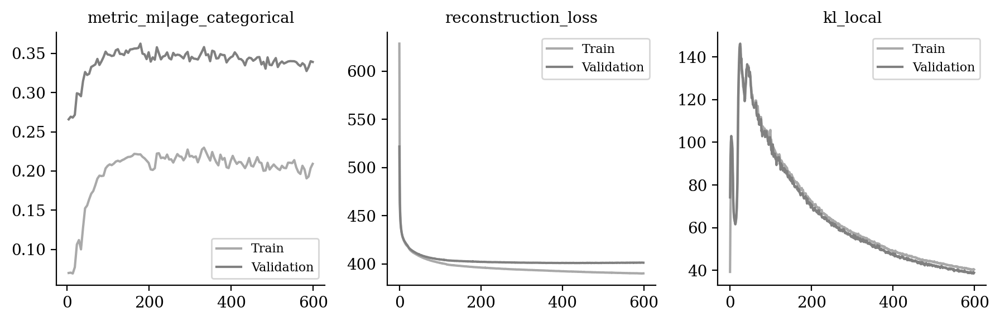

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [13]:
sublatent = DM.configurations.get_by_obs_key("age_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

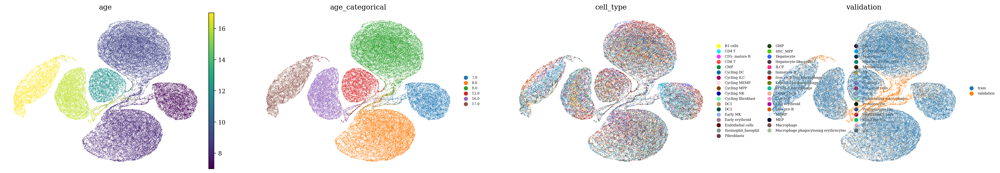

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

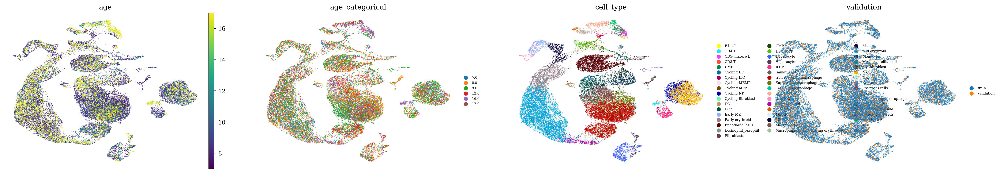

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

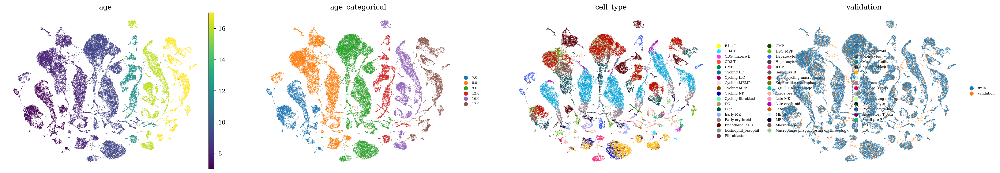

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )